In [1]:
import os
from PIL import Image
import numpy as np
import csv
import pandas as pd
import natsort
import pickle
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
cd drive/MyDrive/[한이음] 적대적 AI 공격에 대한 인공지능 보안기술 연구/3. 소스코드/GTSRB/

/content/drive/.shortcut-targets-by-id/1WKEjdIyqtzI-NV5o0O_ixsHslngaSiQX/[한이음] 적대적 AI 공격에 대한 인공지능 보안기술 연구/3. 소스코드/GTSRB


In [ ]:
metainfo = pd.read_csv("Meta.csv")
traininfo = pd.read_csv("Train.csv")
testinfo = pd.read_csv("Test.csv")

In [ ]:
imgs_path = "Train"
data_list = []
labels_list = []
result_class = [3,10,18]

for i in result_class:
    i_path = os.path.join(imgs_path, str(i)) #3,7, 9, 10, 11, 12,13, 17, 18, 25,35,38
    num = 0
    for img in os.listdir(i_path):
        im = Image.open(i_path +'/'+ img)
        im = im.resize((32,32))
        im = np.array(im)
        data_list.append(im)
        labels_list.append(i)
        num = num + 1
        if num == 1000:
            break;
data = np.array(data_list)
labels = np.array(labels_list)
print("Done")

Done


In [ ]:
#data rescale -> -1에서 1 사이로

data = (data.astype(np.float32) - 127.5) / 127.5
data.shape

(3000, 32, 32, 3)

In [ ]:
data

array([[[[-0.8509804 , -0.8352941 , -0.8039216 ],
         [-0.8352941 , -0.8352941 , -0.79607844],
         [-0.8117647 , -0.81960785, -0.78039217],
         ...,
         [-0.88235295, -0.88235295, -0.85882354],
         [-0.8666667 , -0.8745098 , -0.85882354],
         [-0.8352941 , -0.84313726, -0.827451  ]],

        [[-0.8509804 , -0.8352941 , -0.8039216 ],
         [-0.8352941 , -0.827451  , -0.79607844],
         [-0.8117647 , -0.8117647 , -0.7882353 ],
         ...,
         [-0.8745098 , -0.88235295, -0.85882354],
         [-0.8745098 , -0.88235295, -0.8666667 ],
         [-0.8509804 , -0.85882354, -0.84313726]],

        [[-0.84313726, -0.81960785, -0.79607844],
         [-0.84313726, -0.8352941 , -0.8039216 ],
         [-0.81960785, -0.8117647 , -0.7647059 ],
         ...,
         [-0.8666667 , -0.8745098 , -0.84313726],
         [-0.8745098 , -0.88235295, -0.85882354],
         [-0.8666667 , -0.8745098 , -0.8509804 ]],

        ...,

        [[-0.8980392 , -0.90588236, -0

Basic GAN

기본적인 GAN 구조이다

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt 

from keras.datasets import mnist

from keras.models import Sequential, Model

from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D

from tensorflow.keras.optimizers import Adam

noise_data = np.random.normal(0, 1, (32, 100))
#generated_images = 0.5 * generator.predict(np.random.normal(0, 1, (32, 100))) + 0.5

def show_images(generated_images, n=4, m=8, figsize=(9, 5)):
    f, axes = plt.subplots(n, m, figsize=figsize)
    #plt.subplots_adjust(top=1, bottom=0, hspace=0, wspace=0.05)
    for i in range(0, n):
        for j in range(0, m):
            ax = axes[i][j]
            ax.imshow(generated_images[i * m + j])
            ax.grid(False)
            ax.xaxis.set_ticks([])
            ax.yaxis.set_ticks([])
    plt.tight_layout()
    plt.savefig('20220729_basicgan.svg')
    plt.show()   
#show_images(0.5 * generator.predict(np.random.normal(0, 1, (32, 100))) + 0.5)


## create generator         
generator_ = Sequential([
    Dense(128 * 8 * 8, activation="relu", input_shape=(100,)), 
    Reshape((8, 8, 128)), 
    
    BatchNormalization(momentum=0.8), # what is batch normalization?? 
    UpSampling2D(), # what is upsampling?? 
    Conv2D(128, kernel_size=3, padding="same"),
    Activation("relu"), 
    
    BatchNormalization(momentum=0.8), 
    UpSampling2D(), 
    Conv2D(64, kernel_size=3, padding="same"), 
    Activation("relu"), 
    
    BatchNormalization(momentum=0.8), 
    Conv2D(3, kernel_size=3, padding="same"), 
    Activation("tanh"), 
])

noise_input = Input(shape=(100,), name="noise_input")
generator_base = Model(noise_input, generator_(noise_input), name="generator")

generator_.summary()# summary가 매우 유용하군요. 

optimizer = Adam(0.0002, 0.5)
generator_base.compile(loss='binary_crossentropy', optimizer=optimizer)

### create discriminator
discriminator_ = Sequential([
    Conv2D(32, kernel_size=3, strides=2, input_shape=(32, 32, 3), padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    
    Conv2D(64, kernel_size=3, strides=2, padding="same"), 
    ZeroPadding2D(padding=((0,1),(0,1))), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    BatchNormalization(momentum=0.8), 
    
    Conv2D(128, kernel_size=3, strides=2, padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    BatchNormalization(momentum=0.8), 
    
    Conv2D(256, kernel_size=3, strides=1, padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    Flatten(), 
    Dense(1, activation='sigmoid'), 
])
image_input = Input(shape=(32, 32, 3), name="image_input")

discriminator = Model(image_input, discriminator_(image_input), name="discriminator")
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
discriminator_.summary()

### Combined Model
noise_input2 = Input(shape=(100,), name="noise_input2")
"""
model과 sequential의 차이는?? 
가설1: 레이어를 쌓는 것이 sequential 이라면, sequential을 쌓는 것이 model인가???

1) 다음 모델의 경우는 랜덤으로 만든 이미지로부터 학습해서 새로운 이미지를 만들어내는 generator의 데이터를 
2) discriminator가 분류하는 형식으로 진행된다. 
"""
combined = Model(noise_input2, discriminator(generator_base(noise_input2)))
combined.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 8192)              827392    
                                                                 
 reshape_3 (Reshape)         (None, 8, 8, 128)         0         
                                                                 
 batch_normalization_5 (Batc  (None, 8, 8, 128)        512       
 hNormalization)                                                 
                                                                 
 up_sampling2d_2 (UpSampling  (None, 16, 16, 128)      0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 16, 16, 128)       147584    
                                                                 
 activation_3 (Activation)   (None, 16, 16, 128)      

In [ ]:
## training
"""
- 이 코드에서는 fit을 사용한 것이 아니라, train_on_batch를 사용했음. 
- train_on_batch와의 차이점?을 구글에 검색해보니, 큰 차이가 없다고 하긴 하는데
    - train_on_batch의 경우, 넘겨 받은 데이터에 대해서 gradient vector를 계산해서 적용하고 끝내는 것이고(1epoch)
    - fit의 경우는 epoch과 batch_size를 한번에 모두 넘겨준다는 것 정도가 차이가 된다. 
- GAN의 경우, discriminator의 학습시 마다 generator가 생성하는 데이터가 변화하게 된다. 
    - 즉 처음부터 모든 데이터가 존재하고 이를 한번에 학습시키는 fit과는 다르게, 한번씩 업데이트를 할때마다 모델이 변화하므로, 
    - train_on_batch를 사용하는 것이 매우 합당함.
"""
batch_size = 256
half_batch = batch_size // 2

def train(epochs, print_step=10):
    history = []
    for epoch in range(epochs):
        # discriminator 트레이닝 단계
        #######################################################################3
        # 데이터 절반은 실제 이미지, 절반은 generator가 생성한 가짜 이미지
        # discriminator가 실제 이미지와 가짜 이미지를 구별하도록 discriminator를 트레이닝
        discriminator.trainable = True
        d_loss_real = discriminator.train_on_batch(data[np.random.randint(0, data.shape[0], half_batch)], 
                                                   np.ones((half_batch, 1)))
        d_loss_fake = discriminator.train_on_batch(generator_base.predict(np.random.normal(0, 1, (half_batch, 100))), 
                                                   np.zeros((half_batch, 1)))
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        # generator 트레이닝 단계
        #######################################################################3
        # 전부 generator가 생성한 가짜 이미지를 사용. 
        # discriminator가 구별하지 못하도록 generator를 트레이닝
        
        """
        generator를 트레이닝할 때는, 반드시 discriminator가 필요함. 
        generator가 만든 image를 평가해야 하고, 그래야 feedback이 생겨서 generator가 학습됨. 
        따라서, generator는 combined model을 통해 학습시키는데, 이때, discriminator도 함께 학습되면 안되기 때문에
        discriminator.trainable 을 False로 변경시켜 둔다. 
        """
        noise = np.random.normal(0, 1, (batch_size, 100))
        discriminator.trainable = False 
        g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))  #여기서는 왜 만들어준 fake img의 y 값을 1로 두는 걸까 ..
        # 기록
        record = (epoch, d_loss[0], 100 * d_loss[1], g_loss[0], 100 * g_loss[1])
        history.append(record)
        if epoch % print_step == 0:
            print("%5d [D loss: %.3f, acc.: %.2f%%] [G loss: %.3f, acc.: %.2f%%]" % record)
            show_images(0.5 * generator_base.predict(noise_data) + 0.5)
    return history
#%%time, 은
history100 = train(10000, 500)
show_images(0.5 * generator_base.predict(noise_data) + 0.5)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
noise_data.shape

(32, 100)

In [ ]:
noise_data

array([[ 0.7527066 ,  0.29978412, -0.82480856, ...,  1.18970868,
        -1.1649061 , -2.86720791],
       [ 2.34654948,  1.02525401,  0.81953513, ...,  1.43198542,
        -1.02262604, -0.43062035],
       [-1.47140341, -2.08189392,  1.05296632, ..., -0.06566963,
        -0.84445505,  0.07831942],
       ...,
       [ 0.26856743,  2.50615073, -0.63397862, ..., -1.37897049,
         0.38728391,  0.12367551],
       [ 0.44031829, -0.9753865 , -1.06666773, ..., -0.42699162,
         1.17687884,  1.17309866],
       [ 0.72660939,  1.12624426,  0.43979321, ..., -0.47696495,
        -1.84114997,  1.02692425]])

In [ ]:
generator_base.predict(noise_data)

array([[[[ 0.04635853,  0.10062087,  0.2764779 ],
         [ 0.00604211,  0.17171194,  0.354805  ],
         [ 0.06558921,  0.19267279,  0.39341778],
         ...,
         [-0.03585143,  0.12165455,  0.35726377],
         [-0.01097763,  0.09188618,  0.38743845],
         [-0.0135379 ,  0.14377816,  0.31759664]],

        [[ 0.01739464,  0.13369977,  0.33318084],
         [ 0.00187585,  0.11745396,  0.31283426],
         [ 0.02974935,  0.07643445,  0.21131237],
         ...,
         [-0.03596114,  0.0375662 ,  0.3442733 ],
         [ 0.01839295,  0.13185808,  0.44231   ],
         [ 0.03765486,  0.16563754,  0.37914816]],

        [[-0.03250125,  0.03590796,  0.19786821],
         [-0.0307164 ,  0.09861475,  0.25812605],
         [ 0.0666953 ,  0.1077049 ,  0.24165003],
         ...,
         [ 0.0225007 ,  0.12045818,  0.2917337 ],
         [-0.00108665,  0.06691064,  0.3366835 ],
         [-0.12075699,  0.01706659,  0.25786388]],

        ...,

        [[-0.8396616 , -0.80356276, -0

In [ ]:
noise_data = np.random.normal(0, 1, (1, 100))
#generated_images = 0.5 * generator.predict(np.random.normal(0, 1, (32, 100))) + 0.5

generated_images = 0.5 * generator_base.predict(noise_data) + 0.5

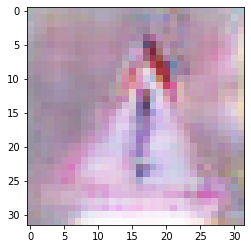

In [ ]:
plt.imshow(generated_images.reshape(32,32,3))

In [ ]:
pwd

'/content/drive/.shortcut-targets-by-id/1WKEjdIyqtzI-NV5o0O_ixsHslngaSiQX/[한이음] 적대적 AI 공격에 대한 인공지능 보안기술 연구/3. 소스코드/GTSRB'

In [ ]:
cd ..

/content/drive/.shortcut-targets-by-id/1WKEjdIyqtzI-NV5o0O_ixsHslngaSiQX/[한이음] 적대적 AI 공격에 대한 인공지능 보안기술 연구/3. 소스코드


In [ ]:
cd attacked0.04_GTSRB

/content/drive/.shortcut-targets-by-id/1WKEjdIyqtzI-NV5o0O_ixsHslngaSiQX/[한이음] 적대적 AI 공격에 대한 인공지능 보안기술 연구/3. 소스코드/attacked0.04_GTSRB


In [ ]:
predictions = pd.read_csv("predictions_test.csv")

In [ ]:
import natsort

imgs_path = "attacked"
data_list = []
labels_or_list = []
labels_at_list = []

for img in natsort.natsorted(os.listdir(imgs_path)):
    im = Image.open(imgs_path +'/'+ img)
    im = im.resize((32,32))
    im = np.array(im)
    data_list.append(im)
data_attacked = np.array(data_list)

for i in range(len(predictions.Original)):
    labels_or_list.append(predictions.Original[i])
    labels_at_list.append(predictions.Attacked[i])

labels_original = np.array(labels_or_list)
labels_attacked = np.array(labels_at_list)
print("Done")

Done


In [ ]:
data_attacked.shape

(5556, 32, 32, 3)

In [ ]:
import tensorflow as tf

In [ ]:
generator_base.trainable = False
discriminator.trainable = False

In [ ]:
L = 200
R = 10

z_list = []

img = data_attacked[3].reshape(32,32,3)
img_st = (img - np.mean(img)) / np.std(img) 
img_var = tf.Variable(img_st,dtype = float)
opt = tf.keras.optimizers.SGD(learning_rate=0.1,momentum = 0.7)

def compute():
    z_hats_recs = generator_base(z_var)
    z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
    num_dim = len(z_hats_recs.get_shape())
    axes = range(1, num_dim)
    image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
    rec_loss = tf.reduce_sum(image_rec_loss)
    print(rec_loss)
    return rec_loss

for r in range(R):
    z = np.random.normal(0, 1, (1, 100))
    z_var = tf.Variable(z,dtype = float)
    
    for l in range(L):
        opt.minimize(compute,[z_var])
    z_list.append(z_var)

#R번 반복    
    #L번 반복
        #랜덤 노이즈 z를 생성
        #랜덤 노이즈 z를 generator에 넣어 g(z) 생성
        #g(z)와 원래 image x의 l2 norm^2을 구함 (l2 loss)
        #l2 norm^2에서 z에 대한 기울기를 구함
        #z에 대한 기울기와 learning_rate을 통해 z를 갱신 시켜줌
#R 개의 z 중에 최적의 z 선택 (g(z)와 x의 l2 norm^2 값이 가장 작은 z 선택)

tf.Tensor(29.121113, shape=(), dtype=float32)
tf.Tensor(28.316807, shape=(), dtype=float32)
tf.Tensor(27.256119, shape=(), dtype=float32)
tf.Tensor(26.822662, shape=(), dtype=float32)
tf.Tensor(25.694859, shape=(), dtype=float32)
tf.Tensor(24.261803, shape=(), dtype=float32)
tf.Tensor(23.420588, shape=(), dtype=float32)
tf.Tensor(22.215214, shape=(), dtype=float32)
tf.Tensor(21.254913, shape=(), dtype=float32)
tf.Tensor(20.317953, shape=(), dtype=float32)
tf.Tensor(17.692438, shape=(), dtype=float32)
tf.Tensor(17.624128, shape=(), dtype=float32)
tf.Tensor(26.744408, shape=(), dtype=float32)
tf.Tensor(22.906527, shape=(), dtype=float32)
tf.Tensor(30.133888, shape=(), dtype=float32)
tf.Tensor(24.055964, shape=(), dtype=float32)
tf.Tensor(18.272003, shape=(), dtype=float32)
tf.Tensor(12.004139, shape=(), dtype=float32)
tf.Tensor(14.405953, shape=(), dtype=float32)
tf.Tensor(11.356722, shape=(), dtype=float32)
tf.Tensor(11.16592, shape=(), dtype=float32)
tf.Tensor(10.986359, shape=(), dtyp

In [ ]:
def compute_10(z):
    #generator_base.trainable = False #아직 더해야하는지 뺴야하는지 판단 x
    z_hats_recs = generator_base(z)
    z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
    num_dim = len(z_hats_recs.get_shape())
    axes = range(1, num_dim)
    image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
    rec_loss = tf.reduce_sum(image_rec_loss)
    return rec_loss

In [ ]:
loss_list = []
for i in range(len(z_list)):
    loss = compute_10(z_list[i])
    loss_list.append(loss)
print(np.argmin(loss_list))

5


In [ ]:
z_list[5]

<tf.Variable 'Variable:0' shape=(1, 100) dtype=float32, numpy=
array([[ 3.8841310e-01,  4.8636261e-02, -2.3421557e+00,  4.8049384e-01,
        -1.1509080e+00, -4.1854801e+00, -1.9187276e+00,  1.1240677e+00,
        -1.7330487e-01,  3.2845205e-01,  1.3944443e+00, -1.7946503e+00,
         3.0169675e-01, -1.2024595e+00,  1.3036944e+00,  9.0721482e-01,
        -1.8841383e+00,  2.3382118e-01,  5.4451323e-01, -1.4771169e+00,
        -9.3276811e-01,  8.0183530e-01,  9.4318563e-01,  2.9290671e+00,
         6.0664481e-01,  6.6096669e-01,  2.1545737e+00,  7.8488624e-01,
        -7.4974692e-01,  1.8643515e+00,  1.9124327e+00,  1.1468178e+00,
         2.6707572e-01, -2.6153536e+00,  1.7122176e+00, -2.2422969e+00,
         2.8054247e+00,  2.2244735e+00, -9.0566047e-02, -3.3441699e-01,
         3.8803101e+00,  6.3856071e-01, -1.7972652e+00,  1.6634852e-01,
         1.7380047e-01, -2.7794272e-01, -8.4932244e-01, -3.2736626e+00,
         7.3993045e-01,  1.6478340e-01,  1.5009998e+00,  1.3050241e+00,
 

In [ ]:
z_min = np.array(z_list[5])

In [ ]:
z_min

array([[ 3.8841310e-01,  4.8636261e-02, -2.3421557e+00,  4.8049384e-01,
        -1.1509080e+00, -4.1854801e+00, -1.9187276e+00,  1.1240677e+00,
        -1.7330487e-01,  3.2845205e-01,  1.3944443e+00, -1.7946503e+00,
         3.0169675e-01, -1.2024595e+00,  1.3036944e+00,  9.0721482e-01,
        -1.8841383e+00,  2.3382118e-01,  5.4451323e-01, -1.4771169e+00,
        -9.3276811e-01,  8.0183530e-01,  9.4318563e-01,  2.9290671e+00,
         6.0664481e-01,  6.6096669e-01,  2.1545737e+00,  7.8488624e-01,
        -7.4974692e-01,  1.8643515e+00,  1.9124327e+00,  1.1468178e+00,
         2.6707572e-01, -2.6153536e+00,  1.7122176e+00, -2.2422969e+00,
         2.8054247e+00,  2.2244735e+00, -9.0566047e-02, -3.3441699e-01,
         3.8803101e+00,  6.3856071e-01, -1.7972652e+00,  1.6634852e-01,
         1.7380047e-01, -2.7794272e-01, -8.4932244e-01, -3.2736626e+00,
         7.3993045e-01,  1.6478340e-01,  1.5009998e+00,  1.3050241e+00,
        -5.2243810e-02, -1.5144822e-03,  2.9070849e+00, -1.53527

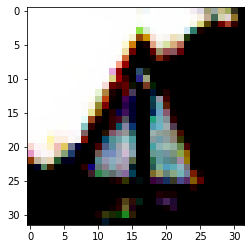

In [ ]:
plt.imshow(generator_base.predict(z_min).reshape(32,32,3))

In [ ]:
generator_base.predict(z_min)

array([[[[ 0.9998337 ,  0.99999905,  0.9999983 ],
         [ 1.        ,  1.        ,  1.        ],
         [ 1.        ,  1.        ,  1.        ],
         ...,
         [ 0.6301151 ,  0.67499036,  0.3635065 ],
         [ 0.21668717,  0.20200707,  0.12484998],
         [-0.40550554, -0.09809198, -0.20023318]],

        [[ 0.9999989 ,  1.        ,  1.        ],
         [ 1.        ,  1.        ,  1.        ],
         [ 1.        ,  1.        ,  1.        ],
         ...,
         [ 0.881872  ,  0.8358531 ,  0.82861626],
         [ 0.55635303,  0.44954073,  0.15529051],
         [-0.33867195, -0.11747973, -0.21432625]],

        [[ 1.        ,  1.        ,  1.        ],
         [ 1.        ,  1.        ,  1.        ],
         [ 1.        ,  1.        ,  1.        ],
         ...,
         [ 0.66937965,  0.2542001 ,  0.17402974],
         [ 0.19516945, -0.25329328, -0.5054179 ],
         [-0.38181287, -0.6975751 , -0.7153922 ]],

        ...,

        [[-0.7833488 , -0.8101609 , -0

In [ ]:
generated_images = 0.5 * generator_base.predict(z_min)+ 0.5

In [ ]:
generated_images

array([[[[0.99991685, 0.9999995 , 0.99999917],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [0.8150575 , 0.8374952 , 0.6817533 ],
         [0.6083436 , 0.6010035 , 0.562425  ],
         [0.29724723, 0.45095402, 0.39988342]],

        [[0.99999946, 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [0.94093597, 0.91792655, 0.91430813],
         [0.77817655, 0.72477037, 0.57764524],
         [0.33066404, 0.44126013, 0.39283687]],

        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [0.83468986, 0.62710005, 0.58701485],
         [0.5975847 , 0.37335336, 0.24729106],
         [0.30909356, 0.15121245, 0.14230391]],

        ...,

        [[0.1083256 , 0.09491956, 0.11123654],
         [0.12751463, 0.11484206, 0.10943383]

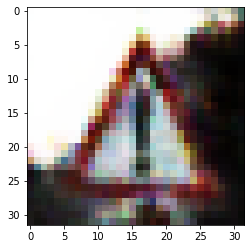

In [ ]:
plt.imshow(generated_images.reshape(32,32,3))

In [ ]:
generated_images.shape

(1, 32, 32, 3)

DCGAN

학습이 가능한 구조인 DCGAN을 구현하겠다

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt 

from keras.datasets import mnist

from keras.models import Sequential, Model

from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D

from tensorflow.keras.optimizers import Adam

noise_data = np.random.normal(0, 1, (32, 100))
#generated_images = 0.5 * generator.predict(np.random.normal(0, 1, (32, 100))) + 0.5

def show_images(generated_images, n=4, m=8, figsize=(9, 5)):
    f, axes = plt.subplots(n, m, figsize=figsize)
    #plt.subplots_adjust(top=1, bottom=0, hspace=0, wspace=0.05)
    for i in range(0, n):
        for j in range(0, m):
            ax = axes[i][j]
            ax.imshow(generated_images[i * m + j])
            ax.grid(False)
            ax.xaxis.set_ticks([])
            ax.yaxis.set_ticks([])
    plt.tight_layout()
    plt.savefig('20220729_basicgan.svg')
    plt.show()   
#show_images(0.5 * generator.predict(np.random.normal(0, 1, (32, 100))) + 0.5)


## create generator         
dc_generator_ = Sequential([
    Dense(128 * 8 * 8, activation= LeakyReLU(0.2), input_shape=(100,)), 
    Reshape((8, 8, 128)), 
    
    BatchNormalization(momentum=0.8), # what is batch normalization?? 
    UpSampling2D(), # what is upsampling?? 
    Conv2D(128, kernel_size=3, padding="same"),
    LeakyReLU(0.2), 
    
    BatchNormalization(momentum=0.8), 
    UpSampling2D(), 
    Conv2D(64, kernel_size=3, padding="same"), 
    LeakyReLU(0.2), 
    
    BatchNormalization(momentum=0.8), 
    Conv2D(3, kernel_size=3, padding="same"), 
    Activation("tanh"), 
])

noise_input = Input(shape=(100,), name="noise_input")
generator_dc = Model(noise_input, dc_generator_(noise_input), name="generator")

dc_generator_.summary()# summary가 매우 유용하군요. 

optimizer = Adam(0.0004, beta_1 = 0.2)
generator_dc.compile(loss='binary_crossentropy', optimizer=optimizer)

### create discriminator
dc_discriminator_ = Sequential([
    Conv2D(32, kernel_size=3, strides=2, input_shape=(32, 32, 3), padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    
    Conv2D(64, kernel_size=3, strides=2, padding="same"), 
    ZeroPadding2D(padding=((0,1),(0,1))), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    BatchNormalization(momentum=0.8), 
    
    Conv2D(128, kernel_size=3, strides=2, padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    BatchNormalization(momentum=0.8), 
    
    Conv2D(256, kernel_size=3, strides=1, padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    Flatten(), 
    Dense(1, activation='sigmoid'), 
])
image_input = Input(shape=(32, 32, 3), name="image_input")

discriminator_dc = Model(image_input, dc_discriminator_(image_input), name="discriminator")
discriminator_dc.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
dc_discriminator_.summary()

### Combined Model
noise_input2 = Input(shape=(100,), name="noise_input2")
"""
model과 sequential의 차이는?? 
가설1: 레이어를 쌓는 것이 sequential 이라면, sequential을 쌓는 것이 model인가???

1) 다음 모델의 경우는 랜덤으로 만든 이미지로부터 학습해서 새로운 이미지를 만들어내는 generator의 데이터를 
2) discriminator가 분류하는 형식으로 진행된다. 
"""
combined_dc = Model(noise_input2, discriminator_dc(generator_dc(noise_input2)))
combined_dc.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8192)              827392    
                                                                 
 reshape (Reshape)           (None, 8, 8, 128)         0         
                                                                 
 batch_normalization (BatchN  (None, 8, 8, 128)        512       
 ormalization)                                                   
                                                                 
 up_sampling2d (UpSampling2D  (None, 16, 16, 128)      0         
 )                                                               
                                                                 
 conv2d (Conv2D)             (None, 16, 16, 128)       147584    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0

In [ ]:
## training
"""
- 이 코드에서는 fit을 사용한 것이 아니라, train_on_batch를 사용했음. 
- train_on_batch와의 차이점?을 구글에 검색해보니, 큰 차이가 없다고 하긴 하는데
    - train_on_batch의 경우, 넘겨 받은 데이터에 대해서 gradient vector를 계산해서 적용하고 끝내는 것이고(1epoch)
    - fit의 경우는 epoch과 batch_size를 한번에 모두 넘겨준다는 것 정도가 차이가 된다. 
- GAN의 경우, discriminator의 학습시 마다 generator가 생성하는 데이터가 변화하게 된다. 
    - 즉 처음부터 모든 데이터가 존재하고 이를 한번에 학습시키는 fit과는 다르게, 한번씩 업데이트를 할때마다 모델이 변화하므로, 
    - train_on_batch를 사용하는 것이 매우 합당함.
"""
batch_size = 256
half_batch = batch_size // 2

def train(epochs, print_step=10):
    history = []
    for epoch in range(epochs):
        # discriminator 트레이닝 단계
        #######################################################################3
        # 데이터 절반은 실제 이미지, 절반은 generator가 생성한 가짜 이미지
        # discriminator가 실제 이미지와 가짜 이미지를 구별하도록 discriminator를 트레이닝
        discriminator_dc.trainable = True
        d_loss_real = discriminator_dc.train_on_batch(data[np.random.randint(0, data.shape[0], half_batch)], 
                                                   np.ones((half_batch, 1)))
        d_loss_fake = discriminator_dc.train_on_batch(generator_dc.predict(np.random.normal(0, 1, (half_batch, 100))), 
                                                   np.zeros((half_batch, 1)))
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        # generator 트레이닝 단계
        #######################################################################3
        # 전부 generator가 생성한 가짜 이미지를 사용. 
        # discriminator가 구별하지 못하도록 generator를 트레이닝
        
        """
        generator를 트레이닝할 때는, 반드시 discriminator가 필요함. 
        generator가 만든 image를 평가해야 하고, 그래야 feedback이 생겨서 generator가 학습됨. 
        따라서, generator는 combined model을 통해 학습시키는데, 이때, discriminator도 함께 학습되면 안되기 때문에
        discriminator.trainable 을 False로 변경시켜 둔다. 
        """
        noise = np.random.normal(0, 1, (batch_size, 100))
        discriminator_dc.trainable = False 
        g_loss = combined_dc.train_on_batch(noise, np.ones((batch_size, 1)))  #여기서는 왜 만들어준 fake img의 y 값을 1로 두는 걸까 ..
        # 기록
        record = (epoch, d_loss[0], 100 * d_loss[1], g_loss[0], 100 * g_loss[1])
        history.append(record)
        if epoch % print_step == 0:
            print("%5d [D loss: %.3f, acc.: %.2f%%] [G loss: %.3f, acc.: %.2f%%]" % record)
            show_images(0.5 * generator_dc.predict(noise_data) + 0.5)
    return history
#%%time, 은
history100 = train(10000, 500)
show_images(0.5 * generator_dc.predict(noise_data) + 0.5)

Output hidden; open in https://colab.research.google.com to view.

GAN with PCA

잠재공간 Z가 아닌 PCA에서 뽑아낸 주성분을 통해서 이미지를 생성하겠다

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
def Z_PCA(img_at_s):
    z_min = []
    img = img_at_s.reshape(-1,32,32,3)
    for i in range(len(img)):
        img_st =  (img[i] - np.mean(img[i])) / np.std(img[i]) 

        r = img_st[:,:,0] #r 채널로만 pca 진행
    
        pca_r_1 = PCA(n_components=10)
        pca_r_trans_1 = pca_r_1.fit_transform(r)

        r_transpose = pca_r_trans_1.transpose(1,0)
        pca_r_2 = PCA(n_components=10)
        pca_r_trans_2 = pca_r_2.fit_transform(r_transpose)
    
        z_min.append(pca_r_trans_2.reshape(1,100)) #pca로 생성된 5x5 이미지이다
    
    z = np.array(z_min).reshape(-1,100)
    return z

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt 

from keras.datasets import mnist

from keras.models import Sequential, Model

from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D

from tensorflow.keras.optimizers import Adam

#noise_data = np.random.normal(0, 1, (32, 100))
#generated_images = 0.5 * generator.predict(np.random.normal(0, 1, (32, 100))) + 0.5

def show_images(generated_images, n=4, m=8, figsize=(9, 5)):
    f, axes = plt.subplots(n, m, figsize=figsize)
    #plt.subplots_adjust(top=1, bottom=0, hspace=0, wspace=0.05)
    for i in range(0, n):
        for j in range(0, m):
            ax = axes[i][j]
            ax.imshow(generated_images[i * m + j])
            ax.grid(False)
            ax.xaxis.set_ticks([])
            ax.yaxis.set_ticks([])
    plt.tight_layout()
    plt.savefig('20220729_basicgan.svg')
    plt.show()   
#show_images(0.5 * generator.predict(np.random.normal(0, 1, (32, 100))) + 0.5)


## create generator         
dc_generator_ = Sequential([
    Dense(128 * 8 * 8, activation= LeakyReLU(0.2), input_shape=(100,)), 
    Reshape((8, 8, 128)), 
    
    BatchNormalization(momentum=0.8), # what is batch normalization?? 
    UpSampling2D(), # what is upsampling?? 
    Conv2D(128, kernel_size=3, padding="same"),
    LeakyReLU(0.2), 
    
    BatchNormalization(momentum=0.8), 
    UpSampling2D(), 
    Conv2D(64, kernel_size=3, padding="same"), 
    LeakyReLU(0.2), 
    
    BatchNormalization(momentum=0.8), 
    Conv2D(3, kernel_size=3, padding="same"), 
    Activation("tanh"), 
])

noise_input = Input(shape=(100,), name="noise_input")
generator_dc = Model(noise_input, dc_generator_(noise_input), name="generator")

dc_generator_.summary()# summary가 매우 유용하군요. 

optimizer = Adam(0.0004, beta_1 = 0.2)
generator_dc.compile(loss='binary_crossentropy', optimizer=optimizer)

### create discriminator
dc_discriminator_ = Sequential([
    Conv2D(32, kernel_size=3, strides=2, input_shape=(32, 32, 3), padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    
    Conv2D(64, kernel_size=3, strides=2, padding="same"), 
    ZeroPadding2D(padding=((0,1),(0,1))), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    BatchNormalization(momentum=0.8), 
    
    Conv2D(128, kernel_size=3, strides=2, padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    BatchNormalization(momentum=0.8), 
    
    Conv2D(256, kernel_size=3, strides=1, padding="same"), 
    LeakyReLU(alpha=0.2), 
    Dropout(0.25), 
    Flatten(), 
    Dense(1, activation='sigmoid'), 
])
image_input = Input(shape=(32, 32, 3), name="image_input")

discriminator_dc = Model(image_input, dc_discriminator_(image_input), name="discriminator")
discriminator_dc.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
dc_discriminator_.summary()

### Combined Model
noise_input2 = Input(shape=(100,), name="noise_input2")
"""
model과 sequential의 차이는?? 
가설1: 레이어를 쌓는 것이 sequential 이라면, sequential을 쌓는 것이 model인가???

1) 다음 모델의 경우는 랜덤으로 만든 이미지로부터 학습해서 새로운 이미지를 만들어내는 generator의 데이터를 
2) discriminator가 분류하는 형식으로 진행된다. 
"""
combined_dc = Model(noise_input2, discriminator_dc(generator_dc(noise_input2)))
combined_dc.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 8192)              827392    
                                                                 
 reshape_3 (Reshape)         (None, 8, 8, 128)         0         
                                                                 
 batch_normalization_15 (Bat  (None, 8, 8, 128)        512       
 chNormalization)                                                
                                                                 
 up_sampling2d_6 (UpSampling  (None, 16, 16, 128)      0         
 2D)                                                             
                                                                 
 conv2d_21 (Conv2D)          (None, 16, 16, 128)       147584    
                                                                 
 leaky_re_lu_22 (LeakyReLU)  (None, 16, 16, 128)      

    0 [D loss: 0.945, acc.: 32.42%] [G loss: 2.085, acc.: 0.39%]


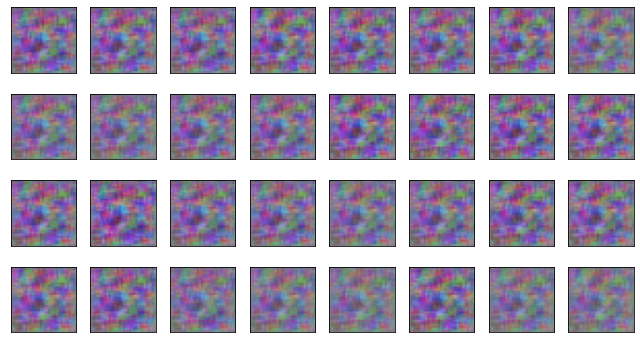

  500 [D loss: 0.415, acc.: 54.30%] [G loss: 0.759, acc.: 23.83%]


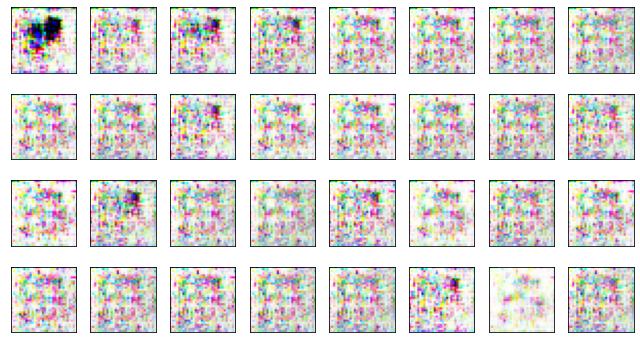

 1000 [D loss: 0.357, acc.: 72.66%] [G loss: 0.704, acc.: 31.64%]


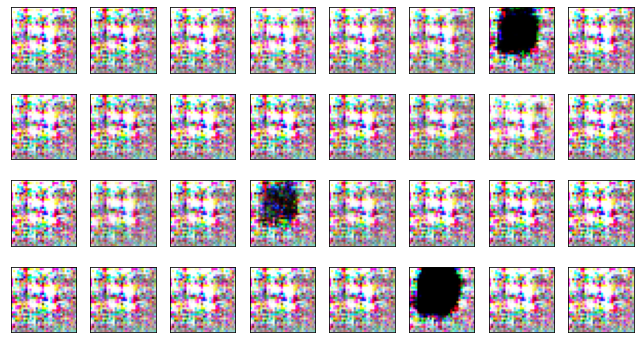

In [ ]:
## training
"""
- 이 코드에서는 fit을 사용한 것이 아니라, train_on_batch를 사용했음. 
- train_on_batch와의 차이점?을 구글에 검색해보니, 큰 차이가 없다고 하긴 하는데
    - train_on_batch의 경우, 넘겨 받은 데이터에 대해서 gradient vector를 계산해서 적용하고 끝내는 것이고(1epoch)
    - fit의 경우는 epoch과 batch_size를 한번에 모두 넘겨준다는 것 정도가 차이가 된다. 
- GAN의 경우, discriminator의 학습시 마다 generator가 생성하는 데이터가 변화하게 된다. 
    - 즉 처음부터 모든 데이터가 존재하고 이를 한번에 학습시키는 fit과는 다르게, 한번씩 업데이트를 할때마다 모델이 변화하므로, 
    - train_on_batch를 사용하는 것이 매우 합당함.
"""
batch_size = 256
half_batch = batch_size // 2

def train(epochs, print_step=10):
    history = []
    for epoch in range(epochs):
        # discriminator 트레이닝 단계
        #######################################################################3
        # 데이터 절반은 실제 이미지, 절반은 generator가 생성한 가짜 이미지
        # discriminator가 실제 이미지와 가짜 이미지를 구별하도록 discriminator를 트레이닝
        discriminator_dc.trainable = True
        d_loss_real = discriminator_dc.train_on_batch(data[np.random.randint(0, data.shape[0], half_batch)], 
                                                   np.ones((half_batch, 1)))
        d_loss_fake = discriminator_dc.train_on_batch(generator_dc.predict(Z_PCA(data[np.random.randint(0, data.shape[0], half_batch)])), 
                                                   np.zeros((half_batch, 1)))
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        # generator 트레이닝 단계
        #######################################################################3
        # 전부 generator가 생성한 가짜 이미지를 사용. 
        # discriminator가 구별하지 못하도록 generator를 트레이닝
        
        """
        generator를 트레이닝할 때는, 반드시 discriminator가 필요함. 
        generator가 만든 image를 평가해야 하고, 그래야 feedback이 생겨서 generator가 학습됨. 
        따라서, generator는 combined model을 통해 학습시키는데, 이때, discriminator도 함께 학습되면 안되기 때문에
        discriminator.trainable 을 False로 변경시켜 둔다. 
        """
        PCA_Z = Z_PCA(data[np.random.randint(0, data.shape[0], batch_size)]) #여기서 batchsize 대로 입력해주면 안될 것 같긴한데 ...! ㅠㅠ 
        discriminator_dc.trainable = False 
        g_loss = combined_dc.train_on_batch(PCA_Z, np.ones((batch_size, 1)))  #여기서는 왜 만들어준 fake img의 y 값을 1로 두는 걸까 ..
        # 기록
        record = (epoch, d_loss[0], 100 * d_loss[1], g_loss[0], 100 * g_loss[1])
        history.append(record)
        if epoch % print_step == 0:
            print("%5d [D loss: %.3f, acc.: %.2f%%] [G loss: %.3f, acc.: %.2f%%]" % record)
            show_images(0.5 * generator_dc.predict(PCA_Z) + 0.5)
    return history
#%%time, 은
history100 = train(10000, 500)
#show_images(0.5 * generator_dc.predict(noise_data) + 0.5)

CNN 모델, FGSM으로 Defense GAN 성능 확인하기

- 일단은 3, 10, 18에 대해서 학습 및 판별을 진행하겠다 

In [2]:
import os
from PIL import Image
import numpy as np
import csv
import pandas as pd
import natsort
import pickle
import matplotlib.pyplot as plt
import collections
from collections import OrderedDict

In [ ]:
pwd

'/content/drive/.shortcut-targets-by-id/1WKEjdIyqtzI-NV5o0O_ixsHslngaSiQX/[한이음] 적대적 AI 공격에 대한 인공지능 보안기술 연구/3. 소스코드/GTSRB'

In [ ]:
cd .. 

/content/drive/.shortcut-targets-by-id/1WKEjdIyqtzI-NV5o0O_ixsHslngaSiQX/[한이음] 적대적 AI 공격에 대한 인공지능 보안기술 연구/3. 소스코드


In [ ]:
cd GTSRB

/content/drive/.shortcut-targets-by-id/1WKEjdIyqtzI-NV5o0O_ixsHslngaSiQX/[한이음] 적대적 AI 공격에 대한 인공지능 보안기술 연구/3. 소스코드/GTSRB


In [4]:
classes = { 0:'Speed limit (20km/h)',
            1:'Speed limit (30km/h)', 
            2:'Speed limit (50km/h)', 
            3:'Speed limit (60km/h)', 
            4:'Speed limit (70km/h)', 
            5:'Speed limit (80km/h)', 
            6:'End of speed limit (80km/h)', 
            7:'Speed limit (100km/h)', 
            8:'Speed limit (120km/h)', 
            9:'No passing', 
            10:'No passing veh over 3.5 tons', 
            11:'Right-of-way at intersection', 
            12:'Priority road', 
            13:'Yield', 
            14:'Stop', 
            15:'No vehicles', 
            16:'Veh > 3.5 tons prohibited', 
            17:'No entry', 
            18:'General caution', 
            19:'Dangerous curve left', 
            20:'Dangerous curve right', 
            21:'Double curve', 
            22:'Bumpy road', 
            23:'Slippery road', 
            24:'Road narrows on the right', 
            25:'Road work', 
            26:'Traffic signals', 
            27:'Pedestrians', 
            28:'Children crossing', 
            29:'Bicycles crossing', 
            30:'Beware of ice/snow',
            31:'Wild animals crossing', 
            32:'End speed + passing limits', 
            33:'Turn right ahead', 
            34:'Turn left ahead', 
            35:'Ahead only', 
            36:'Go straight or right', 
            37:'Go straight or left', 
            38:'Keep right', 
            39:'Keep left', 
            40:'Roundabout mandatory', 
            41:'End of no passing', 
            42:'End no passing veh > 3.5 tons' }

In [5]:
metainfo = pd.read_csv("Meta.csv")
traininfo = pd.read_csv("Train.csv")
testinfo = pd.read_csv("Test.csv")

In [6]:
imgs_path = "Train"
data_list = []
labels_list = []
result_class = [3,10,18]

for i in result_class:
    i_path = os.path.join(imgs_path, str(i)) #3,10,18
    num = 0
    for img in os.listdir(i_path):
        im = Image.open(i_path +'/'+ img)
        im = im.resize((32,32))
        im = np.array(im)
        data_list.append(im)
        labels_list.append(i)
        num = num + 1
        if num == 1000:
            break;
data = np.array(data_list)
labels = np.array(labels_list)
print("Done")

KeyboardInterrupt: ignored

In [ ]:
labels_train = []
for i in labels:
    if i == 3:
        labels_train.append(0)
    elif i == 10:
        labels_train.append(1)
    elif i == 18:
        labels_train.append(2)
   
labels = np.array(labels_train)

In [ ]:
data_transpose = data.transpose(0,3,1,2)

In [7]:
import natsort

imgs_path = "Test"
data_list = []
labels_list = []

for img in natsort.natsorted(os.listdir(imgs_path)):
    im = Image.open(imgs_path +'/'+ img)
    im = im.resize((32,32))
    im = np.array(im)
    data_list.append(im)
data_test = np.array(data_list)

for i in range(len(testinfo.ClassId)):
    labels_list.append(testinfo.ClassId[i])

labels_test = np.array(labels_list)
print("Done")

Done


In [8]:
data_test.shape

(12630, 32, 32, 3)

In [9]:
labels_test_index = []
for i in range(len(labels_test)):
    if (labels_test[i] == 3) | (labels_test[i] == 10) | (labels_test[i] == 18):
        labels_test_index.append(i)

In [10]:
test_data = []
test_label = []
for i in labels_test_index:
    test_data.append(data_test[i])
    test_label.append(labels_test[i])
data_test = np.array(test_data)   
labels_test = np.array(test_label)

In [11]:
data_test_transpose = data_test.transpose(0,3,1,2)

In [12]:
labels_test_convert = []
for i in labels_test:
    if i == 3:
        labels_test_convert.append(0)
    elif i == 10:
        labels_test_convert.append(1)
    elif i == 18:
        labels_test_convert.append(2)

In [13]:
labels_test = np.array(labels_test_convert)

In [14]:
(x_train, t_train), (x_test, t_test) = (data_transpose, labels), (data_test_transpose, labels_test) 

NameError: ignored

In [ ]:
t_test

array([2, 0, 1, ..., 1, 2, 1])

In [ ]:
t_train

array([0, 0, 0, ..., 2, 2, 2])

In [ ]:
def im2col(input_data, filter_h, filter_w, stride=1, pad=0):
    """다수의 이미지를 입력받아 2차원 배열로 변환한다(평탄화).
    
    Parameters
    ----------
    input_data : 4차원 배열 형태의 입력 데이터(이미지 수, 채널 수, 높이, 너비)
    filter_h : 필터의 높이
    filter_w : 필터의 너비
    stride : 스트라이드
    pad : 패딩
    
    Returns
    -------
    col : 2차원 배열
    """
    N, C, H, W = input_data.shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1

    img = np.pad(input_data, [(0,0), (0,0), (pad, pad), (pad, pad)], 'constant')
    col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

    for y in range(filter_h):
        y_max = y + stride*out_h
        for x in range(filter_w):
            x_max = x + stride*out_w
            col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]

    col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N*out_h*out_w, -1)
    return col


def col2im(col, input_shape, filter_h, filter_w, stride=1, pad=0):
    """(im2col과 반대) 2차원 배열을 입력받아 다수의 이미지 묶음으로 변환한다.
    
    Parameters
    ----------
    col : 2차원 배열(입력 데이터)
    input_shape : 원래 이미지 데이터의 형상（예：(10, 1, 28, 28)）
    filter_h : 필터의 높이
    filter_w : 필터의 너비
    stride : 스트라이드
    pad : 패딩
    
    Returns
    -------
    img : 변환된 이미지들
    """
    N, C, H, W = input_shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1
    col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

    img = np.zeros((N, C, H + 2*pad + stride - 1, W + 2*pad + stride - 1))
    for y in range(filter_h):
        y_max = y + stride*out_h
        for x in range(filter_w):
            x_max = x + stride*out_w
            img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

    return img[:, :, pad:H + pad, pad:W + pad]



import numpy as np


def identity_function(x):
    return x


def step_function(x):
    return np.array(x > 0, dtype=np.int)


def sigmoid(x):
    return 1 / (1 + np.exp(-x))    


def sigmoid_grad(x):
    return (1.0 - sigmoid(x)) * sigmoid(x)
    

def relu(x):
    return np.maximum(0, x)


def relu_grad(x):
    grad = np.zeros(x)
    grad[x>=0] = 1
    return grad
    

def softmax(x):
    if x.ndim == 2:
        x = x.T
        x = x - np.max(x, axis=0)
        y = np.exp(x) / np.sum(np.exp(x), axis=0)
        return y.T 

    x = x - np.max(x) # 오버플로 대책
    return np.exp(x) / np.sum(np.exp(x))


def mean_squared_error(y, t):
    return 0.5 * np.sum((y-t)**2)


def cross_entropy_error(y, t):
    if y.ndim == 1:
        t = t.reshape(1, t.size)
        y = y.reshape(1, y.size)
        
    # 훈련 데이터가 원-핫 벡터라면 정답 레이블의 인덱스로 반환
    if t.size == y.size:
        t = t.argmax(axis=1)
             
    batch_size = y.shape[0]
    return -np.sum(np.log(y[np.arange(batch_size), t] + 1e-7)) / batch_size


def softmax_loss(X, t):
    y = softmax(X)
    return cross_entropy_error(y, t)

In [ ]:
import numpy as np


def identity_function(x):
    return x


def step_function(x):
    return np.array(x > 0, dtype=np.int)


def sigmoid(x):
    return 1 / (1 + np.exp(-x))    


def sigmoid_grad(x):
    return (1.0 - sigmoid(x)) * sigmoid(x)
    

def relu(x):
    return np.maximum(0, x)


def relu_grad(x):
    grad = np.zeros(x)
    grad[x>=0] = 1
    return grad
    

def softmax(x):
    if x.ndim == 2:
        x = x.T
        x = x - np.max(x, axis=0)
        y = np.exp(x) / np.sum(np.exp(x), axis=0)
        return y.T 

    x = x - np.max(x) # 오버플로 대책
    return np.exp(x) / np.sum(np.exp(x))


def mean_squared_error(y, t):
    return 0.5 * np.sum((y-t)**2)


def cross_entropy_error(y, t):
    if y.ndim == 1:
        t = t.reshape(1, t.size)
        y = y.reshape(1, y.size)
        
    # 훈련 데이터가 원-핫 벡터라면 정답 레이블의 인덱스로 반환
    if t.size == y.size:
        t = t.argmax(axis=1)
             
    batch_size = y.shape[0]
    return -np.sum(np.log(y[np.arange(batch_size), t] + 1e-7)) / batch_size


def softmax_loss(X, t):
    y = softmax(X)
    return cross_entropy_error(y, t)

In [ ]:
class Relu:
    def __init__(self):
        self.mask = None

    def forward(self, x):
        self.mask = (x <= 0)
        out = x.copy()
        out[self.mask] = 0

        return out

    def backward(self, dout):
        dout[self.mask] = 0
        dx = dout

        return dx


class Sigmoid:
    def __init__(self):
        self.out = None

    def forward(self, x):
        out = sigmoid(x)
        self.out = out
        return out

    def backward(self, dout):
        dx = dout * (1.0 - self.out) * self.out

        return dx


class Affine: #4차원 데이터가 입력으로 들어왔을 시에 사용되는 affine 계층
    def __init__(self, W, b):
        self.W = W
        self.b = b
        
        self.x = None
        self.original_x_shape = None
        # 가중치와 편향 매개변수의 미분
        self.dW = None
        self.db = None

    def forward(self, x):
        # 텐서 대응
        self.original_x_shape = x.shape
        x = x.reshape(x.shape[0], -1)
        self.x = x

        out = np.dot(self.x, self.W) + self.b

        return out

    def backward(self, dout):
        dx = np.dot(dout, self.W.T)
        self.dW = np.dot(self.x.T, dout)
        self.db = np.sum(dout, axis=0)
        
        dx = dx.reshape(*self.original_x_shape)  # 입력 데이터 모양 변경(텐서 대응)
        return dx


class SoftmaxWithLoss:
    def __init__(self):
        self.loss = None # 손실함수
        self.y = None    # softmax의 출력
        self.t = None    # 정답 레이블(원-핫 인코딩 형태)
        
    def forward(self, x, t):
        self.t = t
        self.y = softmax(x)
        self.loss = cross_entropy_error(self.y, self.t)
        
        return self.loss

    def backward(self, dout=1):
        batch_size = self.t.shape[0]
        if self.t.size == self.y.size: # 정답 레이블이 원-핫 인코딩 형태일 때
            dx = (self.y - self.t) / batch_size
        else:
            dx = self.y.copy()
            dx[np.arange(batch_size), self.t] -= 1
            dx = dx / batch_size
        
        return dx


class Dropout:
    """
    http://arxiv.org/abs/1207.0580
    """
    def __init__(self, dropout_ratio=0.5):
        self.dropout_ratio = dropout_ratio
        self.mask = None

    def forward(self, x, train_flg=True):
        if train_flg:
            self.mask = np.random.rand(*x.shape) > self.dropout_ratio
            return x * self.mask
        else:
            return x * (1.0 - self.dropout_ratio)

    def backward(self, dout):
        return dout * self.mask


class BatchNormalization:
    """
    http://arxiv.org/abs/1502.03167
    """
    def __init__(self, gamma, beta, momentum=0.9, running_mean=None, running_var=None):
        self.gamma = gamma
        self.beta = beta
        self.momentum = momentum
        self.input_shape = None # 합성곱 계층은 4차원, 완전연결 계층은 2차원  

        # 시험할 때 사용할 평균과 분산
        self.running_mean = running_mean
        self.running_var = running_var  
        
        # backward 시에 사용할 중간 데이터
        self.batch_size = None
        self.xc = None
        self.std = None
        self.dgamma = None
        self.dbeta = None

    def forward(self, x, train_flg=True):
        self.input_shape = x.shape
        if x.ndim != 2:
            N, C, H, W = x.shape
            x = x.reshape(N, -1)

        out = self.__forward(x, train_flg)
        
        return out.reshape(*self.input_shape)
            
    def __forward(self, x, train_flg):
        if self.running_mean is None:
            N, D = x.shape
            self.running_mean = np.zeros(D)
            self.running_var = np.zeros(D)
                        
        if train_flg:
            mu = x.mean(axis=0)
            xc = x - mu
            var = np.mean(xc**2, axis=0)
            std = np.sqrt(var + 10e-7)
            xn = xc / std
            
            self.batch_size = x.shape[0]
            self.xc = xc
            self.xn = xn
            self.std = std
            self.running_mean = self.momentum * self.running_mean + (1-self.momentum) * mu
            self.running_var = self.momentum * self.running_var + (1-self.momentum) * var            
        else:
            xc = x - self.running_mean
            xn = xc / ((np.sqrt(self.running_var + 10e-7)))
            
        out = self.gamma * xn + self.beta 
        return out

    def backward(self, dout):
        if dout.ndim != 2:
            N, C, H, W = dout.shape
            dout = dout.reshape(N, -1)

        dx = self.__backward(dout)

        dx = dx.reshape(*self.input_shape)
        return dx

    def __backward(self, dout):
        dbeta = dout.sum(axis=0)
        dgamma = np.sum(self.xn * dout, axis=0)
        dxn = self.gamma * dout
        dxc = dxn / self.std
        dstd = -np.sum((dxn * self.xc) / (self.std * self.std), axis=0)
        dvar = 0.5 * dstd / self.std
        dxc += (2.0 / self.batch_size) * self.xc * dvar
        dmu = np.sum(dxc, axis=0)
        dx = dxc - dmu / self.batch_size
        
        self.dgamma = dgamma
        self.dbeta = dbeta
        
        return dx


class Convolution:
    def __init__(self, W, b, stride=1, pad=0):
        self.W = W
        self.b = b
        self.stride = stride
        self.pad = pad
        
        # 중간 데이터（backward 시 사용）
        self.x = None   
        self.col = None
        self.col_W = None
        
        # 가중치와 편향 매개변수의 기울기
        self.dW = None
        self.db = None

    def forward(self, x):
        FN, C, FH, FW = self.W.shape
        N, C, H, W = x.shape
        out_h = 1 + int((H + 2*self.pad - FH) / self.stride)
        out_w = 1 + int((W + 2*self.pad - FW) / self.stride)

        col = im2col(x, FH, FW, self.stride, self.pad) #데이터를 2차원으로 펼쳐주는 것
        col_W = self.W.reshape(FN, -1).T #가중치 W(이 경우엔 필터)를 2차원으로 펼쳐주는 것

        out = np.dot(col, col_W) + self.b #데이터(2차원) * 필터(2차원) + bias
        out = out.reshape(N, out_h, out_w, -1).transpose(0, 3, 1, 2) #데이터를 (개수, 채널, 가로, 세로)로 맞춰주기

        self.x = x #원본 데이터 저장
        self.col = col #변환된 2차원 데이터 저장
        self.col_W = col_W #2차원으로 변환된 필터 저장

        return out

    def backward(self, dout): #softmax 역전파와 유사하다고 함.. 나는 잘 모르겠다
        FN, C, FH, FW = self.W.shape
        dout = dout.transpose(0,2,3,1).reshape(-1, FN) #dout 2차원 평면으로 변환

        self.db = np.sum(dout, axis=0) #conv 역전파
        self.dW = np.dot(self.col.T, dout) #conv 역전파
        self.dW = self.dW.transpose(1, 0).reshape(FN, C, FH, FW) #conv 역전파

        dcol = np.dot(dout, self.col_W.T) #전체 역전파 기울기
        dx = col2im(dcol, self.x.shape, FH, FW, self.stride, self.pad) #역전파 기울기, 다시 원래대로 

        return dx

    def backward_ad(self, dout): #softmax 역전파와 유사하다고 함.. 나는 잘 모르겠다
        FN, C, FH, FW = self.W.shape
        dout = dout.transpose(0,2,3,1).reshape(-1, FN) #dout 2차원 평면으로 변환

        self.db = np.sum(dout, axis=0) #conv 역전파
        self.dW = np.dot(self.col.T, dout) #conv 역전파
        self.dW = self.dW.transpose(1, 0).reshape(FN, C, FH, FW) #conv 역전파

        dcol_0 = np.dot(dout, self.col_W.T) #전체 역전파 기울기
        dx_0 = col2im(dcol_0, self.x.shape, FH, FW, self.stride, self.pad) #역전파 기울기, 다시 원래대로 

        return dcol_0, dx_0


class Pooling:
    def __init__(self, pool_h, pool_w, stride=1, pad=0):
        self.pool_h = pool_h
        self.pool_w = pool_w
        self.stride = stride
        self.pad = pad
        
        self.x = None
        self.arg_max = None

    def forward(self, x):
        N, C, H, W = x.shape
        out_h = int(1 + (H - self.pool_h) / self.stride)
        out_w = int(1 + (W - self.pool_w) / self.stride)

        col = im2col(x, self.pool_h, self.pool_w, self.stride, self.pad)
        col = col.reshape(-1, self.pool_h*self.pool_w)

        arg_max = np.argmax(col, axis=1)
        out = np.max(col, axis=1)
        out = out.reshape(N, out_h, out_w, C).transpose(0, 3, 1, 2)

        self.x = x
        self.arg_max = arg_max

        return out

    def backward(self, dout): #relu 역전파와 비슷하다고 함.. 나는 잘 모르겠다
        dout = dout.transpose(0, 2, 3, 1)
        
        pool_size = self.pool_h * self.pool_w
        dmax = np.zeros((dout.size, pool_size))
        dmax[np.arange(self.arg_max.size), self.arg_max.flatten()] = dout.flatten()
        dmax = dmax.reshape(dout.shape + (pool_size,)) 
        
        dcol = dmax.reshape(dmax.shape[0] * dmax.shape[1] * dmax.shape[2], -1)
        dx = col2im(dcol, self.x.shape, self.pool_h, self.pool_w, self.stride, self.pad)
        
        return dx

In [ ]:
import numpy as np

def _numerical_gradient_1d(f, x):
    h = 1e-4 # 0.0001
    grad = np.zeros_like(x)
    
    for idx in range(x.size):
        tmp_val = x[idx]
        x[idx] = float(tmp_val) + h
        fxh1 = f(x) # f(x+h)
        
        x[idx] = tmp_val - h 
        fxh2 = f(x) # f(x-h)
        grad[idx] = (fxh1 - fxh2) / (2*h)
        
        x[idx] = tmp_val # 값 복원
        
    return grad


def numerical_gradient_2d(f, X):
    if X.ndim == 1:
        return _numerical_gradient_1d(f, X)
    else:
        grad = np.zeros_like(X)
        
        for idx, x in enumerate(X):
            grad[idx] = _numerical_gradient_1d(f, x)
        
        return grad


def numerical_gradient(f, x):
    h = 1e-4 # 0.0001
    grad = np.zeros_like(x)
    
    it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
    while not it.finished:
        idx = it.multi_index
        tmp_val = x[idx]
        x[idx] = float(tmp_val) + h
        fxh1 = f(x) # f(x+h)
        
        x[idx] = tmp_val - h 
        fxh2 = f(x) # f(x-h)
        grad[idx] = (fxh1 - fxh2) / (2*h)
        
        x[idx] = tmp_val # 값 복원
        it.iternext()   
        
    return grad

In [ ]:
class SimpleConvNet:
    """단순한 합성곱 신경망
    
    conv - relu - pool - affine - relu - affine - softmax
    
    Parameters
    ----------
    input_size : 입력 크기（MNIST의 경우엔 784）
    hidden_size_list : 각 은닉층의 뉴런 수를 담은 리스트（e.g. [100, 100, 100]）
    output_size : 출력 크기（MNIST의 경우엔 10）
    activation : 활성화 함수 - 'relu' 혹은 'sigmoid'
    weight_init_std : 가중치의 표준편차 지정（e.g. 0.01）
        'relu'나 'he'로 지정하면 'He 초깃값'으로 설정
        'sigmoid'나 'xavier'로 지정하면 'Xavier 초깃값'으로 설정
    """
    def __init__(self, input_dim=(3, 32, 32), 
                 conv_param={'filter_num':30, 'filter_size':5, 'pad':0, 'stride':1},
                 hidden_size=100, output_size=12, weight_init_std=0.01):
        filter_num = conv_param['filter_num']
        filter_size = conv_param['filter_size']
        filter_pad = conv_param['pad']
        filter_stride = conv_param['stride']
        input_size = input_dim[1]
        conv_output_size = (input_size - filter_size + 2*filter_pad) / filter_stride + 1
        pool_output_size = int(filter_num * (conv_output_size/2) * (conv_output_size/2))

        # 가중치 초기화
        self.params = {}
        self.params['W1'] = weight_init_std * \
                            np.random.randn(filter_num, input_dim[0], filter_size, filter_size) #2차원 데이터가 5x5, 채널이 3인 필터가 30개 있다는 것이다.
        self.params['b1'] = np.zeros(filter_num)
        self.params['W2'] = weight_init_std * \
                            np.random.randn(pool_output_size, hidden_size)
        self.params['b2'] = np.zeros(hidden_size)
        self.params['W3'] = weight_init_std * \
                            np.random.randn(hidden_size, output_size)
        self.params['b3'] = np.zeros(output_size)

        # 계층 생성
        self.layers = OrderedDict()
        self.layers['Conv1'] = Convolution(self.params['W1'], self.params['b1'],
                                           conv_param['stride'], conv_param['pad'])
        self.layers['Relu1'] = Relu()
        self.layers['Pool1'] = Pooling(pool_h=2, pool_w=2, stride=2)
        self.layers['Affine1'] = Affine(self.params['W2'], self.params['b2'])
        self.layers['Relu2'] = Relu()
        self.layers['Affine2'] = Affine(self.params['W3'], self.params['b3'])

        self.last_layer = SoftmaxWithLoss()

    def predict(self, x):
        for layer in self.layers.values():
            x = layer.forward(x)

        return x

    def loss(self, x, t):
        """손실 함수를 구한다.
        Parameters
        ----------
        x : 입력 데이터
        t : 정답 레이블
        """
        y = self.predict(x) #softmax 층 전까지의 forward propagation
        return self.last_layer.forward(y, t) #softmax층의 forward propagation 하고 반환된 loss 값

    def accuracy(self, x, t, batch_size=100):
        if t.ndim != 1 : t = np.argmax(t, axis=1)
        
        acc = 0.0
        
        for i in range(int(x.shape[0] / batch_size)):
            tx = x[i*batch_size:(i+1)*batch_size]
            tt = t[i*batch_size:(i+1)*batch_size]
            y = self.predict(tx)
            y = np.argmax(y, axis=1)
            acc += np.sum(y == tt) 
        
        return acc / x.shape[0]

    def numerical_gradient(self, x, t):
        """기울기를 구한다（수치미분）.
        Parameters
        ----------
        x : 입력 데이터
        t : 정답 레이블
        Returns
        -------
        각 층의 기울기를 담은 사전(dictionary) 변수
            grads['W1']、grads['W2']、... 각 층의 가중치
            grads['b1']、grads['b2']、... 각 층의 편향
        """
        loss_w = lambda w: self.loss(x, t)

        grads = {}
        for idx in (1, 2, 3):
            grads['W' + str(idx)] = numerical_gradient(loss_w, self.params['W' + str(idx)])
            grads['b' + str(idx)] = numerical_gradient(loss_w, self.params['b' + str(idx)])

        return grads

    def gradient(self, x, t):
        """기울기를 구한다(오차역전파법).
        Parameters
        ----------
        x : 입력 데이터
        t : 정답 레이블
        Returns
        -------
        각 층의 기울기를 담은 사전(dictionary) 변수
            grads['W1']、grads['W2']、... 각 층의 가중치
            grads['b1']、grads['b2']、... 각 층의 편향
        """
        # forward
        self.loss(x, t) #마지막 층까지 forward하고 loss에 값 저장

        # backward
        dout = 1 #softmax&crossentropy 층의 첫번 째 역전파 값
        dout = self.last_layer.backward(dout) #softmaxwithcrossentropy 층의 역전파

        layers = list(self.layers.values())
        layers.reverse()
        for layer in layers:
            dout = layer.backward(dout)

        # 결과 저장
        grads = {}
        grads['W1'], grads['b1'] = self.layers['Conv1'].dW, self.layers['Conv1'].db
        grads['W2'], grads['b2'] = self.layers['Affine1'].dW, self.layers['Affine1'].db
        grads['W3'], grads['b3'] = self.layers['Affine2'].dW, self.layers['Affine2'].db

        return grads
        
    def gradient_ad(self, x, t):
        """기울기를 구한다(오차역전파법).
        Parameters
        ----------
        x : 입력 데이터
        t : 정답 레이블
        Returns
        -------
        각 층의 기울기를 담은 사전(dictionary) 변수
            grads['W1']、grads['W2']、... 각 층의 가중치
            grads['b1']、grads['b2']、... 각 층의 편향
        """
        # forward
        self.loss(x, t) #마지막 층까지 forward하고 loss에 값 저장

        # backward
        dout = 1 #softmax&crossentropy 층의 첫번 째 역전파 값
        dout = self.last_layer.backward(dout) #softmaxwithcrossentropy 층의 역전파
        
        layers = list(self.layers.values())
        layers.reverse()
        for layer in layers[:-1]:
            dout = layer.backward(dout)
        
        dout_ad = layers[-1].backward(dout)
            
        return dout_ad

    def save_params(self, file_name="params.pkl"):
        params = {}
        for key, val in self.params.items():
            params[key] = val
        with open(file_name, 'wb') as f:
            pickle.dump(params, f)

    def load_params(self, file_name="params.pkl"):
        with open(file_name, 'rb') as f:
            params = pickle.load(f)
        for key, val in params.items():
            self.params[key] = val

        for i, key in enumerate(['Conv1', 'Affine1', 'Affine2']):
            self.layers[key].W = self.params['W' + str(i+1)]
            self.layers[key].b = self.params['b' + str(i+1)]

In [ ]:
class Trainer:
    """신경망 훈련을 대신 해주는 클래스
    """
    def __init__(self, network, x_train, t_train, x_test, t_test,
                 epochs=20, mini_batch_size=100,
                 optimizer='SGD', optimizer_param={'lr':0.01}, 
                 evaluate_sample_num_per_epoch=None, verbose=True):
        self.network = network
        self.verbose = verbose
        self.x_train = x_train
        self.t_train = t_train
        self.x_test = x_test
        self.t_test = t_test
        self.epochs = epochs
        self.batch_size = mini_batch_size
        self.evaluate_sample_num_per_epoch = evaluate_sample_num_per_epoch

        # optimzer
        optimizer_class_dict = {'sgd':SGD, 'momentum':Momentum, 'nesterov':Nesterov,
                                'adagrad':AdaGrad, 'rmsprpo':RMSprop, 'adam':Adam}
        self.optimizer = optimizer_class_dict[optimizer.lower()](**optimizer_param)
        
        self.train_size = x_train.shape[0]
        self.iter_per_epoch = max(self.train_size / mini_batch_size, 1)
        self.max_iter = int(epochs * self.iter_per_epoch)
        self.current_iter = 0
        self.current_epoch = 0
        
        self.train_loss_list = []
        self.train_acc_list = []
        self.test_acc_list = []

    def train_step(self):
        batch_mask = np.random.choice(self.train_size, self.batch_size)
        x_batch = self.x_train[batch_mask]
        t_batch = self.t_train[batch_mask]
        
        grads = self.network.gradient(x_batch, t_batch)
        self.optimizer.update(self.network.params, grads)
        
        loss = self.network.loss(x_batch, t_batch) #이미 gradient에서 loss를 구해주기는 했지만 값을 보여주기 위해 다시 한번 loss를 진행하는 듯
        self.train_loss_list.append(loss)
        if self.verbose: print("train loss:" + str(loss))
        
        if self.current_iter % self.iter_per_epoch == 0:
            self.current_epoch += 1
            
            x_train_sample, t_train_sample = self.x_train, self.t_train
            x_test_sample, t_test_sample = self.x_test, self.t_test
            if not self.evaluate_sample_num_per_epoch is None:
                t = self.evaluate_sample_num_per_epoch
                x_train_sample, t_train_sample = self.x_train[:t], self.t_train[:t]
                x_test_sample, t_test_sample = self.x_test[:t], self.t_test[:t]
                
            train_acc = self.network.accuracy(x_train_sample, t_train_sample)
            test_acc = self.network.accuracy(x_test_sample, t_test_sample)
            self.train_acc_list.append(train_acc)
            self.test_acc_list.append(test_acc)

            if self.verbose: print("=== epoch:" + str(self.current_epoch) + ", train acc:" + str(train_acc) + ", test acc:" + str(test_acc) + " ===")
        self.current_iter += 1

    def train(self):
        for i in range(self.max_iter):
            self.train_step()

        test_acc = self.network.accuracy(self.x_test, self.t_test)

        if self.verbose:
            print("=============== Final Test Accuracy ===============")
            print("test acc:" + str(test_acc))

    def predict(self,x):
        if x.ndim != 4:
            x = x.reshape(-1,3,32,32)
        prediction = self.network.predict(x)
        result = np.argmax(prediction,axis = 1)
        return result

    def fgsm_attack(self,x,t):
        x = x.reshape(-1,3,32,32)
        grads = self.network.gradient(x,t)
        

In [ ]:
# coding: utf-8
import numpy as np

class SGD:

    """확률적 경사 하강법（Stochastic Gradient Descent）"""

    def __init__(self, lr=0.01):
        self.lr = lr
        
    def update(self, params, grads):
        for key in params.keys():
            params[key] -= self.lr * grads[key] #확률적 경사 하강법에 따라 가중치 갱신


class Momentum:

    """모멘텀 SGD"""

    def __init__(self, lr=0.01, momentum=0.9):
        self.lr = lr
        self.momentum = momentum
        self.v = None
        
    def update(self, params, grads):
        if self.v is None:
            self.v = {}
            for key, val in params.items():                                
                self.v[key] = np.zeros_like(val)
                
        for key in params.keys():
            self.v[key] = self.momentum*self.v[key] - self.lr*grads[key] 
            params[key] += self.v[key]


class Nesterov:

    """Nesterov's Accelerated Gradient (http://arxiv.org/abs/1212.0901)"""
    # NAG는 모멘텀에서 한 단계 발전한 방법이다. (http://newsight.tistory.com/224)
    
    def __init__(self, lr=0.01, momentum=0.9):
        self.lr = lr
        self.momentum = momentum
        self.v = None
        
    def update(self, params, grads):
        if self.v is None:
            self.v = {}
            for key, val in params.items():
                self.v[key] = np.zeros_like(val)
            
        for key in params.keys():
            self.v[key] *= self.momentum
            self.v[key] -= self.lr * grads[key]
            params[key] += self.momentum * self.momentum * self.v[key]
            params[key] -= (1 + self.momentum) * self.lr * grads[key]


class AdaGrad:

    """AdaGrad"""

    def __init__(self, lr=0.01):
        self.lr = lr
        self.h = None
        
    def update(self, params, grads):
        if self.h is None:
            self.h = {}
            for key, val in params.items():
                self.h[key] = np.zeros_like(val)
            
        for key in params.keys():
            self.h[key] += grads[key] * grads[key]
            params[key] -= self.lr * grads[key] / (np.sqrt(self.h[key]) + 1e-7)


class RMSprop:

    """RMSprop"""

    def __init__(self, lr=0.01, decay_rate = 0.99):
        self.lr = lr
        self.decay_rate = decay_rate
        self.h = None
        
    def update(self, params, grads):
        if self.h is None:
            self.h = {}
            for key, val in params.items():
                self.h[key] = np.zeros_like(val)
            
        for key in params.keys():
            self.h[key] *= self.decay_rate
            self.h[key] += (1 - self.decay_rate) * grads[key] * grads[key]
            params[key] -= self.lr * grads[key] / (np.sqrt(self.h[key]) + 1e-7)


class Adam:

    """Adam (http://arxiv.org/abs/1412.6980v8)"""

    def __init__(self, lr=0.001, beta1=0.9, beta2=0.999):
        self.lr = lr
        self.beta1 = beta1
        self.beta2 = beta2
        self.iter = 0
        self.m = None
        self.v = None
        
    def update(self, params, grads):
        if self.m is None:
            self.m, self.v = {}, {}
            for key, val in params.items():
                self.m[key] = np.zeros_like(val)
                self.v[key] = np.zeros_like(val)
        
        self.iter += 1
        lr_t  = self.lr * np.sqrt(1.0 - self.beta2**self.iter) / (1.0 - self.beta1**self.iter)         
        
        for key in params.keys():
            #self.m[key] = self.beta1*self.m[key] + (1-self.beta1)*grads[key]
            #self.v[key] = self.beta2*self.v[key] + (1-self.beta2)*(grads[key]**2)
            self.m[key] += (1 - self.beta1) * (grads[key] - self.m[key])
            self.v[key] += (1 - self.beta2) * (grads[key]**2 - self.v[key])
            
            params[key] -= lr_t * self.m[key] / (np.sqrt(self.v[key]) + 1e-7)
            
            #unbias_m += (1 - self.beta1) * (grads[key] - self.m[key]) # correct bias
            #unbisa_b += (1 - self.beta2) * (grads[key]*grads[key] - self.v[key]) # correct bias
            #params[key] += self.lr * unbias_m / (np.sqrt(unbisa_b) + 1e-7)

train loss:1.0578787567904204
=== epoch:1, train acc:0.003, test acc:0.264 ===
train loss:1.0727683726144193
train loss:1.0296327831761471
train loss:1.0214580621241487
train loss:1.0059893425836544
train loss:0.983531210582605
train loss:0.9757974412720681
train loss:0.9129703463723281
train loss:0.9410345690810338
train loss:0.938353237145688
train loss:0.9416088446575459
train loss:0.9101112249743574
train loss:0.9218209605073615
train loss:0.8775402882951795
train loss:0.9139734395166772
train loss:0.9144867018556053
train loss:0.8229747340340403
train loss:0.8724865782405432
train loss:0.8543789530867214
train loss:0.8740915965716712
train loss:0.9412932580705435
train loss:0.8423379498886034
train loss:0.8472661729828295
train loss:0.8225489199950029
train loss:0.7802008151349756
train loss:0.7750094848007817
train loss:0.7873370869750357
train loss:0.7946365320887994
train loss:0.7104701165011177
train loss:0.7559226391732331
train loss:0.7664070041515697
=== epoch:2, train acc:

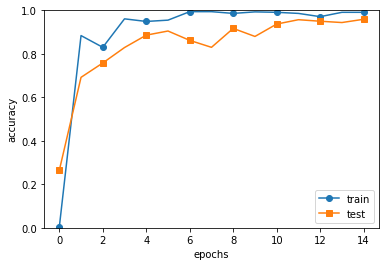

In [ ]:
# 데이터 읽기
#(x_train, t_train), (x_test, t_test) = load_mnist(flatten=False)

# 시간이 오래 걸릴 경우 데이터를 줄인다.
#x_train, t_train = x_train[:5000], t_train[:5000]
#x_test, t_test = x_test[:1000], t_test[:1000]

max_epochs = 15

network = SimpleConvNet(input_dim=(3,32,32), 
                        conv_param = {'filter_num': 30, 'filter_size': 5, 'pad': 0, 'stride': 1},
                        hidden_size=100, output_size=3, weight_init_std=0.01)
                        
trainer = Trainer(network, x_train, t_train, x_test, t_test,
                  epochs=max_epochs, mini_batch_size=100,
                  optimizer='SGD', optimizer_param={'lr': 0.001},
                  evaluate_sample_num_per_epoch=1000)
trainer.train()

# 매개변수 보존
network.save_params("params.pkl")
print("Saved Network Parameters!")

# 그래프 그리기
markers = {'train': 'o', 'test': 's'}
x = np.arange(max_epochs)
plt.plot(x, trainer.train_acc_list, marker='o', label='train', markevery=2)
plt.plot(x, trainer.test_acc_list, marker='s', label='test', markevery=2)
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.ylim(0, 1.0)
plt.legend(loc='lower right')
plt.show()

In [ ]:
trainer.predict(x_test[:5])

array([2, 2, 1, 0, 2])

In [ ]:
for i in range(5):
    x = x_test[i].reshape(-1,3,32,32)
    print(x.shape)
    result = trainer.predict(x)
    print(result)

(1, 3, 32, 32)
[2]
(1, 3, 32, 32)
[2]
(1, 3, 32, 32)
[1]
(1, 3, 32, 32)
[0]
(1, 3, 32, 32)
[2]


## 분류기 : lenet5

lenet5 분류기를 활용하여 조금 더 성능 높은 분류를 진행

In [ ]:
from tensorflow.python import keras
from keras.utils.np_utils import to_categorical  
import numpy as np

In [ ]:
(x_train, t_train), (x_test, t_test) = (data, labels), (data_test, labels_test) 

In [ ]:
t_train = to_categorical(t_train, 3)

In [ ]:
t_train

array([[1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       ...,
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.]], dtype=float32)

In [ ]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import models
from tensorflow.keras.layers import Conv2D, Flatten, AvgPool2D, Dense

In [ ]:
def lenet5():
  model = models.Sequential([
      Conv2D(filters = 6, kernel_size = 5, strides = 1, activation = 'tanh', input_shape = (32,32,3)),
      AvgPool2D(pool_size = (2,2),strides = 2),
      Conv2D(filters = 16, kernel_size = 5, strides = 1, activation = 'tanh'),
      AvgPool2D(pool_size = (2,2), strides = 2),
      Conv2D(filters = 120, kernel_size = 5, strides = 1, activation = 'tanh'),
      Flatten(),
      Dense(84, activation = 'tanh'),
      Dense(3, activation = 'softmax')
  ])

  return model

In [ ]:
model_classifier = lenet5()

In [ ]:
model_classifier.compile(loss=tf.keras.losses.categorical_crossentropy,
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

In [ ]:
history = model_classifier.fit(x_train, t_train, 
                    batch_size=32, 
                    epochs=5)

Epoch 1/5
94/94 [==============================] - 1s 5ms/step - loss: 0.2872 - accuracy: 0.9023
Epoch 2/5
94/94 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.9863
Epoch 3/5
94/94 [==============================] - 0s 4ms/step - loss: 0.0316 - accuracy: 0.9910
Epoch 4/5
94/94 [==============================] - 0s 4ms/step - loss: 0.0488 - accuracy: 0.9873
Epoch 5/5
94/94 [==============================] - 0s 4ms/step - loss: 0.0215 - accuracy: 0.9953


In [ ]:
predict_x=model_classifier.predict(x_test) 
classes_x=np.argmax(predict_x,axis=1)
from sklearn.metrics import accuracy_score
print('Test accuracy: ',accuracy_score(t_test, classes_x)*100)

Test accuracy:  98.66666666666667


FGSM

In [ ]:
epsilons = [0, .02, .04,.06,.08,.1]

In [ ]:
# FGSM 공격 코드
def fgsm_attack(image, epsilon, data_grad):
    # data_grad 의 요소별 부호 값을 얻어옵니다
    sign_data_grad = np.sign(data_grad) * 255
    perturbed_image = image + epsilon*sign_data_grad
    # 값 범위를 [0,1]로 유지하기 위해 자르기(clipping)를 추가합니다
    #perturbed_image = np.clip(perturbed_image, 0, 1), 이 경우에는 정규화를 진행하지 않았기 때문에 clipping x
    # 작은 변화가 적용된 이미지를 리턴합니다
    return perturbed_image

In [ ]:
## predict_output에 한개씩 넣는 것부터 구현해야한다. (전체가 들어가는 것만 정상 작동함)

def test(model, test_x, test_y, epsilon):

    # 정확도 카운터
    correct = 0
    adv_examples = []
    
    # 테스트 셋의 모든 예제에 대해 루프를 돕니다
    
    for i in range(len(test_x)):
        data = test_x[i].reshape(-1,3,32,32)
        target = test_y[i].reshape(1)
        
        result = model.predict(data)
        init_output = int(result)
 
        if init_output != target:
            continue

        data_grad = model.network.gradient_ad(data,target)
        
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        output = model.predict(perturbed_data)

        final_pred = int(output)

        if final_pred == int(target):
            correct += 1
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))
        else:
            if len(adv_examples) < 5:
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))

    # 해당 엡실론에서의 최종 정확도를 계산합니다
    final_acc = correct/float(len(test_x))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_x), final_acc))

    # 정확도와 적대적 예제를 리턴합니다
    return final_acc, adv_examples

In [ ]:
accuracies = []
examples = []

# 각 엡실론에 대해 테스트 함수를 실행합니다
for eps in epsilons:
    acc, ex = test(trainer, x_test, t_test, eps)
    accuracies.append(acc)
    examples.append(ex)

Epsilon: 0	Test Accuracy = 1430 / 1500 = 0.9533333333333334
Epsilon: 0.02	Test Accuracy = 540 / 1500 = 0.36
Epsilon: 0.04	Test Accuracy = 137 / 1500 = 0.09133333333333334
Epsilon: 0.06	Test Accuracy = 43 / 1500 = 0.028666666666666667
Epsilon: 0.08	Test Accuracy = 11 / 1500 = 0.007333333333333333
Epsilon: 0.1	Test Accuracy = 0 / 1500 = 0.0


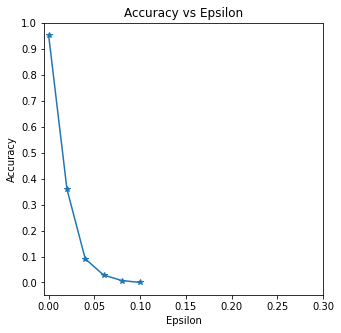

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(epsilons, accuracies, "*-")
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, .35, step=0.05))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon")
plt.ylabel("Accuracy")
plt.show()

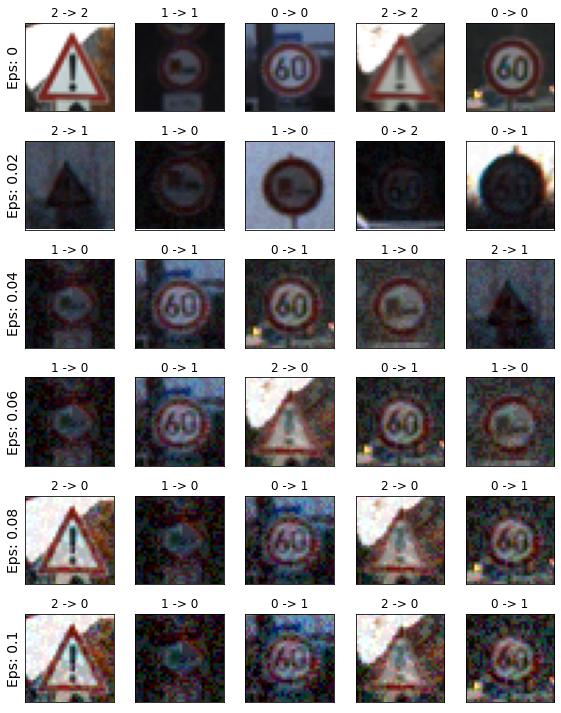

In [ ]:
# 각 엡실론에서 적대적 샘플의 몇 가지 예를 도식화합니다
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(epsilons)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(epsilons),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(epsilons[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        ex_reshape = ex.reshape(3,32,32)
        ex_transpose = ex_reshape.transpose(1,2,0)
        plt.imshow(ex_transpose.astype(int))
plt.tight_layout()
plt.show()

Defense GAN

In [ ]:
(x_train, t_train), (x_test, t_test) = (data_transpose, labels), (data_test_transpose, labels_test) 

In [ ]:
def DefenseGAN(img_at,L,R):
    z_list = []
    img = img_at.reshape(32,32,3)
    img_st = (img - np.mean(img)) / np.std(img) 
    img_var = tf.Variable(img_st,dtype = float)
    opt = tf.keras.optimizers.SGD(learning_rate=0.1,momentum = 0.7)

    def compute():
        z_hats_recs = generator_base(z_var)
        z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
        num_dim = len(z_hats_recs.get_shape())
        axes = range(1, num_dim)
        image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
        rec_loss = tf.reduce_sum(image_rec_loss)
        return rec_loss

    for r in range(R):
        z = np.random.normal(0, 1, (1, 100))
        z_var = tf.Variable(z,dtype = float)
    
        for l in range(L):
            opt.minimize(compute,[z_var])
        z_list.append(z_var)

    def compute_10(z):
        #generator_base.trainable = False #아직 더해야하는지 뺴야하는지 판단 x
        z_hats_recs = generator_base(z)
        z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
        num_dim = len(z_hats_recs.get_shape())
        axes = range(1, num_dim)
        image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
        rec_loss = tf.reduce_sum(image_rec_loss)
        return rec_loss
    

    loss_list = []
    
    for i in range(len(z_list)):
        loss = compute_10(z_list[i])
        loss_list.append(loss)
    
    index_min = np.argmin(loss_list)

    z_min = np.array(z_list[index_min])

    generated_images = 0.5 * generator_base.predict(z_min)+ 0.5

    generated_images = generated_images.reshape(32,32,3)

    generated_images_tp = generated_images.transpose(2,0,1)

    return generated_images_tp

In [ ]:
epsilons = [0, .02, .04,.06,.08,.1]

# FGSM 공격 코드
def fgsm_attack(image, epsilon, data_grad):
    # data_grad 의 요소별 부호 값을 얻어옵니다
    sign_data_grad = np.sign(data_grad) * 255
    perturbed_image = image + epsilon*sign_data_grad
    # 값 범위를 [0,1]로 유지하기 위해 자르기(clipping)를 추가합니다
    #perturbed_image = np.clip(perturbed_image, 0, 1), 이 경우에는 정규화를 진행하지 않았기 때문에 clipping x
    # 작은 변화가 적용된 이미지를 리턴합니다
    return perturbed_image

In [ ]:
## predict_output에 한개씩 넣는 것부터 구현해야한다. (전체가 들어가는 것만 정상 작동함)

def test(model, test_x, test_y, epsilon):

    # 정확도 카운터
    correct = 0
    adv_examples = []
    defense_correct = 0
    df_examples = []
    # 테스트 셋의 모든 예제에 대해 루프를 돕니다
    
    for i in range(len(test_x)):
        data = test_x[i].reshape(-1,3,32,32)
        target = test_y[i].reshape(1)
        
        result = model.predict(data)
        init_output = int(result)
 
        if init_output != target:
            continue

        data_grad = model.network.gradient_ad(data,target)
        
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        print('변형 이미지 shape :',perturbed_data.shape)
        perturbed_data_plot = perturbed_data.reshape(3,32,32)
        plt.imshow(perturbed_data_plot.transpose(1,2,0) / 255)
        plt.show();

        output = model.predict(perturbed_data)

        final_pred = int(output)


        if final_pred == int(target):
            correct += 1
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))
        else:
            if len(adv_examples) < 5:
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))


        generated_img = DefenseGAN(perturbed_data.reshape(3,32,32).transpose(1,2,0),200,10).reshape(-1,3,32,32)

        print('생성 이미지 shape :',generated_img.shape)

        generated_img_plot = generated_img.reshape(3,32,32)
        plt.imshow(generated_img_plot.transpose(1,2,0))
        plt.show();

        defense_output = model.predict(generated_img)

        defense_pred = int(defense_output)

        if defense_pred == int(target):
            defense_correct += 1
            if (epsilon == 0) and (len(df_examples) < 5):
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))
        else:
            if len(df_examples) < 5:
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))

        print('Working...!')



    # 해당 엡실론에서의 최종 정확도를 계산합니다
    final_acc = correct/float(len(test_x))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_x), final_acc))

    defense_acc = defense_correct / float(len(test_x))
    print("Epsilon: {}\tDefense Accuracy = {} / {} = {}".format(epsilon, defense_correct, len(test_x), defense_acc))
    # 정확도와 적대적 예제를 리턴합니다
    return final_acc, adv_examples, defense_acc, df_examples

변형 이미지 shape : (1, 3, 32, 32)


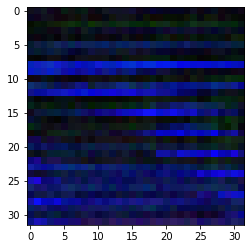

KeyboardInterrupt: ignored

In [ ]:
accuracies = []
examples = []
accuracies_df = []
examples_df = []

eps = 0.02

acc, ex, acc_df, ex_df = test(trainer, x_test[:100], t_test[:100], eps)
accuracies.append(acc)
examples.append(ex)
accuracies_df.append(acc_df)
examples_df.append(ex_df)

## Denfense GAN with LENET5

DEFENSEGAN에 대한 분류기로 LENET5를 사용해 판별 성능을 높였다.

In [ ]:
(x_train, t_train), (x_test, t_test) = (data_transpose, labels), (data_test_transpose, labels_test) 

In [ ]:
def DefenseGAN(img_at,L,R):
    z_list = []
    img = img_at.reshape(32,32,3)
    img_st = (img - np.mean(img)) / np.std(img) 
    img_var = tf.Variable(img_st,dtype = float)
    opt = tf.keras.optimizers.SGD(learning_rate=0.1,momentum = 0.7)

    def compute():
        z_hats_recs = generator_base(z_var)
        z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
        num_dim = len(z_hats_recs.get_shape())
        axes = range(1, num_dim)
        image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
        rec_loss = tf.reduce_sum(image_rec_loss)
        return rec_loss

    for r in range(R):
        z = np.random.normal(0, 1, (1, 100))
        z_var = tf.Variable(z,dtype = float)
    
        for l in range(L):
            opt.minimize(compute,[z_var])
        z_list.append(z_var)

    def compute_10(z):
        #generator_base.trainable = False #아직 더해야하는지 뺴야하는지 판단 x
        z_hats_recs = generator_base(z)
        z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
        num_dim = len(z_hats_recs.get_shape())
        axes = range(1, num_dim)
        image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
        rec_loss = tf.reduce_sum(image_rec_loss)
        return rec_loss
    

    loss_list = []
    
    for i in range(len(z_list)):
        loss = compute_10(z_list[i])
        loss_list.append(loss)
    
    index_min = np.argmin(loss_list)

    z_min = np.array(z_list[index_min])

    generated_images = 0.5 * generator_base.predict(z_min)+ 0.5

    generated_images = generated_images.reshape(32,32,3)

    generated_images_tp = generated_images.transpose(2,0,1)

    return generated_images_tp

In [ ]:
epsilons = [0, .02, .04,.06,.08,.1]

# FGSM 공격 코드
def fgsm_attack(image, epsilon, data_grad):
    # data_grad 의 요소별 부호 값을 얻어옵니다
    sign_data_grad = np.sign(data_grad) * 255
    perturbed_image = image + epsilon*sign_data_grad
    # 값 범위를 [0,1]로 유지하기 위해 자르기(clipping)를 추가합니다
    #perturbed_image = np.clip(perturbed_image, 0, 1), 이 경우에는 정규화를 진행하지 않았기 때문에 clipping x
    # 작은 변화가 적용된 이미지를 리턴합니다
    return perturbed_image

In [ ]:
## predict_output에 한개씩 넣는 것부터 구현해야한다. (전체가 들어가는 것만 정상 작동함)

def test(model_AT,model_CLASSIFI, test_x, test_y, epsilon):

    # 정확도 카운터
    correct = 0
    adv_examples = []
    defense_correct = 0
    df_examples = []
    # 테스트 셋의 모든 예제에 대해 루프를 돕니다
    
    for i in range(len(test_x)):
        data = test_x[i].reshape(-1,3,32,32)
        target = test_y[i].reshape(1)
        
        result = model_AT.predict(data)
        init_output = int(result)
 
        if init_output != target:
            continue

        data_grad = model_AT.network.gradient_ad(data,target)
        
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        print('변형 이미지 shape :',perturbed_data.shape)
        perturbed_data_plot = perturbed_data.reshape(3,32,32)
        plt.imshow(perturbed_data_plot.transpose(1,2,0) / 255)
        plt.show();

        output = model_CLASSIFI.predict(perturbed_data.reshape(1,3,32,32).transpose(0,2,3,1))

        final_pred=int(np.argmax(output,axis=1))

        if final_pred == int(target):
            correct += 1
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))
        else:
            if len(adv_examples) < 5:
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))


        generated_img = DefenseGAN(perturbed_data.reshape(3,32,32).transpose(1,2,0),200,10).reshape(-1,3,32,32)

        print('생성 이미지 shape :',generated_img.shape)

        generated_img_plot = generated_img.reshape(3,32,32)
        plt.imshow(generated_img_plot.transpose(1,2,0))
        plt.show();

        defense_output = model_CLASSIFI.predict(generated_img.reshape(1,3,32,32).transpose(0,2,3,1))

        defense_pred= int(np.argmax(defense_output,axis=1))

        if defense_pred == int(target):
            defense_correct += 1
            if (epsilon == 0) and (len(df_examples) < 5):
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))
        else:
            if len(df_examples) < 5:
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))

        print('Working...!')



    # 해당 엡실론에서의 최종 정확도를 계산합니다
    final_acc = correct/float(len(test_x))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_x), final_acc))

    defense_acc = defense_correct / float(len(test_x))
    print("Epsilon: {}\tDefense Accuracy = {} / {} = {}".format(epsilon, defense_correct, len(test_x), defense_acc))
    # 정확도와 적대적 예제를 리턴합니다
    return final_acc, adv_examples, defense_acc, df_examples

변형 이미지 shape : (1, 3, 32, 32)


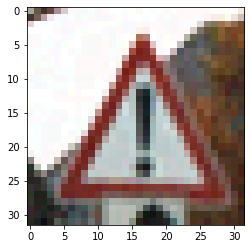

생성 이미지 shape : (1, 3, 32, 32)


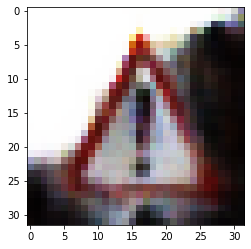

Working...!
변형 이미지 shape : (1, 3, 32, 32)


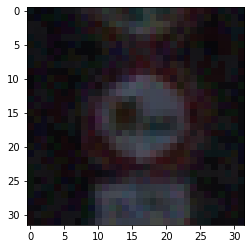

생성 이미지 shape : (1, 3, 32, 32)


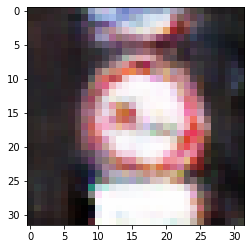

Working...!
변형 이미지 shape : (1, 3, 32, 32)


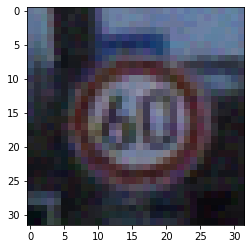

생성 이미지 shape : (1, 3, 32, 32)


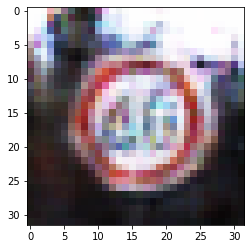

Working...!
변형 이미지 shape : (1, 3, 32, 32)


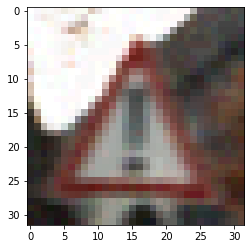

생성 이미지 shape : (1, 3, 32, 32)


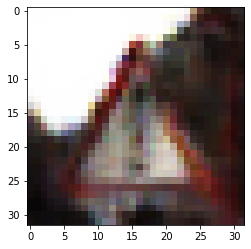

Working...!
변형 이미지 shape : (1, 3, 32, 32)


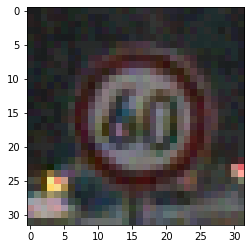

생성 이미지 shape : (1, 3, 32, 32)


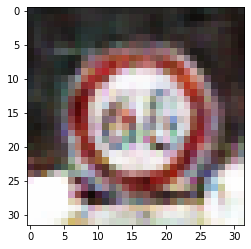

Working...!
변형 이미지 shape : (1, 3, 32, 32)


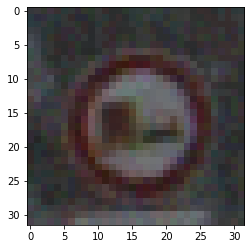

생성 이미지 shape : (1, 3, 32, 32)


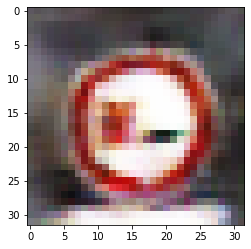

Working...!
변형 이미지 shape : (1, 3, 32, 32)


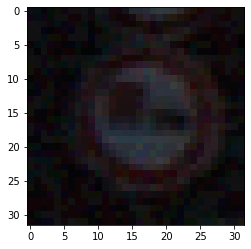

생성 이미지 shape : (1, 3, 32, 32)


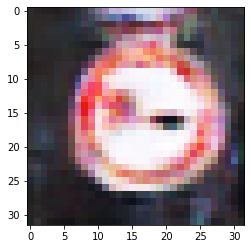

Working...!
변형 이미지 shape : (1, 3, 32, 32)


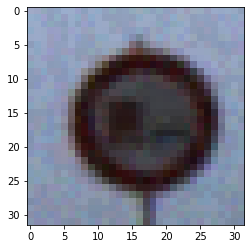

생성 이미지 shape : (1, 3, 32, 32)


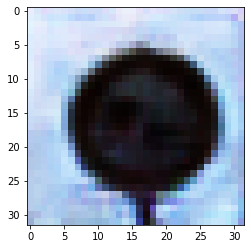

Working...!
변형 이미지 shape : (1, 3, 32, 32)


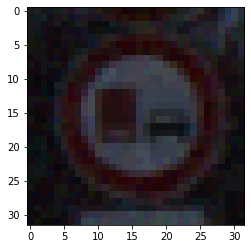

생성 이미지 shape : (1, 3, 32, 32)


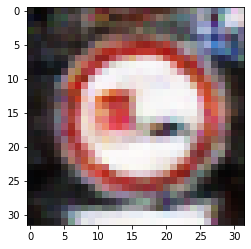

Working...!
변형 이미지 shape : (1, 3, 32, 32)


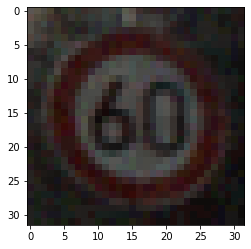

생성 이미지 shape : (1, 3, 32, 32)


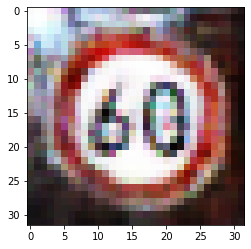

Working...!
변형 이미지 shape : (1, 3, 32, 32)


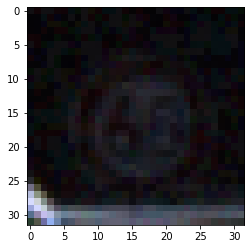

생성 이미지 shape : (1, 3, 32, 32)


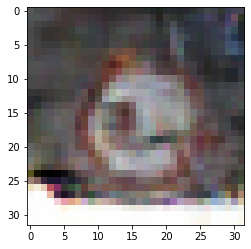

Working...!
변형 이미지 shape : (1, 3, 32, 32)


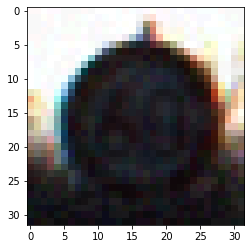

생성 이미지 shape : (1, 3, 32, 32)


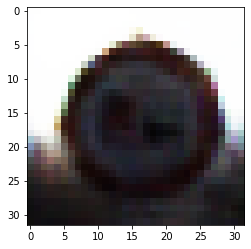

Working...!
변형 이미지 shape : (1, 3, 32, 32)


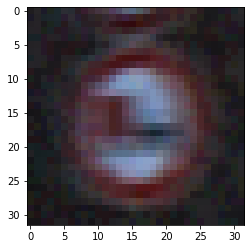

생성 이미지 shape : (1, 3, 32, 32)


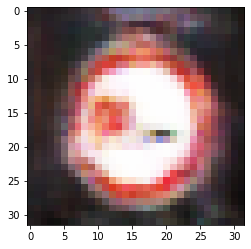

Working...!
변형 이미지 shape : (1, 3, 32, 32)


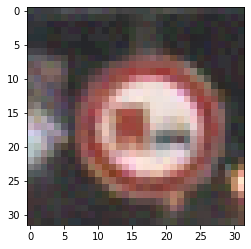

생성 이미지 shape : (1, 3, 32, 32)


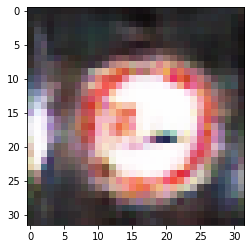

Working...!
변형 이미지 shape : (1, 3, 32, 32)


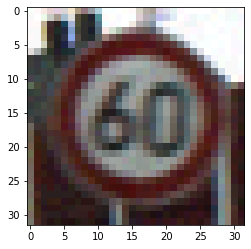

생성 이미지 shape : (1, 3, 32, 32)


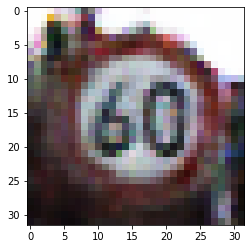

Working...!
변형 이미지 shape : (1, 3, 32, 32)


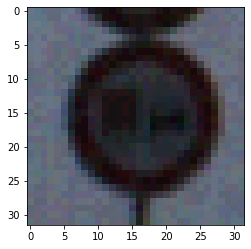

생성 이미지 shape : (1, 3, 32, 32)


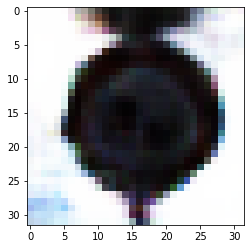

Working...!
변형 이미지 shape : (1, 3, 32, 32)


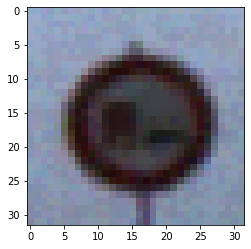

생성 이미지 shape : (1, 3, 32, 32)


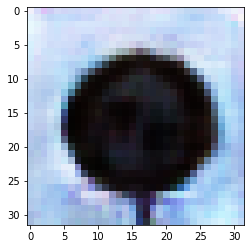

Working...!
변형 이미지 shape : (1, 3, 32, 32)


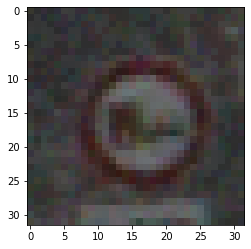

생성 이미지 shape : (1, 3, 32, 32)


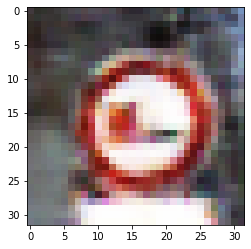

Working...!
변형 이미지 shape : (1, 3, 32, 32)


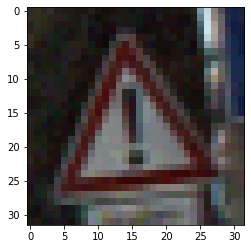

생성 이미지 shape : (1, 3, 32, 32)


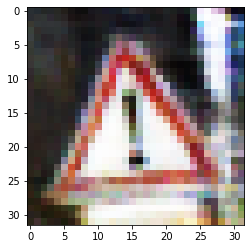

Working...!
변형 이미지 shape : (1, 3, 32, 32)


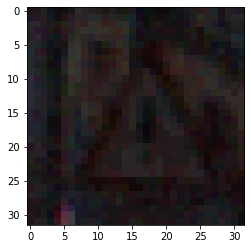

생성 이미지 shape : (1, 3, 32, 32)


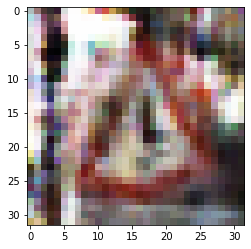

Working...!
변형 이미지 shape : (1, 3, 32, 32)


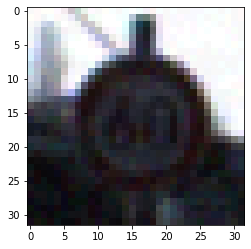

생성 이미지 shape : (1, 3, 32, 32)


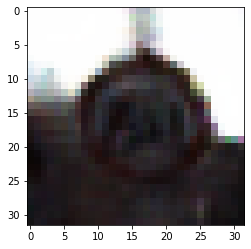

Working...!
변형 이미지 shape : (1, 3, 32, 32)


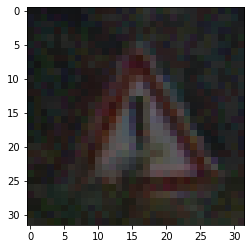

생성 이미지 shape : (1, 3, 32, 32)


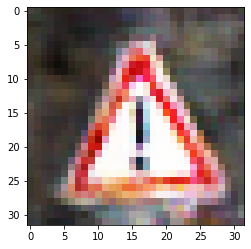

Working...!
변형 이미지 shape : (1, 3, 32, 32)


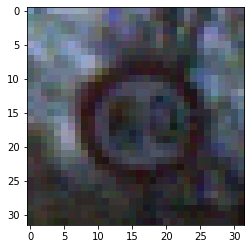

생성 이미지 shape : (1, 3, 32, 32)


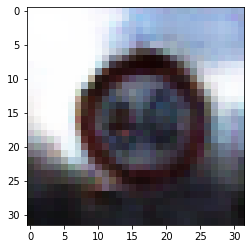

Working...!
변형 이미지 shape : (1, 3, 32, 32)


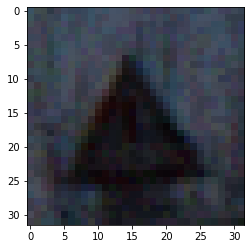

생성 이미지 shape : (1, 3, 32, 32)


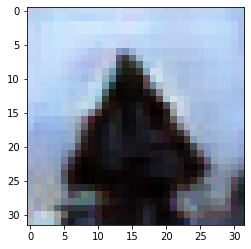

Working...!
변형 이미지 shape : (1, 3, 32, 32)


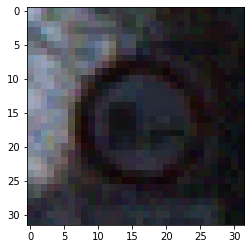

생성 이미지 shape : (1, 3, 32, 32)


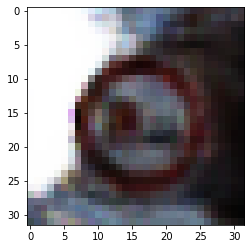

Working...!
변형 이미지 shape : (1, 3, 32, 32)


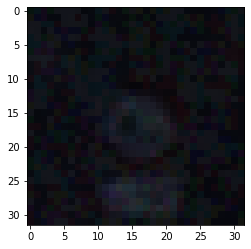

생성 이미지 shape : (1, 3, 32, 32)


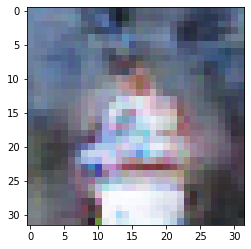

Working...!
변형 이미지 shape : (1, 3, 32, 32)


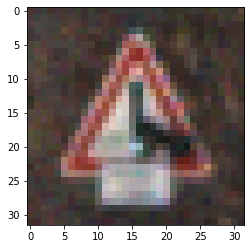

생성 이미지 shape : (1, 3, 32, 32)


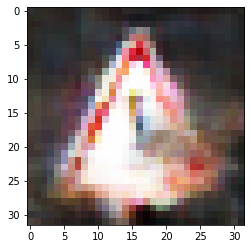

Working...!
변형 이미지 shape : (1, 3, 32, 32)


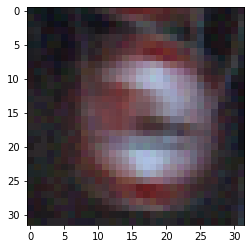

생성 이미지 shape : (1, 3, 32, 32)


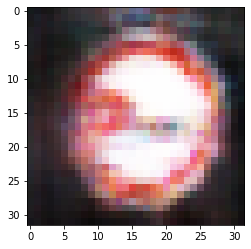

Working...!
변형 이미지 shape : (1, 3, 32, 32)


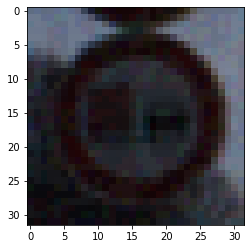

생성 이미지 shape : (1, 3, 32, 32)


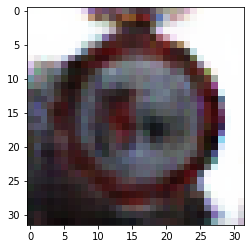

Working...!
변형 이미지 shape : (1, 3, 32, 32)


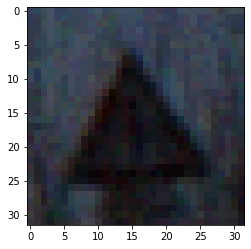

생성 이미지 shape : (1, 3, 32, 32)


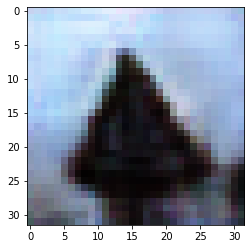

Working...!
변형 이미지 shape : (1, 3, 32, 32)


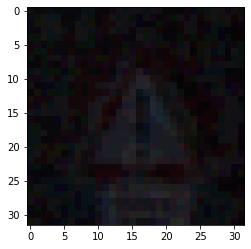

생성 이미지 shape : (1, 3, 32, 32)


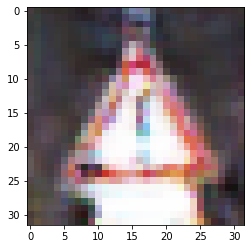

Working...!
변형 이미지 shape : (1, 3, 32, 32)


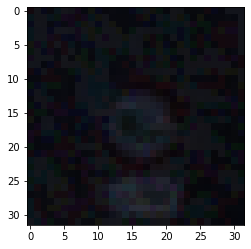

생성 이미지 shape : (1, 3, 32, 32)


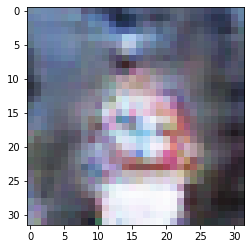

Working...!
변형 이미지 shape : (1, 3, 32, 32)


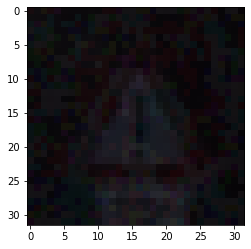

생성 이미지 shape : (1, 3, 32, 32)


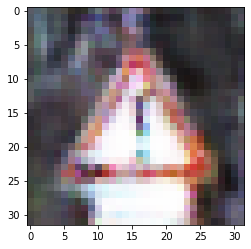

Working...!
변형 이미지 shape : (1, 3, 32, 32)


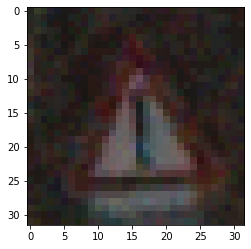

생성 이미지 shape : (1, 3, 32, 32)


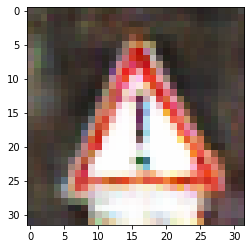

Working...!
변형 이미지 shape : (1, 3, 32, 32)


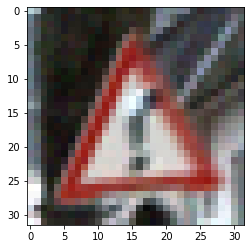

생성 이미지 shape : (1, 3, 32, 32)


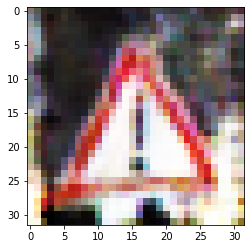

Working...!
변형 이미지 shape : (1, 3, 32, 32)


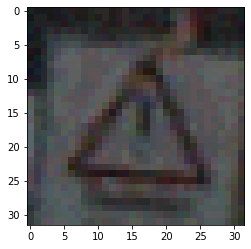

생성 이미지 shape : (1, 3, 32, 32)


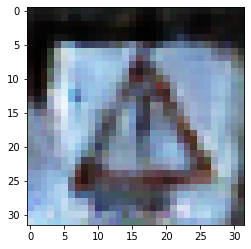

Working...!
변형 이미지 shape : (1, 3, 32, 32)


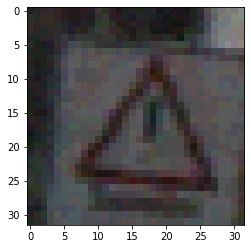

생성 이미지 shape : (1, 3, 32, 32)


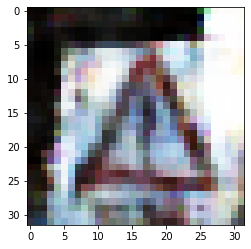

Working...!
변형 이미지 shape : (1, 3, 32, 32)


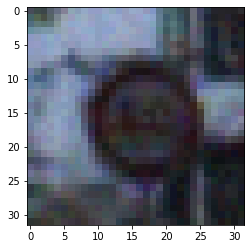

생성 이미지 shape : (1, 3, 32, 32)


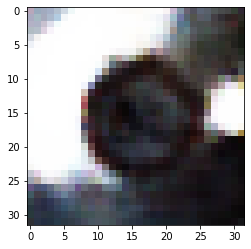

Working...!
변형 이미지 shape : (1, 3, 32, 32)


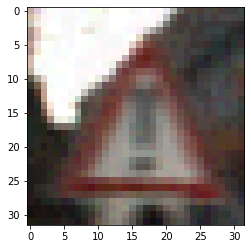

생성 이미지 shape : (1, 3, 32, 32)


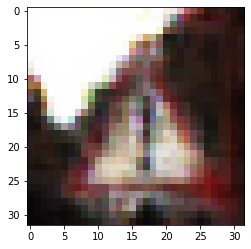

Working...!
변형 이미지 shape : (1, 3, 32, 32)


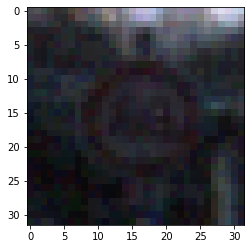

생성 이미지 shape : (1, 3, 32, 32)


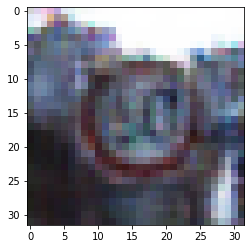

Working...!
변형 이미지 shape : (1, 3, 32, 32)


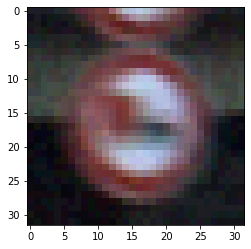

생성 이미지 shape : (1, 3, 32, 32)


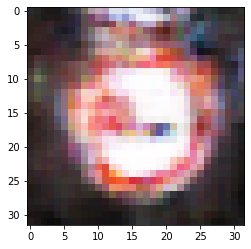

Working...!
변형 이미지 shape : (1, 3, 32, 32)


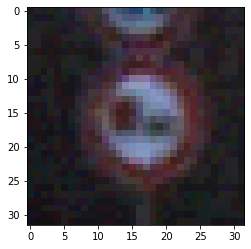

생성 이미지 shape : (1, 3, 32, 32)


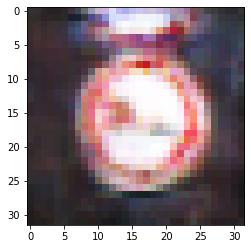

Working...!
변형 이미지 shape : (1, 3, 32, 32)


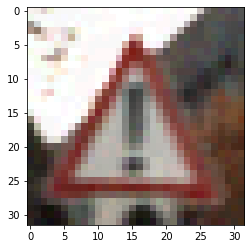

생성 이미지 shape : (1, 3, 32, 32)


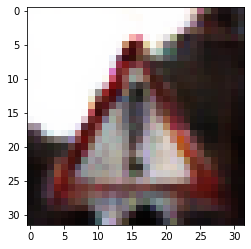

Working...!
변형 이미지 shape : (1, 3, 32, 32)


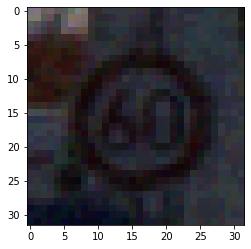

생성 이미지 shape : (1, 3, 32, 32)


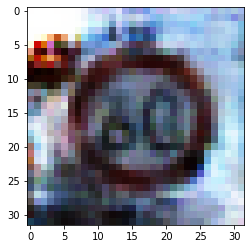

Working...!
변형 이미지 shape : (1, 3, 32, 32)


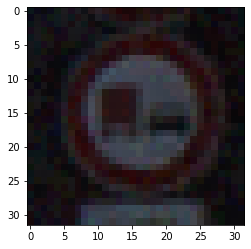

생성 이미지 shape : (1, 3, 32, 32)


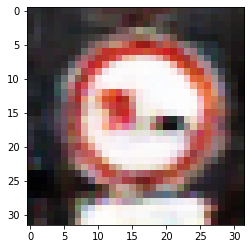

Working...!
변형 이미지 shape : (1, 3, 32, 32)


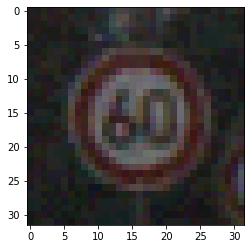

생성 이미지 shape : (1, 3, 32, 32)


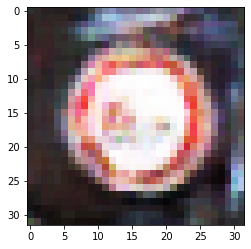

Working...!
변형 이미지 shape : (1, 3, 32, 32)


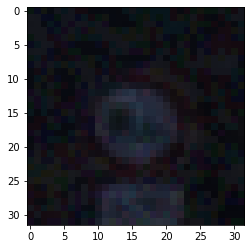

생성 이미지 shape : (1, 3, 32, 32)


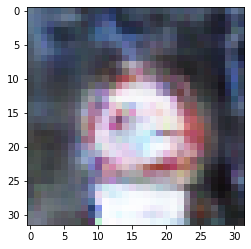

Working...!
변형 이미지 shape : (1, 3, 32, 32)


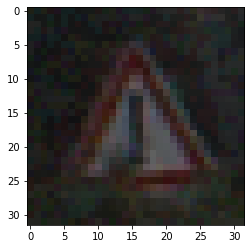

생성 이미지 shape : (1, 3, 32, 32)


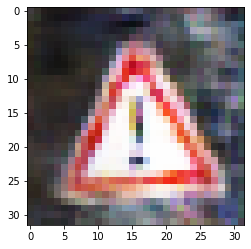

Working...!
변형 이미지 shape : (1, 3, 32, 32)


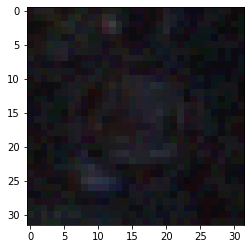

생성 이미지 shape : (1, 3, 32, 32)


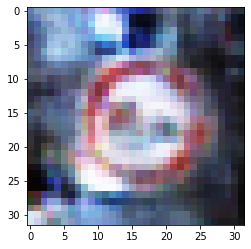

Working...!
변형 이미지 shape : (1, 3, 32, 32)


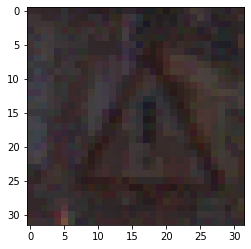

생성 이미지 shape : (1, 3, 32, 32)


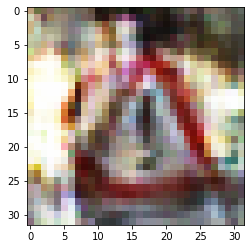

Working...!
변형 이미지 shape : (1, 3, 32, 32)


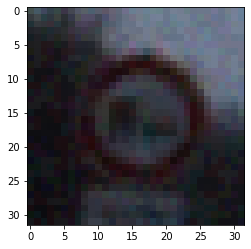

생성 이미지 shape : (1, 3, 32, 32)


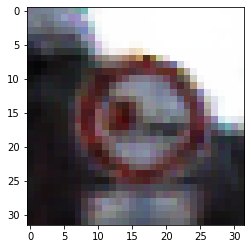

Working...!
변형 이미지 shape : (1, 3, 32, 32)


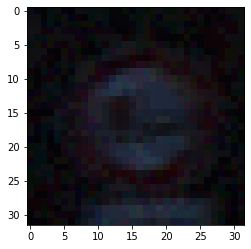

생성 이미지 shape : (1, 3, 32, 32)


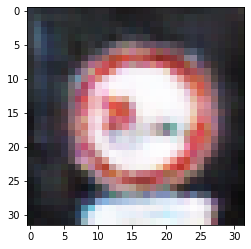

Working...!
변형 이미지 shape : (1, 3, 32, 32)


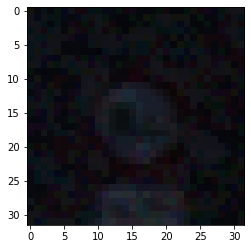

생성 이미지 shape : (1, 3, 32, 32)


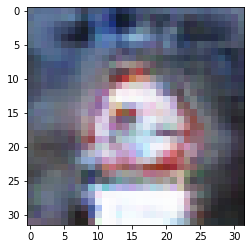

Working...!
변형 이미지 shape : (1, 3, 32, 32)


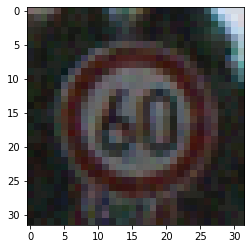

생성 이미지 shape : (1, 3, 32, 32)


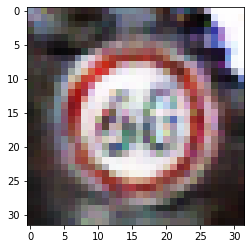

Working...!
변형 이미지 shape : (1, 3, 32, 32)


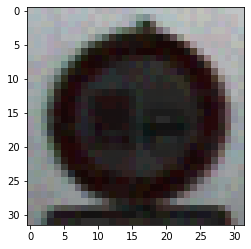

생성 이미지 shape : (1, 3, 32, 32)


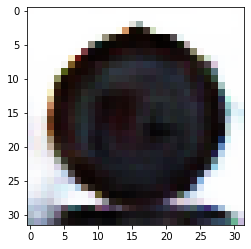

Working...!
변형 이미지 shape : (1, 3, 32, 32)


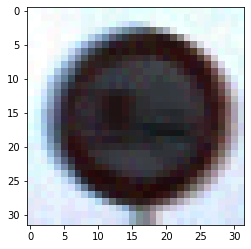

생성 이미지 shape : (1, 3, 32, 32)


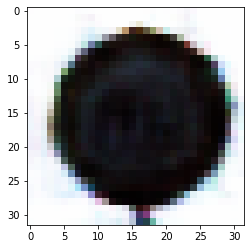

Working...!
변형 이미지 shape : (1, 3, 32, 32)


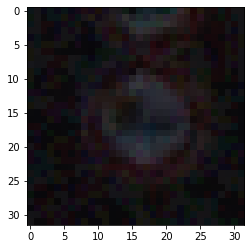

생성 이미지 shape : (1, 3, 32, 32)


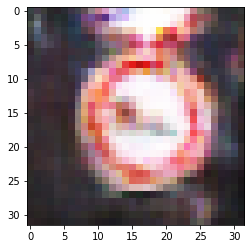

Working...!
변형 이미지 shape : (1, 3, 32, 32)


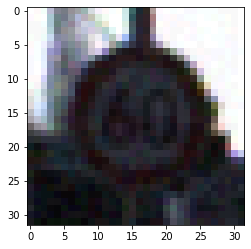

생성 이미지 shape : (1, 3, 32, 32)


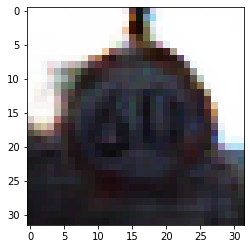

Working...!
변형 이미지 shape : (1, 3, 32, 32)


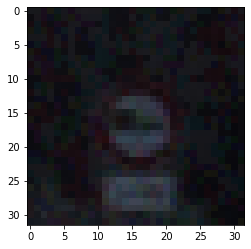

생성 이미지 shape : (1, 3, 32, 32)


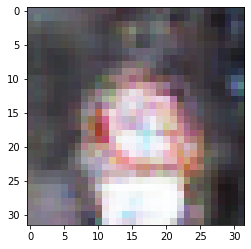

Working...!
변형 이미지 shape : (1, 3, 32, 32)


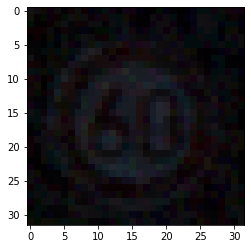

생성 이미지 shape : (1, 3, 32, 32)


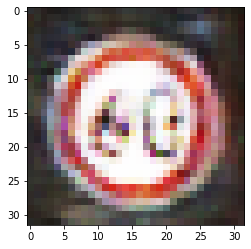

Working...!
변형 이미지 shape : (1, 3, 32, 32)


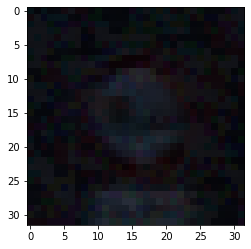

생성 이미지 shape : (1, 3, 32, 32)


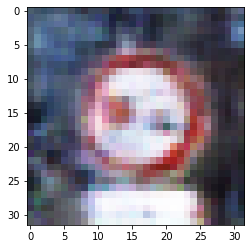

Working...!
변형 이미지 shape : (1, 3, 32, 32)


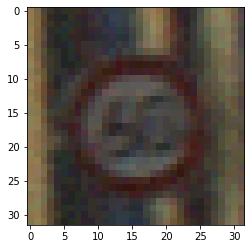

생성 이미지 shape : (1, 3, 32, 32)


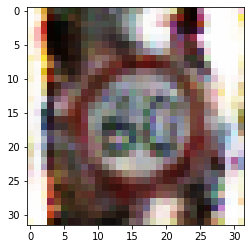

Working...!
변형 이미지 shape : (1, 3, 32, 32)


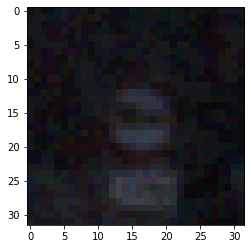

생성 이미지 shape : (1, 3, 32, 32)


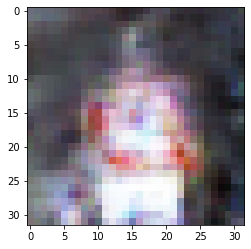

Working...!
변형 이미지 shape : (1, 3, 32, 32)


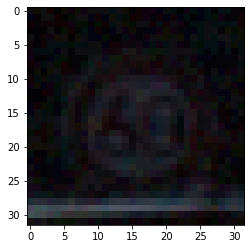

생성 이미지 shape : (1, 3, 32, 32)


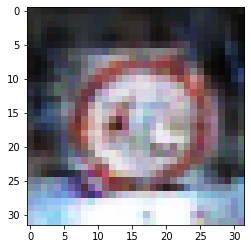

Working...!
변형 이미지 shape : (1, 3, 32, 32)


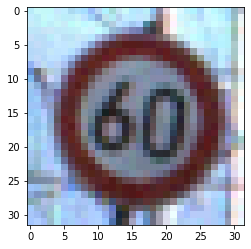

생성 이미지 shape : (1, 3, 32, 32)


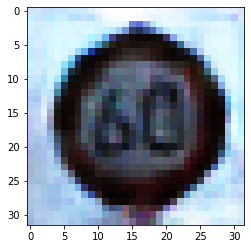

Working...!
변형 이미지 shape : (1, 3, 32, 32)


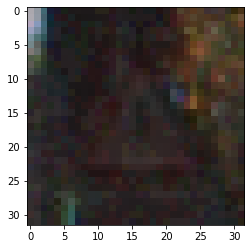

생성 이미지 shape : (1, 3, 32, 32)


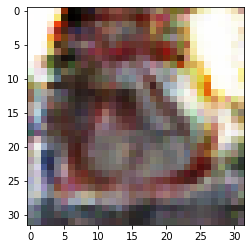

Working...!
변형 이미지 shape : (1, 3, 32, 32)


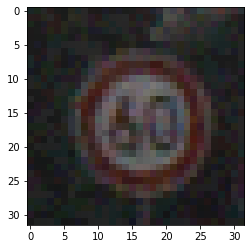

생성 이미지 shape : (1, 3, 32, 32)


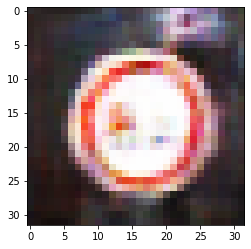

Working...!
변형 이미지 shape : (1, 3, 32, 32)


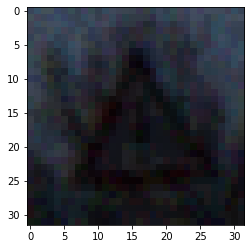

생성 이미지 shape : (1, 3, 32, 32)


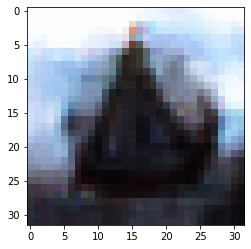

Working...!
변형 이미지 shape : (1, 3, 32, 32)


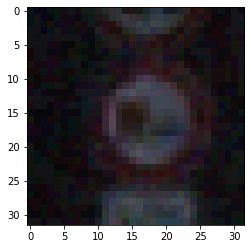

생성 이미지 shape : (1, 3, 32, 32)


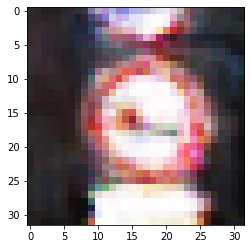

Working...!
변형 이미지 shape : (1, 3, 32, 32)


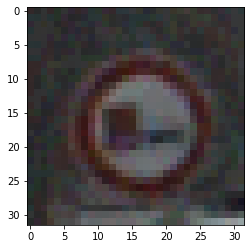

생성 이미지 shape : (1, 3, 32, 32)


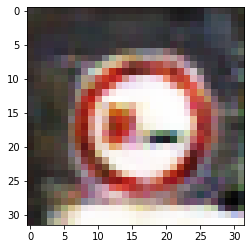

Working...!
변형 이미지 shape : (1, 3, 32, 32)


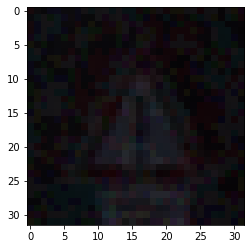

생성 이미지 shape : (1, 3, 32, 32)


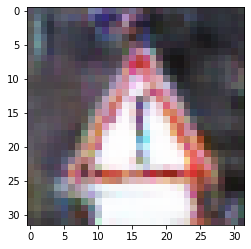

Working...!
변형 이미지 shape : (1, 3, 32, 32)


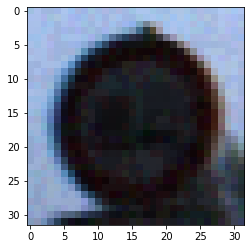

생성 이미지 shape : (1, 3, 32, 32)


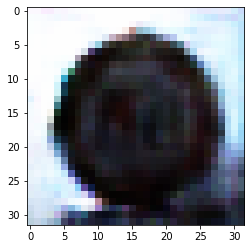

Working...!
변형 이미지 shape : (1, 3, 32, 32)


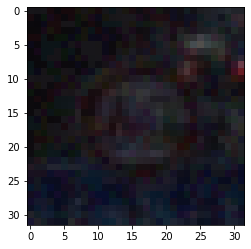

생성 이미지 shape : (1, 3, 32, 32)


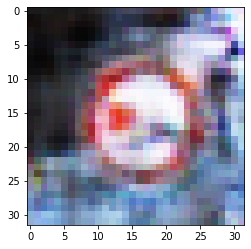

Working...!
변형 이미지 shape : (1, 3, 32, 32)


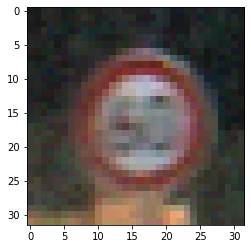

생성 이미지 shape : (1, 3, 32, 32)


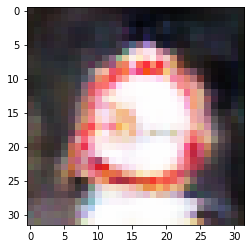

Working...!
변형 이미지 shape : (1, 3, 32, 32)


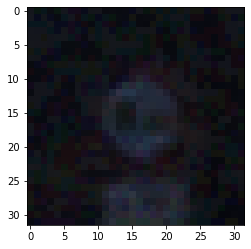

생성 이미지 shape : (1, 3, 32, 32)


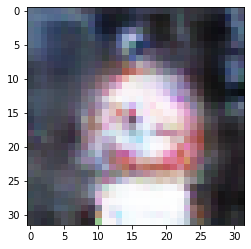

Working...!
변형 이미지 shape : (1, 3, 32, 32)


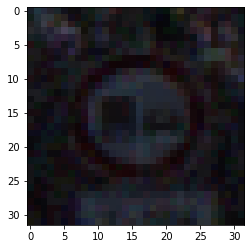

생성 이미지 shape : (1, 3, 32, 32)


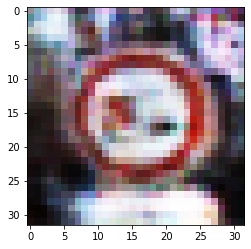

Working...!
변형 이미지 shape : (1, 3, 32, 32)


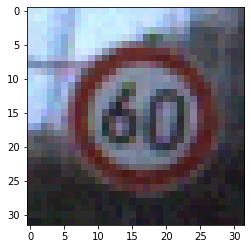

생성 이미지 shape : (1, 3, 32, 32)


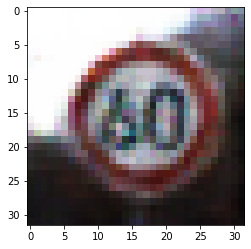

Working...!
변형 이미지 shape : (1, 3, 32, 32)


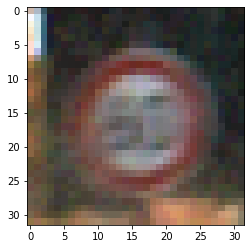

생성 이미지 shape : (1, 3, 32, 32)


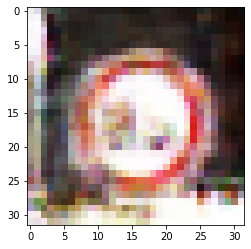

Working...!
변형 이미지 shape : (1, 3, 32, 32)


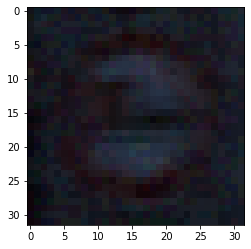

생성 이미지 shape : (1, 3, 32, 32)


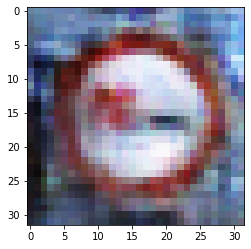

Working...!
변형 이미지 shape : (1, 3, 32, 32)


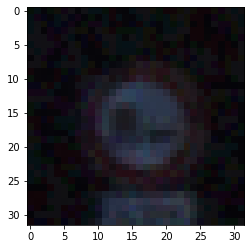

생성 이미지 shape : (1, 3, 32, 32)


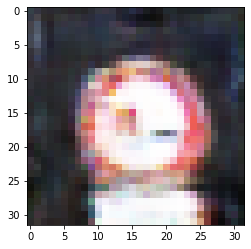

Working...!
변형 이미지 shape : (1, 3, 32, 32)


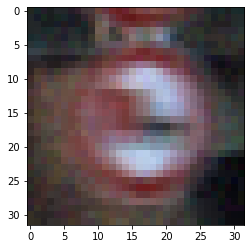

생성 이미지 shape : (1, 3, 32, 32)


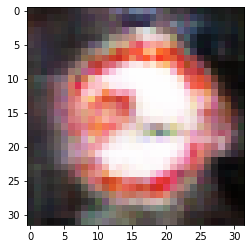

Working...!
변형 이미지 shape : (1, 3, 32, 32)


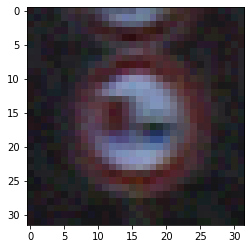

생성 이미지 shape : (1, 3, 32, 32)


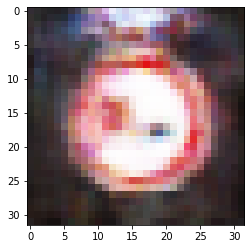

Working...!
변형 이미지 shape : (1, 3, 32, 32)


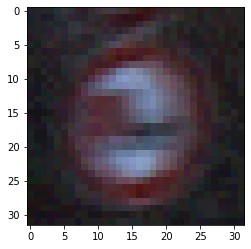

생성 이미지 shape : (1, 3, 32, 32)


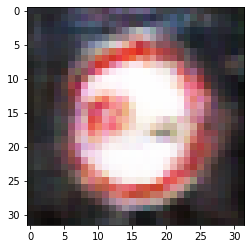

Working...!
변형 이미지 shape : (1, 3, 32, 32)


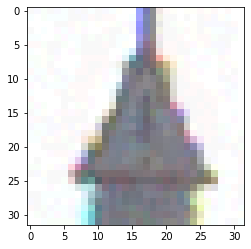

생성 이미지 shape : (1, 3, 32, 32)


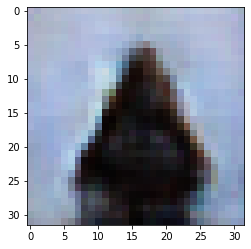

Working...!
변형 이미지 shape : (1, 3, 32, 32)


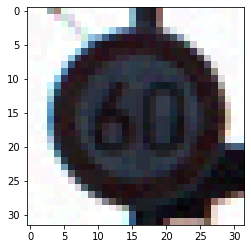

생성 이미지 shape : (1, 3, 32, 32)


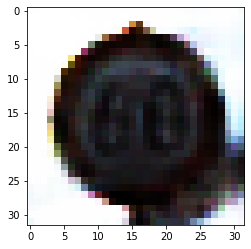

Working...!
변형 이미지 shape : (1, 3, 32, 32)


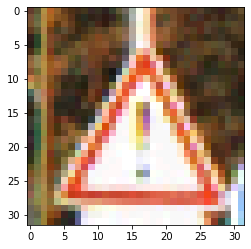

생성 이미지 shape : (1, 3, 32, 32)


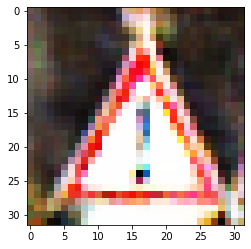

Working...!
변형 이미지 shape : (1, 3, 32, 32)


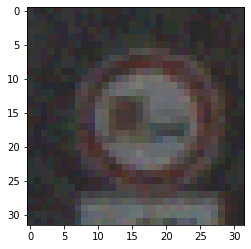

생성 이미지 shape : (1, 3, 32, 32)


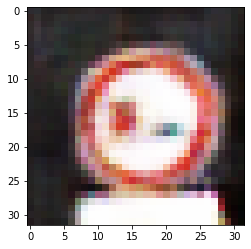

Working...!
변형 이미지 shape : (1, 3, 32, 32)


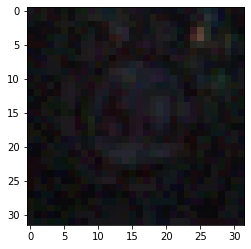

생성 이미지 shape : (1, 3, 32, 32)


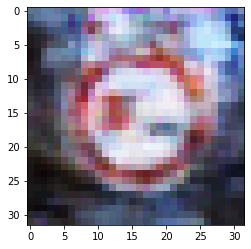

Working...!
변형 이미지 shape : (1, 3, 32, 32)


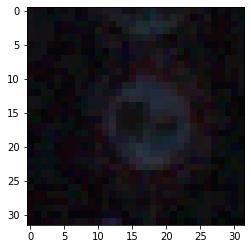

생성 이미지 shape : (1, 3, 32, 32)


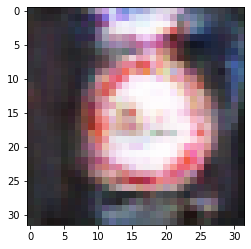

Working...!
변형 이미지 shape : (1, 3, 32, 32)


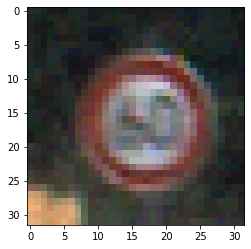

생성 이미지 shape : (1, 3, 32, 32)


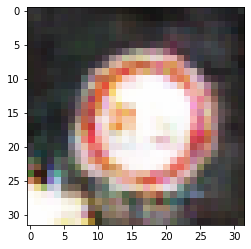

Working...!
변형 이미지 shape : (1, 3, 32, 32)


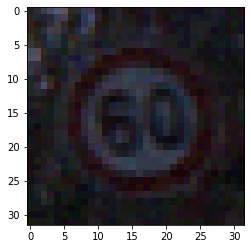

생성 이미지 shape : (1, 3, 32, 32)


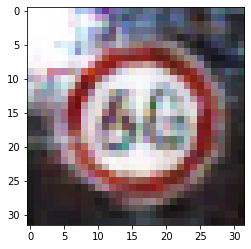

Working...!
변형 이미지 shape : (1, 3, 32, 32)


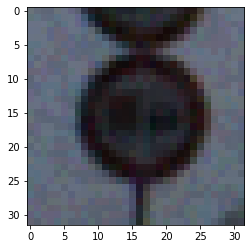

생성 이미지 shape : (1, 3, 32, 32)


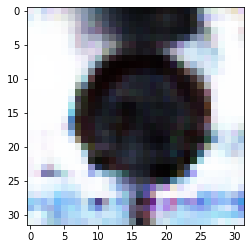

Working...!
변형 이미지 shape : (1, 3, 32, 32)


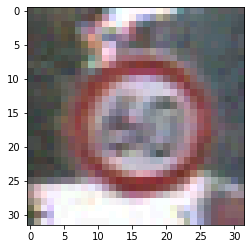

생성 이미지 shape : (1, 3, 32, 32)


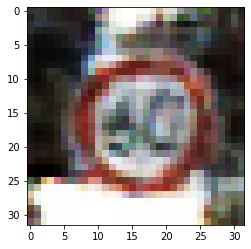

Working...!
변형 이미지 shape : (1, 3, 32, 32)


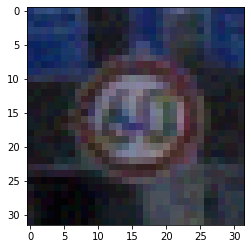

생성 이미지 shape : (1, 3, 32, 32)


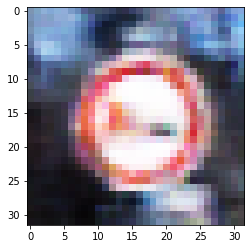

Working...!
변형 이미지 shape : (1, 3, 32, 32)


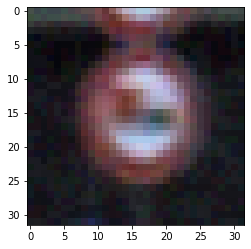

생성 이미지 shape : (1, 3, 32, 32)


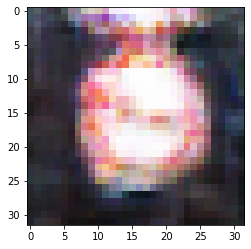

Working...!
Epsilon: 0.02	Test Accuracy = 58 / 100 = 0.58
Epsilon: 0.02	Defense Accuracy = 71 / 100 = 0.71


In [ ]:
accuracies = []
examples = []
accuracies_df = []
examples_df = []

eps = 0.02

acc, ex, acc_df, ex_df = test(trainer,model_classifier, x_test[:100], t_test[:100], eps)
accuracies.append(acc)
examples.append(ex)
accuracies_df.append(acc_df)
examples_df.append(ex_df)

Test Data with PCA

fgsm attacked data를 pca로 차원 축소해주겠다 --> 이 과정에서 attacked noise의 smoothing을 기대

In [ ]:
(x_train, t_train), (x_test, t_test) = (data_transpose, labels), (data_test_transpose, labels_test) 

In [15]:
x_test = data_test_transpose

In [ ]:
x_test.shape

In [16]:
r = []
g = []
b = []
for i in range(len(x_test)):
    r.append(x_test[i][0])
    g.append(x_test[i][1])
    b.append(x_test[i][2])
    
for i in range(len(r)):
    r[i] = r[i] / 255
    g[i] = g[i] / 255
    b[i] = b[i] / 255

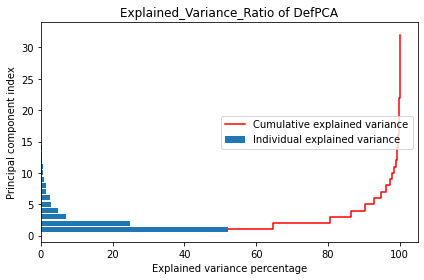

In [31]:
import numpy as np
from sklearn.decomposition import PCA

pca_r = PCA(n_components= None)
pca_r.fit(r[0])

exp_var = pca_r.explained_variance_ratio_ * 100
cum_exp_var = np.cumsum(exp_var)

plt.figure()

plt.barh(range(1, 33), exp_var, align='center',
        label='Individual explained variance')

plt.step(cum_exp_var, range(1, 33),  where='mid',
         label='Cumulative explained variance', color='red')

plt.xlabel('Explained variance percentage')
plt.ylabel('Principal component index')
plt.legend(loc='right')
plt.title("Explained_Variance_Ratio of DefPCA")
plt.tight_layout()
plt.savefig('savefig_200dpi.png', dpi=200)

<BarContainer object of 32 artists>

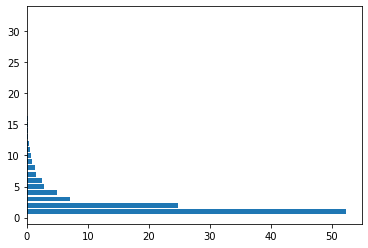

In [26]:
plt.barh(range(1, 33), exp_var, align='center',
        label='Individual explained variance')

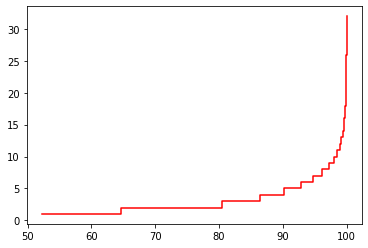

In [28]:
plt.step(cum_exp_var, range(1, 33),  where='mid',
         label='Cumulative explained variance', color='red')

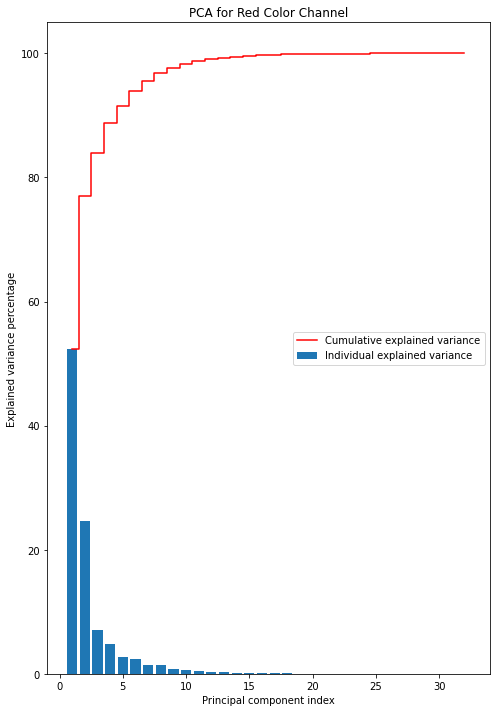

In [24]:
import numpy as np
from sklearn.decomposition import PCA

pca_r = PCA(n_components= None)
pca_r.fit(r[0])

exp_var = pca_r.explained_variance_ratio_ * 100
cum_exp_var = np.cumsum(exp_var)

plt.figure(figsize=[7, 10])

plt.bar(range(1, 33), exp_var, align='center',
        label='Individual explained variance')

plt.step(range(1, 33), cum_exp_var, where='mid',
         label='Cumulative explained variance', color='red')

plt.ylabel('Explained variance percentage')
plt.xlabel('Principal component index')
plt.legend(loc='right')
plt.title("PCA for Red Color Channel")
plt.tight_layout()
plt.savefig('savefig_200dpi.png', dpi=200)

주성분 5개, 10개 정도만 사용해서 진행해보겠다

- 10개

In [ ]:
from sklearn.decomposition import PCA

pca_r = PCA(n_components=10)
pca_r_trans = pca_r.fit_transform(r[0])

pca_g = PCA(n_components=10)
pca_g_trans = pca_g.fit_transform(g[0])

pca_b = PCA(n_components=10)
pca_b_trans = pca_b.fit_transform(b[0])

In [ ]:
print("Explained variances by each channel")
print("-----------------------------------")
print("Red:", np.sum(pca_r.explained_variance_ratio_ ) * 100)
print("Green:", np.sum(pca_g.explained_variance_ratio_ ) * 100)
print("Blue:", np.sum(pca_b.explained_variance_ratio_ ) * 100)

Explained variances by each channel
-----------------------------------
Red: 98.27956912931162
Green: 98.24953815424156
Blue: 98.23251259533909


In [ ]:
pca_r_org = pca_r.inverse_transform(pca_r_trans)
pca_g_org = pca_g.inverse_transform(pca_g_trans)
pca_b_org = pca_b.inverse_transform(pca_b_trans)

In [ ]:
img_compressed = np.stack((pca_r_org, pca_g_org, pca_b_org),axis = 2)

In [ ]:
img_compressed.shape

(32, 32, 3)

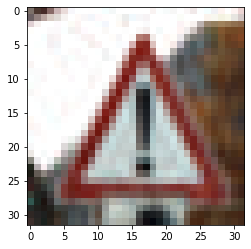

In [ ]:
plt.imshow(img_compressed)

- 5개

In [ ]:
from sklearn.decomposition import PCA

pca_r = PCA(n_components=5)
pca_r_trans = pca_r.fit_transform(r[0])

pca_g = PCA(n_components=5)
pca_g_trans = pca_g.fit_transform(g[0])

pca_b = PCA(n_components=5)
pca_b_trans = pca_b.fit_transform(b[0])

In [ ]:
print("Explained variances by each channel")
print("-----------------------------------")
print("Red:", np.sum(pca_r.explained_variance_ratio_ ) * 100)
print("Green:", np.sum(pca_g.explained_variance_ratio_ ) * 100)
print("Blue:", np.sum(pca_b.explained_variance_ratio_ ) * 100)

Explained variances by each channel
-----------------------------------
Red: 91.60264678747149
Green: 88.66973845578438
Blue: 88.35702534804244


In [ ]:
pca_r_org = pca_r.inverse_transform(pca_r_trans)
pca_g_org = pca_g.inverse_transform(pca_g_trans)
pca_b_org = pca_b.inverse_transform(pca_b_trans)

In [ ]:
img_compressed = np.stack((pca_r_org, pca_g_org, pca_b_org),axis = 2)

In [ ]:
img_compressed.shape

(32, 32, 3)

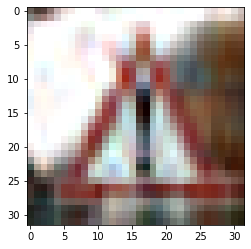

In [ ]:
plt.imshow(img_compressed)

### PCA Components 확인하기

pca 결과 표지판들의 주성분을 시각적으로 확인하겠다

In [ ]:
(x_train, t_train), (x_test, t_test) = (data_transpose, labels), (data_test_transpose, labels_test) 

In [ ]:
x_test.shape

(1500, 3, 32, 32)

In [ ]:
x_test

array([[[[161,  94,  64, ..., 255, 255, 243],
         [ 71, 126, 194, ..., 248, 233, 214],
         [228, 255, 255, ..., 162, 142, 124],
         ...,
         [ 49,  39,  37, ...,  90,  80,  61],
         [ 47,  36,  31, ...,  67,  72,  71],
         [ 42,  31,  20, ...,  68,  69,  72]],

        [[159,  84,  44, ..., 255, 255, 229],
         [ 49,  98, 167, ..., 246, 222, 197],
         [214, 255, 255, ..., 129, 109,  84],
         ...,
         [ 48,  37,  36, ...,  71,  51,  38],
         [ 44,  35,  30, ...,  42,  46,  45],
         [ 39,  28,  18, ...,  44,  44,  45]],

        [[159,  75,  39, ..., 255, 255, 225],
         [ 45,  94, 161, ..., 234, 213, 196],
         [210, 255, 255, ...,  92,  72,  56],
         ...,
         [ 43,  34,  33, ...,  51,  29,  26],
         [ 40,  33,  28, ...,  22,  28,  29],
         [ 36,  27,  17, ...,  27,  27,  28]]],


       [[[ 12,  12,  12, ...,  12,  11,  11],
         [ 12,  11,  12, ...,  11,  11,  10],
         [ 13,  12,  12, ..., 

In [ ]:
t_test.shape

(1500,)

In [ ]:
target = 0
pca_1 = []

for i in range(len(t_test)):
    if(t_test[i] == target):
        pca_1.append(x_test[i])    

In [ ]:
len(pca_1)

450

In [ ]:
pca_1 = np.array(pca_1)

In [ ]:
pca_1 = pca_1.transpose(0,2,3,1)

In [ ]:
pca_1.shape

(450, 32, 32, 3)

In [ ]:
len(pca_1)

450

In [ ]:
r = pca_1[0:3,:,:,0] / 255
g = pca_1[0:3,:,:,1] / 255
b = pca_1[0:3,:,:,2] / 255

In [ ]:
r.shape

(3, 32, 32)

In [ ]:
r = r.reshape(-1,32*32)
g = g.reshape(-1,32*32)
b = b.reshape(-1,32*32)

In [ ]:
from sklearn.decomposition import PCA

pca_r = PCA(n_components=3)
pca_r_trans = pca_r.fit_transform(r)

pca_g = PCA(n_components=3)
pca_g_trans = pca_g.fit_transform(g)

pca_b = PCA(n_components=3)
pca_b_trans = pca_b.fit_transform(b)

In [ ]:
pca_r.components_.shape

(3, 1024)

In [ ]:
pca_r.mean_.shape

(1024,)

In [ ]:
r_mean = pca_r.mean_.reshape(32,32)
r_1 = pca_r.components_[0].reshape(32,32)
r_2 = pca_r.components_[1].reshape(32,32)
r_3 = pca_r.components_[2].reshape(32,32)

g_mean = pca_g.mean_.reshape(32,32)
g_1 = pca_g.components_[0].reshape(32,32)
g_2 = pca_g.components_[1].reshape(32,32)
g_3 = pca_g.components_[2].reshape(32,32)

b_mean = pca_b.mean_.reshape(32,32)
b_1 = pca_b.components_[0].reshape(32,32)
b_2 = pca_b.components_[1].reshape(32,32)
b_3 = pca_b.components_[2].reshape(32,32)

In [ ]:
img_mean = np.stack((r_mean, g_mean, b_mean),axis = 2)
img_1 = np.stack((r_1, g_1, b_1),axis = 2)
img_2 = np.stack((r_2, g_2, b_2),axis = 2)
img_3 = np.stack((r_3, g_3, b_3),axis = 2)

In [ ]:
img_3.shape

(32, 32, 3)

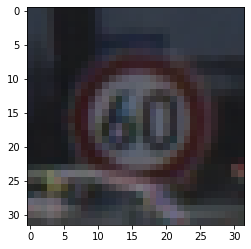

In [ ]:
plt.imshow(img_mean)

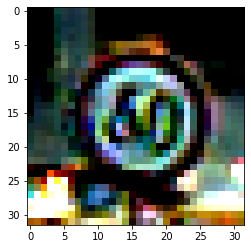

In [ ]:
plt.imshow(img_2 * 20)

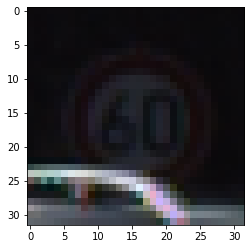

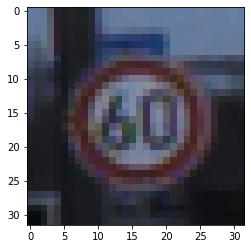

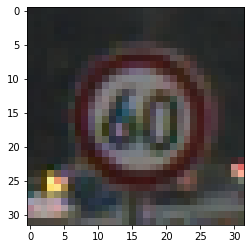

In [ ]:
for i in range(3):
    plt.imshow(pca_1[i])
    plt.show();

PCA로 방어 성능 확인하기

FGSM 공격 (Epsilon = 0.04)에 PCA = 5, PCA = 10을 더해 모델이 얼마나 방어하는지 확인해보겠다

- PCA = 10

In [ ]:
# data shape이 3,32,32이어야한다.
def defense_PCA(data,component):
    #r,g,b를 각각 나눠준다
    data = data.reshape(3,32,32)
    r = data[0] / 255
    g = data[1] / 255
    b = data[2] / 255

    pca_r = PCA(n_components=component)
    pca_r_trans = pca_r.fit_transform(r)

    pca_g = PCA(n_components=component)
    pca_g_trans = pca_g.fit_transform(g)

    pca_b = PCA(n_components=component)
    pca_b_trans = pca_b.fit_transform(b)

    pca_r_org = pca_r.inverse_transform(pca_r_trans)
    pca_g_org = pca_g.inverse_transform(pca_g_trans)
    pca_b_org = pca_b.inverse_transform(pca_b_trans)

    img_compressed = np.stack((pca_r_org, pca_g_org, pca_b_org),axis = 0)

    return img_compressed.reshape((-1,3,32,32))

In [ ]:
x_test[0].shape

(3, 32, 32)

In [ ]:
defense_PCA(x_test[0],10).shape

(1, 3, 32, 32)

In [ ]:
# FGSM 공격 코드
def fgsm_attack(image, epsilon, data_grad):
    # data_grad 의 요소별 부호 값을 얻어옵니다
    sign_data_grad = np.sign(data_grad) * 255
    perturbed_image = image + epsilon*sign_data_grad
    # 값 범위를 [0,1]로 유지하기 위해 자르기(clipping)를 추가합니다
    #perturbed_image = np.clip(perturbed_image, 0, 1), 이 경우에는 정규화를 진행하지 않았기 때문에 clipping x
    # 작은 변화가 적용된 이미지를 리턴합니다
    return perturbed_image

In [ ]:
x_test[1].shape

(3, 32, 32)

In [ ]:
## predict_output에 한개씩 넣는 것부터 구현해야한다. (전체가 들어가는 것만 정상 작동함)

def test(model, test_x, test_y, epsilon):

    # 정확도 카운터
    correct = 0
    adv_examples = []
    defense_correct = 0
    df_examples = []
    # 테스트 셋의 모든 예제에 대해 루프를 돕니다
    
    for i in range(len(test_x)):
        data = test_x[i].reshape(-1,3,32,32)
        target = test_y[i].reshape(1)
        
        result = model.predict(data)
        init_output = int(result)
 
        if init_output != target:
            continue

        data_grad = model.network.gradient_ad(data,target)
        
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        print('변형 이미지 shape :',perturbed_data.shape)
        perturbed_data_plot = perturbed_data.reshape(3,32,32)
        plt.imshow(perturbed_data_plot.transpose(1,2,0) / 255)
        plt.show();

        output = model.predict(perturbed_data)

        final_pred = int(output)


        if final_pred == int(target):
            correct += 1
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))
        else:
            if len(adv_examples) < 5:
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))


        generated_img = defense_PCA(perturbed_data,10)

        print('생성 이미지 shape :',generated_img.shape)

        generated_img_plot = generated_img.reshape(3,32,32)
        plt.imshow(generated_img_plot.transpose(1,2,0))
        plt.show();

        defense_output = model.predict(generated_img)

        defense_pred = int(defense_output)

        if defense_pred == int(target):
            defense_correct += 1
            if (epsilon == 0) and (len(df_examples) < 5):
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))
        else:
            if len(df_examples) < 5:
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))

        print('Working...!')



    # 해당 엡실론에서의 최종 정확도를 계산합니다
    final_acc = correct/float(len(test_x))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_x), final_acc))

    defense_acc = defense_correct / float(len(test_x))
    print("Epsilon: {}\tDefense Accuracy = {} / {} = {}".format(epsilon, defense_correct, len(test_x), defense_acc))
    # 정확도와 적대적 예제를 리턴합니다
    return final_acc, adv_examples, defense_acc, df_examples

In [ ]:
accuracies = []
examples = []
accuracies_df = []
examples_df = []

eps = 0.02

acc, ex, acc_df, ex_df = test(trainer, x_test[:500], t_test[:500], eps)
accuracies.append(acc)
examples.append(ex)
accuracies_df.append(acc_df)
examples_df.append(ex_df)

Output hidden; open in https://colab.research.google.com to view.

- PCA = 5

In [ ]:
## predict_output에 한개씩 넣는 것부터 구현해야한다. (전체가 들어가는 것만 정상 작동함)

def test(model, test_x, test_y, epsilon):

    # 정확도 카운터
    correct = 0
    adv_examples = []
    defense_correct = 0
    df_examples = []
    # 테스트 셋의 모든 예제에 대해 루프를 돕니다
    
    for i in range(len(test_x)):
        data = test_x[i].reshape(-1,3,32,32)
        target = test_y[i].reshape(1)
        
        result = model.predict(data)
        init_output = int(result)
 
        if init_output != target:
            continue

        data_grad = model.network.gradient_ad(data,target)
        
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        print('변형 이미지 shape :',perturbed_data.shape)
        perturbed_data_plot = perturbed_data.reshape(3,32,32)
        plt.imshow(perturbed_data_plot.transpose(1,2,0) / 255)
        plt.show();

        output = model.predict(perturbed_data)

        final_pred = int(output)


        if final_pred == int(target):
            correct += 1
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))
        else:
            if len(adv_examples) < 5:
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))


        generated_img = defense_PCA(perturbed_data,5)

        print('생성 이미지 shape :',generated_img.shape)

        generated_img_plot = generated_img.reshape(3,32,32)
        plt.imshow(generated_img_plot.transpose(1,2,0))
        plt.show();

        defense_output = model.predict(generated_img)

        defense_pred = int(defense_output)

        if defense_pred == int(target):
            defense_correct += 1
            if (epsilon == 0) and (len(df_examples) < 5):
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))
        else:
            if len(df_examples) < 5:
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))

        print('Working...!')



    # 해당 엡실론에서의 최종 정확도를 계산합니다
    final_acc = correct/float(len(test_x))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_x), final_acc))

    defense_acc = defense_correct / float(len(test_x))
    print("Epsilon: {}\tDefense Accuracy = {} / {} = {}".format(epsilon, defense_correct, len(test_x), defense_acc))
    # 정확도와 적대적 예제를 리턴합니다
    return final_acc, adv_examples, defense_acc, df_examples

In [ ]:
accuracies = []
examples = []
accuracies_df = []
examples_df = []

eps = 0.02

acc, ex, acc_df, ex_df = test(trainer, x_test[:500], t_test[:500], eps)
accuracies.append(acc)
examples.append(ex)
accuracies_df.append(acc_df)
examples_df.append(ex_df)

Output hidden; open in https://colab.research.google.com to view.

Defense GAN with PCA 

DEFENSE GAN의 Z`를 만들어주는 부분에서 ATTACKED DATA에 PCA를 더해 SMOOTHING을 극대화 시키겠다

In [ ]:
# data shape이 3,32,32이어야한다.
def defense_PCA(data,component):
    #r,g,b를 각각 나눠준다
    data = data.reshape(3,32,32)
    r = data[0] / 255
    g = data[1] / 255
    b = data[2] / 255

    pca_r = PCA(n_components=component)
    pca_r_trans = pca_r.fit_transform(r)

    pca_g = PCA(n_components=component)
    pca_g_trans = pca_g.fit_transform(g)

    pca_b = PCA(n_components=component)
    pca_b_trans = pca_b.fit_transform(b)

    pca_r_org = pca_r.inverse_transform(pca_r_trans)
    pca_g_org = pca_g.inverse_transform(pca_g_trans)
    pca_b_org = pca_b.inverse_transform(pca_b_trans)

    img_compressed = np.stack((pca_r_org, pca_g_org, pca_b_org),axis = 0)

    return img_compressed.reshape((-1,3,32,32))

In [ ]:
def DefenseGAN_with_PCA(img_at,L,R):
    z_list = []
    img = img_at.reshape(32,32,3)
    img_st = (img - np.mean(img)) / np.std(img) 
    img_var = tf.Variable(img_st,dtype = float)
    opt = tf.keras.optimizers.SGD(learning_rate=0.1,momentum = 0.7)

    def compute():
        z_hats_recs = generator_base(z_var)
        z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
        num_dim = len(z_hats_recs.get_shape())
        axes = range(1, num_dim)
        image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
        rec_loss = tf.reduce_sum(image_rec_loss)
        return rec_loss

    for r in range(R):
        z = np.random.normal(0, 1, (1, 100))
        z_var = tf.Variable(z,dtype = float)
    
        for l in range(L):
            opt.minimize(compute,[z_var])
        z_list.append(z_var)

    def compute_10(z):
        #generator_base.trainable = False #아직 더해야하는지 뺴야하는지 판단 x
        z_hats_recs = generator_base(z)
        z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
        num_dim = len(z_hats_recs.get_shape())
        axes = range(1, num_dim)
        image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
        rec_loss = tf.reduce_sum(image_rec_loss)
        return rec_loss
    

    loss_list = []
    
    for i in range(len(z_list)):
        loss = compute_10(z_list[i])
        loss_list.append(loss)
    
    index_min = np.argmin(loss_list)

    z_min = np.array(z_list[index_min])

    generated_images = 0.5 * generator_base.predict(z_min)+ 0.5

    generated_images = generated_images.reshape(32,32,3)

    generated_images_tp = generated_images.transpose(2,0,1)

    return generated_images_tp

In [ ]:
epsilons = [0, .02, .04,.06,.08,.1]

# FGSM 공격 코드
def fgsm_attack(image, epsilon, data_grad):
    # data_grad 의 요소별 부호 값을 얻어옵니다
    sign_data_grad = np.sign(data_grad) * 255
    perturbed_image = image + epsilon*sign_data_grad
    # 값 범위를 [0,1]로 유지하기 위해 자르기(clipping)를 추가합니다
    #perturbed_image = np.clip(perturbed_image, 0, 1), 이 경우에는 정규화를 진행하지 않았기 때문에 clipping x
    # 작은 변화가 적용된 이미지를 리턴합니다
    return perturbed_image

In [ ]:
## predict_output에 한개씩 넣는 것부터 구현해야한다. (전체가 들어가는 것만 정상 작동함)

def test(model, test_x, test_y, epsilon):

    # 정확도 카운터
    correct = 0
    adv_examples = []
    defense_correct = 0
    df_examples = []
    # 테스트 셋의 모든 예제에 대해 루프를 돕니다
    
    for i in range(len(test_x)):
        data = test_x[i].reshape(-1,3,32,32)
        target = test_y[i].reshape(1)
        
        result = model.predict(data)
        init_output = int(result)
 
        if init_output != target:
            continue

        data_grad = model.network.gradient_ad(data,target)
        
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        print('변형 이미지 shape :',perturbed_data.shape)
        perturbed_data_plot = perturbed_data.reshape(3,32,32)
        plt.imshow(perturbed_data_plot.transpose(1,2,0) / 255)
        plt.show();

        output = model.predict(perturbed_data)

        final_pred = int(output)


        if final_pred == int(target):
            correct += 1
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))
        else:
            if len(adv_examples) < 5:
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))


        perturbed_pca_img = defense_PCA(perturbed_data,5)
        generated_img = DefenseGAN_with_PCA(perturbed_pca_img.reshape(3,32,32).transpose(1,2,0),200,10).reshape(-1,3,32,32)

        print('생성 이미지 shape :',generated_img.shape)

        generated_img_plot = generated_img.reshape(3,32,32)
        plt.imshow(generated_img_plot.transpose(1,2,0))
        plt.show();

        defense_output = model.predict(generated_img)

        defense_pred = int(defense_output)

        if defense_pred == int(target):
            defense_correct += 1
            if (epsilon == 0) and (len(df_examples) < 5):
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))
        else:
            if len(df_examples) < 5:
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))

        print('Working...!')



    # 해당 엡실론에서의 최종 정확도를 계산합니다
    final_acc = correct/float(len(test_x))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_x), final_acc))

    defense_acc = defense_correct / float(len(test_x))
    print("Epsilon: {}\tDefense Accuracy = {} / {} = {}".format(epsilon, defense_correct, len(test_x), defense_acc))
    # 정확도와 적대적 예제를 리턴합니다
    return final_acc, adv_examples, defense_acc, df_examples

변형 이미지 shape : (1, 3, 32, 32)


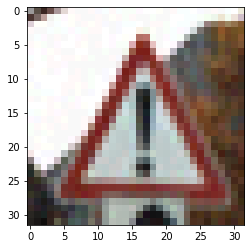

생성 이미지 shape : (1, 3, 32, 32)


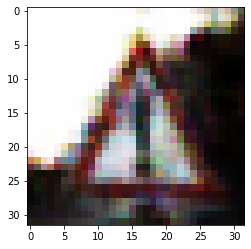

Working...!
변형 이미지 shape : (1, 3, 32, 32)


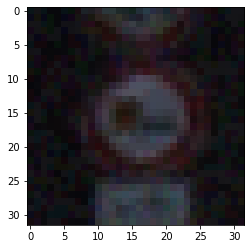

생성 이미지 shape : (1, 3, 32, 32)


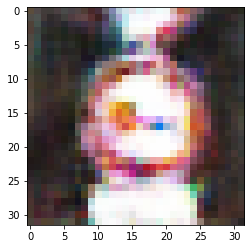

Working...!
변형 이미지 shape : (1, 3, 32, 32)


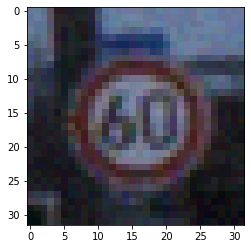

생성 이미지 shape : (1, 3, 32, 32)


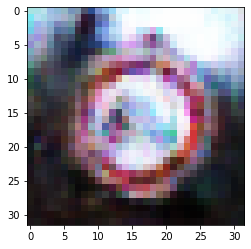

Working...!
변형 이미지 shape : (1, 3, 32, 32)


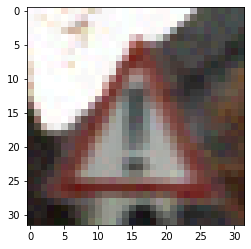

생성 이미지 shape : (1, 3, 32, 32)


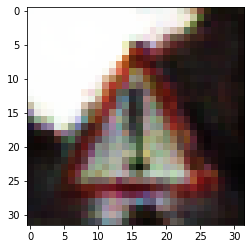

Working...!
변형 이미지 shape : (1, 3, 32, 32)


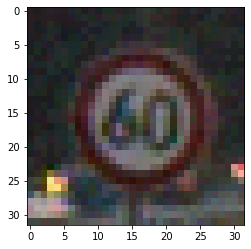

생성 이미지 shape : (1, 3, 32, 32)


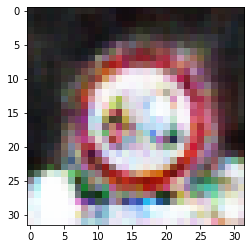

Working...!
변형 이미지 shape : (1, 3, 32, 32)


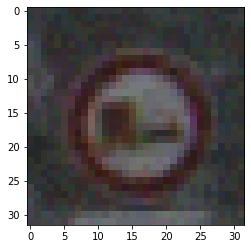

생성 이미지 shape : (1, 3, 32, 32)


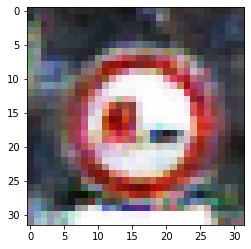

Working...!
변형 이미지 shape : (1, 3, 32, 32)


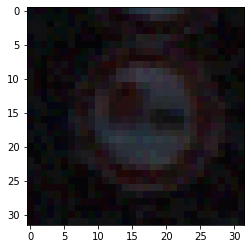

생성 이미지 shape : (1, 3, 32, 32)


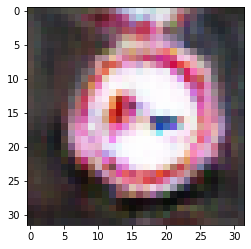

Working...!
변형 이미지 shape : (1, 3, 32, 32)


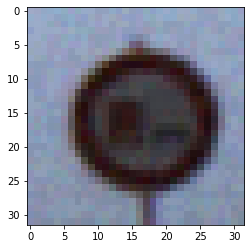

생성 이미지 shape : (1, 3, 32, 32)


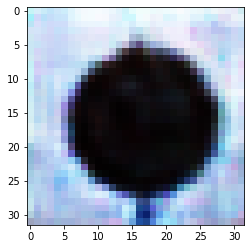

Working...!
변형 이미지 shape : (1, 3, 32, 32)


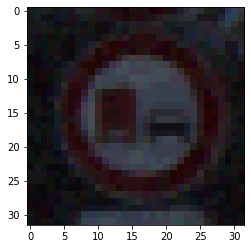

생성 이미지 shape : (1, 3, 32, 32)


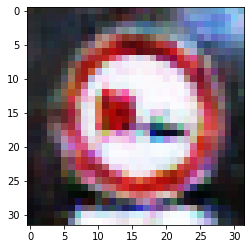

Working...!
변형 이미지 shape : (1, 3, 32, 32)


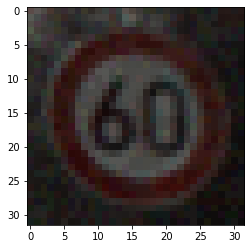

생성 이미지 shape : (1, 3, 32, 32)


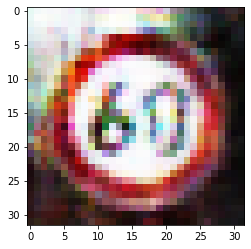

Working...!
변형 이미지 shape : (1, 3, 32, 32)


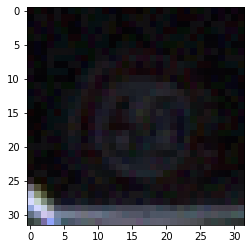

생성 이미지 shape : (1, 3, 32, 32)


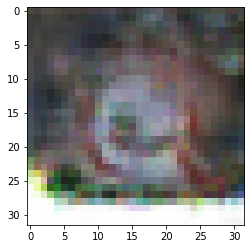

Working...!
변형 이미지 shape : (1, 3, 32, 32)


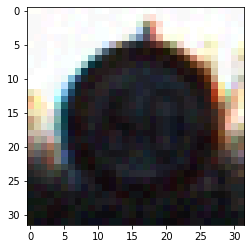

생성 이미지 shape : (1, 3, 32, 32)


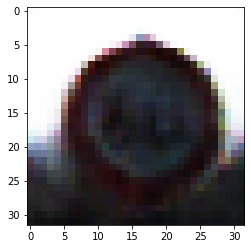

Working...!
변형 이미지 shape : (1, 3, 32, 32)


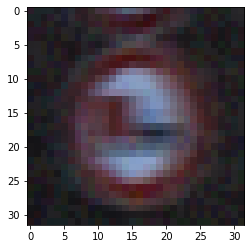

생성 이미지 shape : (1, 3, 32, 32)


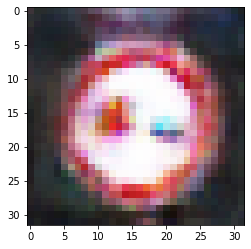

Working...!
변형 이미지 shape : (1, 3, 32, 32)


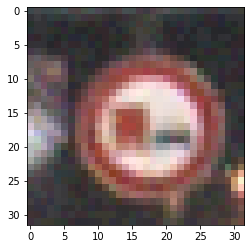

생성 이미지 shape : (1, 3, 32, 32)


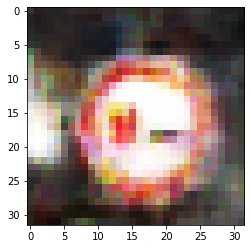

Working...!
변형 이미지 shape : (1, 3, 32, 32)


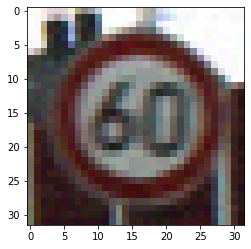

생성 이미지 shape : (1, 3, 32, 32)


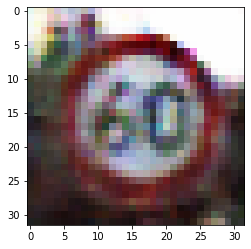

Working...!
변형 이미지 shape : (1, 3, 32, 32)


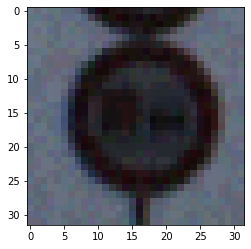

생성 이미지 shape : (1, 3, 32, 32)


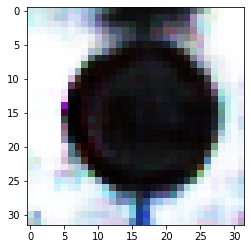

Working...!
변형 이미지 shape : (1, 3, 32, 32)


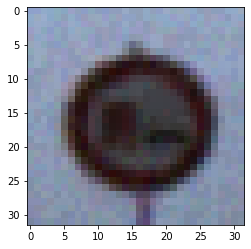

생성 이미지 shape : (1, 3, 32, 32)


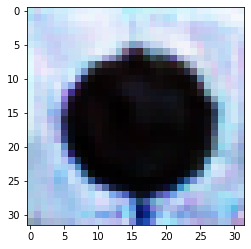

Working...!
변형 이미지 shape : (1, 3, 32, 32)


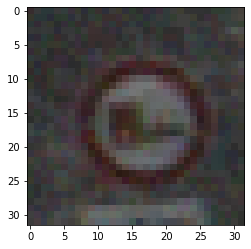

생성 이미지 shape : (1, 3, 32, 32)


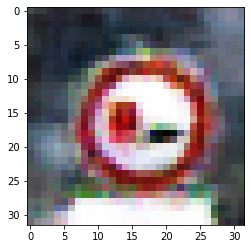

Working...!
변형 이미지 shape : (1, 3, 32, 32)


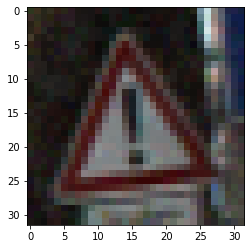

생성 이미지 shape : (1, 3, 32, 32)


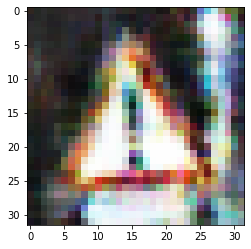

Working...!
변형 이미지 shape : (1, 3, 32, 32)


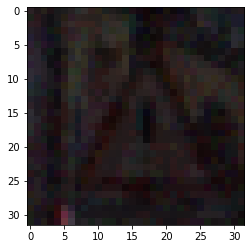

생성 이미지 shape : (1, 3, 32, 32)


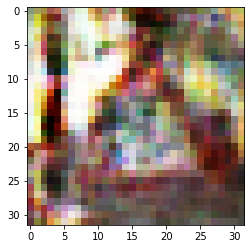

Working...!
변형 이미지 shape : (1, 3, 32, 32)


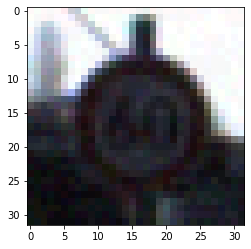

생성 이미지 shape : (1, 3, 32, 32)


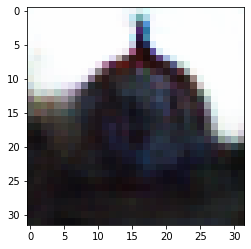

Working...!
변형 이미지 shape : (1, 3, 32, 32)


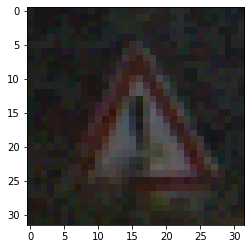

생성 이미지 shape : (1, 3, 32, 32)


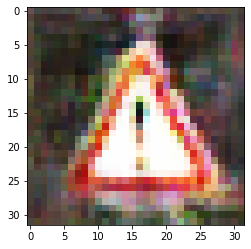

Working...!
변형 이미지 shape : (1, 3, 32, 32)


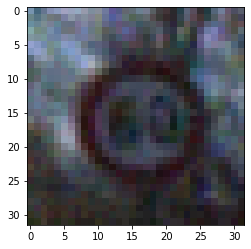

생성 이미지 shape : (1, 3, 32, 32)


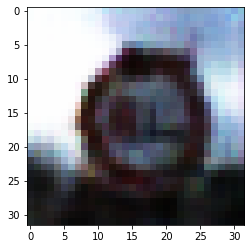

Working...!
변형 이미지 shape : (1, 3, 32, 32)


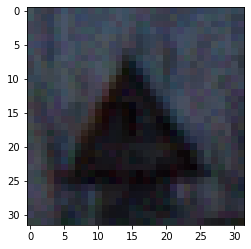

생성 이미지 shape : (1, 3, 32, 32)


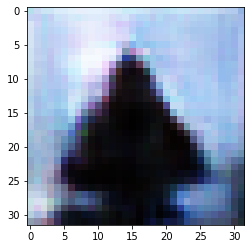

Working...!
변형 이미지 shape : (1, 3, 32, 32)


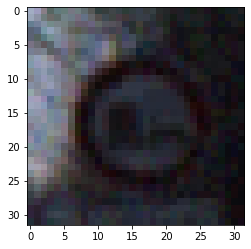

생성 이미지 shape : (1, 3, 32, 32)


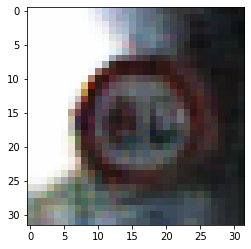

Working...!
변형 이미지 shape : (1, 3, 32, 32)


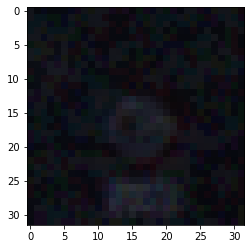

생성 이미지 shape : (1, 3, 32, 32)


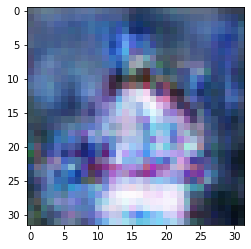

Working...!
변형 이미지 shape : (1, 3, 32, 32)


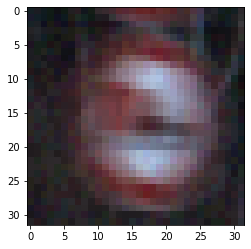

생성 이미지 shape : (1, 3, 32, 32)


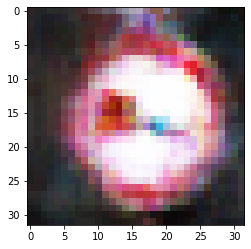

Working...!
변형 이미지 shape : (1, 3, 32, 32)


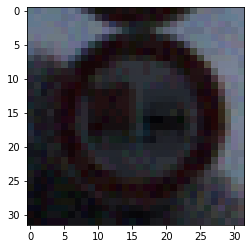

생성 이미지 shape : (1, 3, 32, 32)


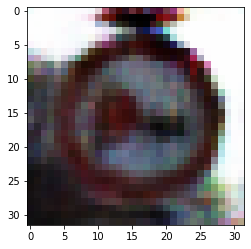

Working...!
변형 이미지 shape : (1, 3, 32, 32)


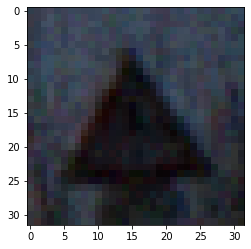

생성 이미지 shape : (1, 3, 32, 32)


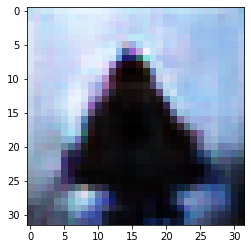

Working...!
변형 이미지 shape : (1, 3, 32, 32)


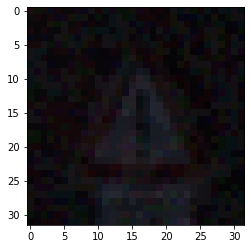

생성 이미지 shape : (1, 3, 32, 32)


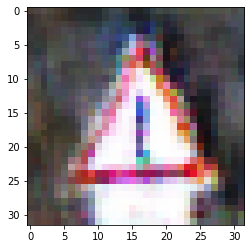

Working...!
변형 이미지 shape : (1, 3, 32, 32)


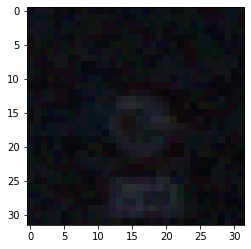

생성 이미지 shape : (1, 3, 32, 32)


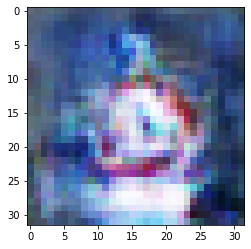

Working...!
변형 이미지 shape : (1, 3, 32, 32)


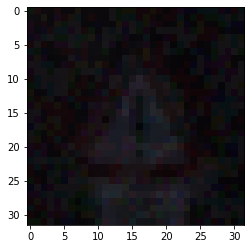

생성 이미지 shape : (1, 3, 32, 32)


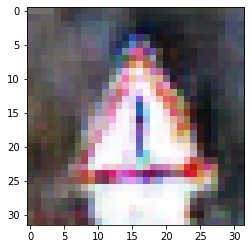

Working...!
변형 이미지 shape : (1, 3, 32, 32)


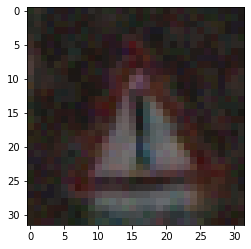

생성 이미지 shape : (1, 3, 32, 32)


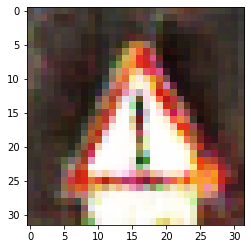

Working...!
변형 이미지 shape : (1, 3, 32, 32)


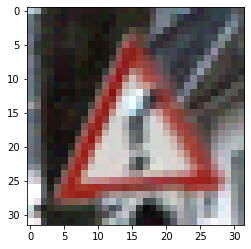

생성 이미지 shape : (1, 3, 32, 32)


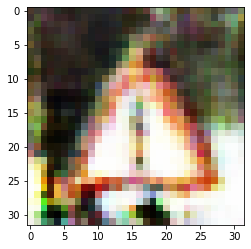

Working...!
변형 이미지 shape : (1, 3, 32, 32)


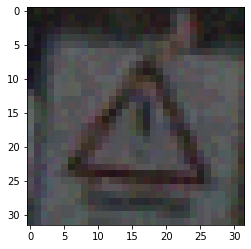

생성 이미지 shape : (1, 3, 32, 32)


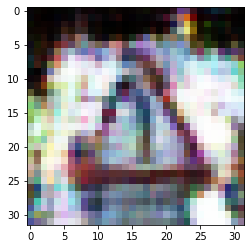

Working...!
변형 이미지 shape : (1, 3, 32, 32)


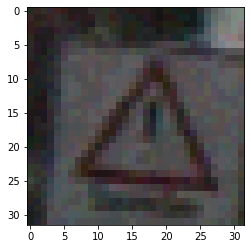

생성 이미지 shape : (1, 3, 32, 32)


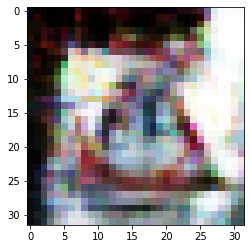

Working...!
변형 이미지 shape : (1, 3, 32, 32)


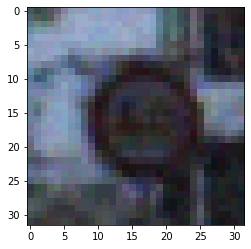

생성 이미지 shape : (1, 3, 32, 32)


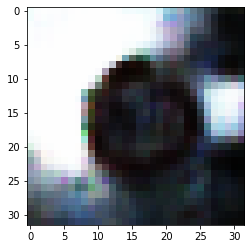

Working...!
변형 이미지 shape : (1, 3, 32, 32)


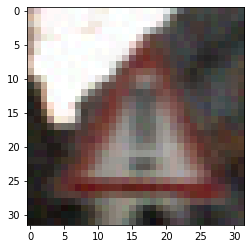

생성 이미지 shape : (1, 3, 32, 32)


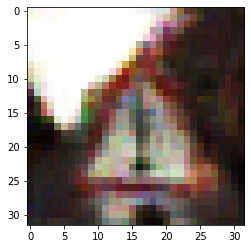

Working...!
변형 이미지 shape : (1, 3, 32, 32)


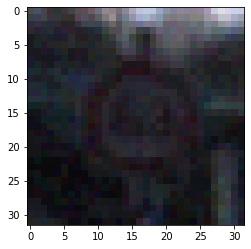

생성 이미지 shape : (1, 3, 32, 32)


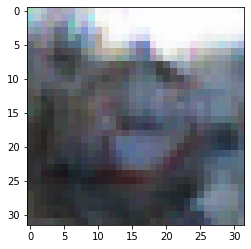

Working...!
변형 이미지 shape : (1, 3, 32, 32)


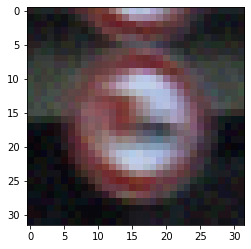

생성 이미지 shape : (1, 3, 32, 32)


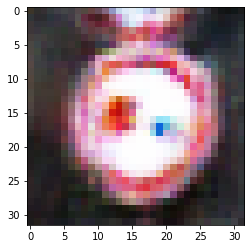

Working...!
변형 이미지 shape : (1, 3, 32, 32)


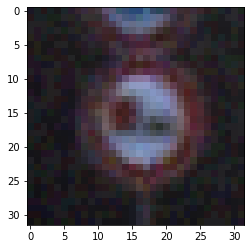

생성 이미지 shape : (1, 3, 32, 32)


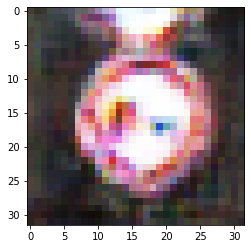

Working...!
변형 이미지 shape : (1, 3, 32, 32)


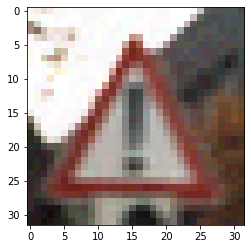

생성 이미지 shape : (1, 3, 32, 32)


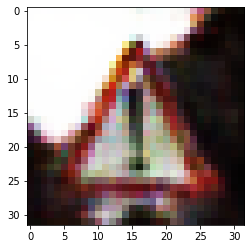

Working...!
변형 이미지 shape : (1, 3, 32, 32)


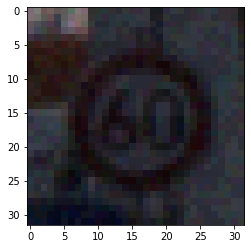

생성 이미지 shape : (1, 3, 32, 32)


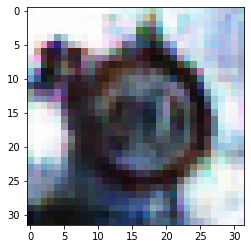

Working...!
변형 이미지 shape : (1, 3, 32, 32)


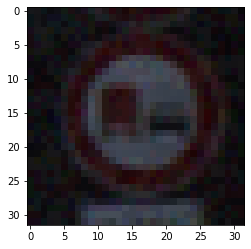

생성 이미지 shape : (1, 3, 32, 32)


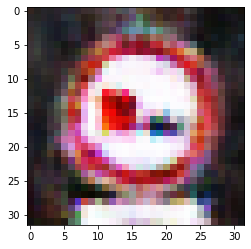

Working...!
변형 이미지 shape : (1, 3, 32, 32)


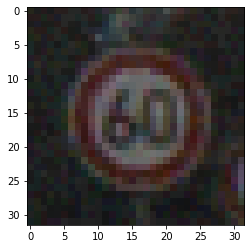

생성 이미지 shape : (1, 3, 32, 32)


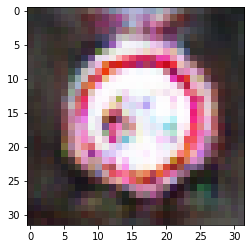

Working...!
변형 이미지 shape : (1, 3, 32, 32)


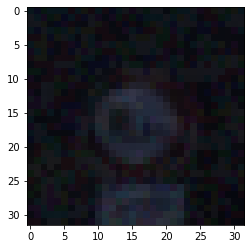

생성 이미지 shape : (1, 3, 32, 32)


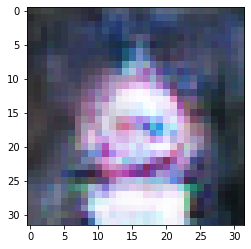

Working...!
변형 이미지 shape : (1, 3, 32, 32)


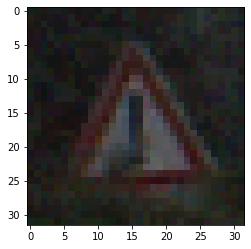

생성 이미지 shape : (1, 3, 32, 32)


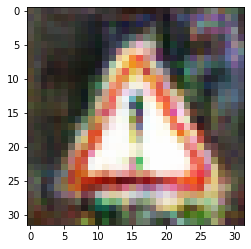

Working...!
변형 이미지 shape : (1, 3, 32, 32)


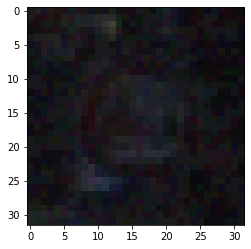

생성 이미지 shape : (1, 3, 32, 32)


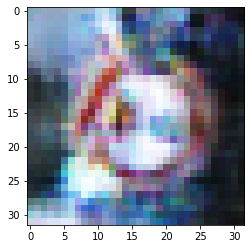

Working...!
변형 이미지 shape : (1, 3, 32, 32)


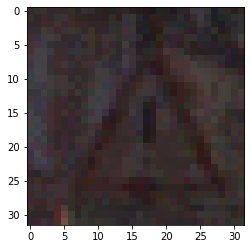

생성 이미지 shape : (1, 3, 32, 32)


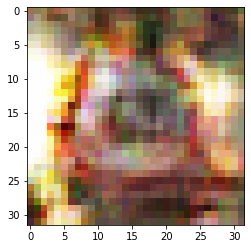

Working...!
변형 이미지 shape : (1, 3, 32, 32)


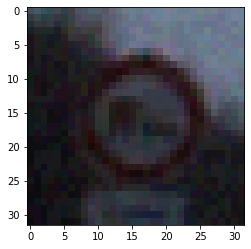

생성 이미지 shape : (1, 3, 32, 32)


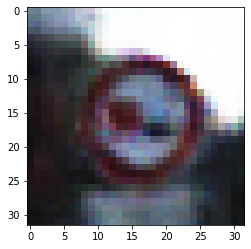

Working...!
변형 이미지 shape : (1, 3, 32, 32)


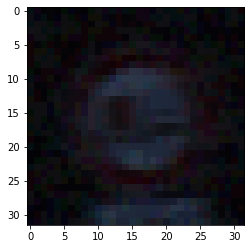

생성 이미지 shape : (1, 3, 32, 32)


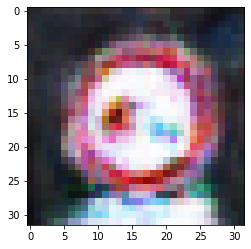

Working...!
변형 이미지 shape : (1, 3, 32, 32)


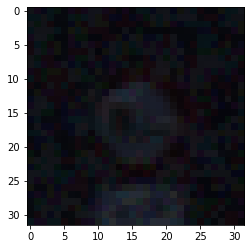

생성 이미지 shape : (1, 3, 32, 32)


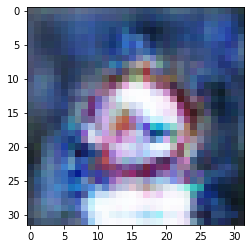

Working...!
변형 이미지 shape : (1, 3, 32, 32)


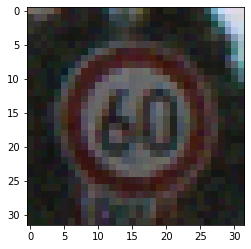

생성 이미지 shape : (1, 3, 32, 32)


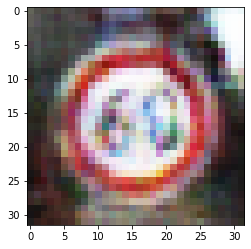

Working...!
변형 이미지 shape : (1, 3, 32, 32)


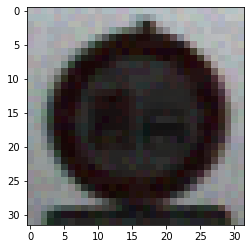

생성 이미지 shape : (1, 3, 32, 32)


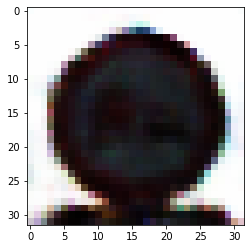

Working...!
변형 이미지 shape : (1, 3, 32, 32)


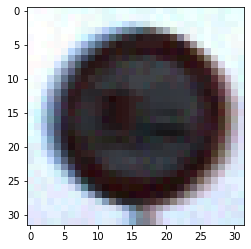

생성 이미지 shape : (1, 3, 32, 32)


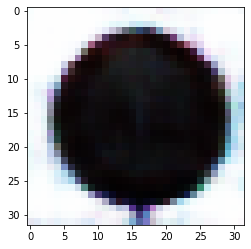

Working...!
변형 이미지 shape : (1, 3, 32, 32)


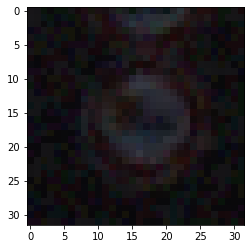

생성 이미지 shape : (1, 3, 32, 32)


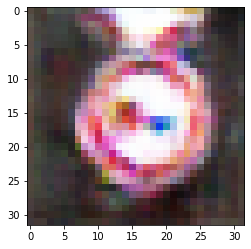

Working...!
변형 이미지 shape : (1, 3, 32, 32)


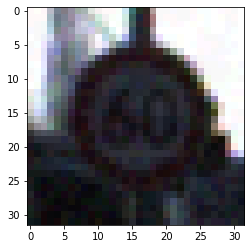

생성 이미지 shape : (1, 3, 32, 32)


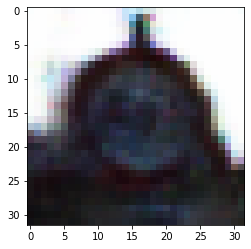

Working...!
변형 이미지 shape : (1, 3, 32, 32)


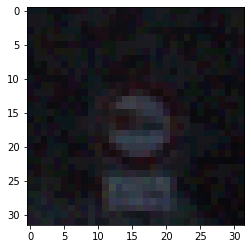

생성 이미지 shape : (1, 3, 32, 32)


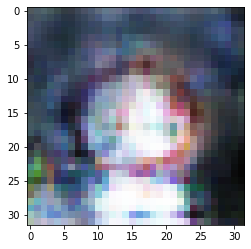

Working...!
변형 이미지 shape : (1, 3, 32, 32)


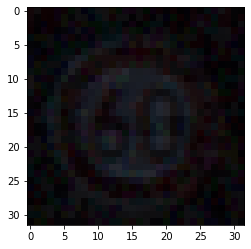

생성 이미지 shape : (1, 3, 32, 32)


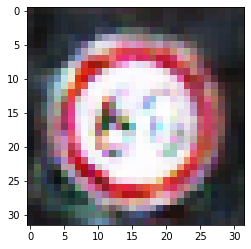

Working...!
변형 이미지 shape : (1, 3, 32, 32)


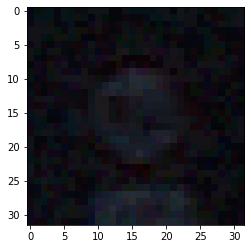

생성 이미지 shape : (1, 3, 32, 32)


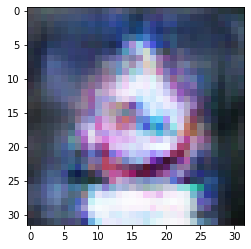

Working...!
변형 이미지 shape : (1, 3, 32, 32)


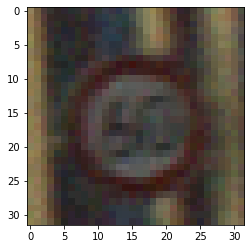

생성 이미지 shape : (1, 3, 32, 32)


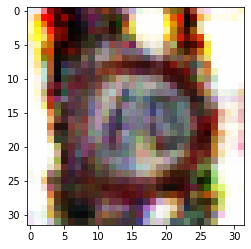

Working...!
변형 이미지 shape : (1, 3, 32, 32)


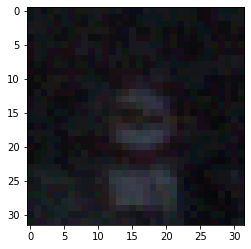

생성 이미지 shape : (1, 3, 32, 32)


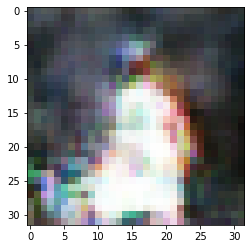

Working...!
변형 이미지 shape : (1, 3, 32, 32)


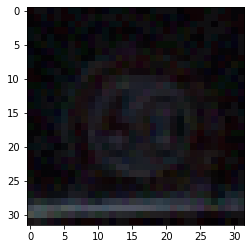

생성 이미지 shape : (1, 3, 32, 32)


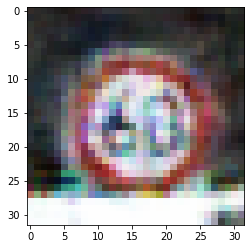

Working...!
변형 이미지 shape : (1, 3, 32, 32)


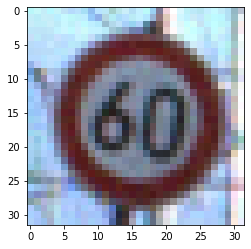

생성 이미지 shape : (1, 3, 32, 32)


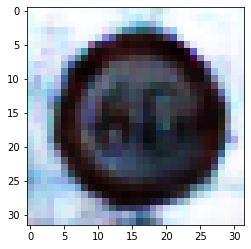

Working...!
변형 이미지 shape : (1, 3, 32, 32)


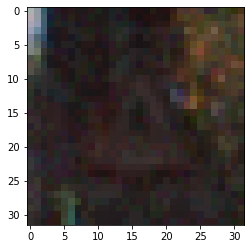

생성 이미지 shape : (1, 3, 32, 32)


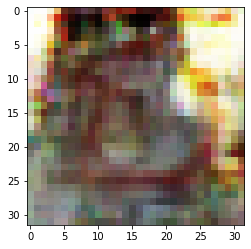

Working...!
변형 이미지 shape : (1, 3, 32, 32)


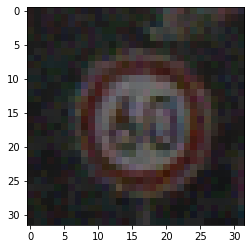

생성 이미지 shape : (1, 3, 32, 32)


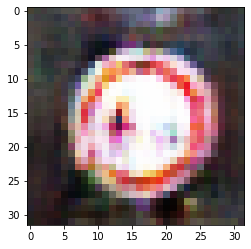

Working...!
변형 이미지 shape : (1, 3, 32, 32)


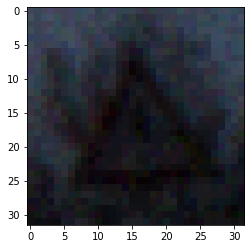

생성 이미지 shape : (1, 3, 32, 32)


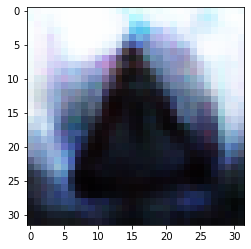

Working...!
변형 이미지 shape : (1, 3, 32, 32)


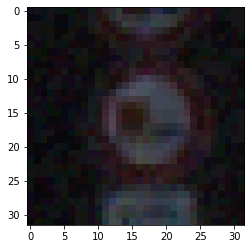

생성 이미지 shape : (1, 3, 32, 32)


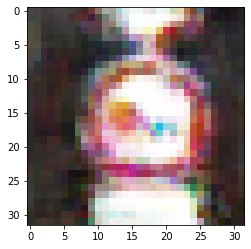

Working...!
변형 이미지 shape : (1, 3, 32, 32)


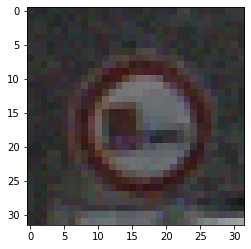

생성 이미지 shape : (1, 3, 32, 32)


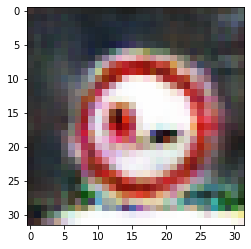

Working...!
변형 이미지 shape : (1, 3, 32, 32)


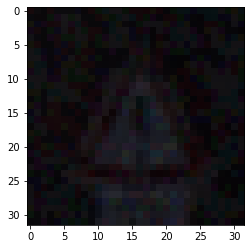

생성 이미지 shape : (1, 3, 32, 32)


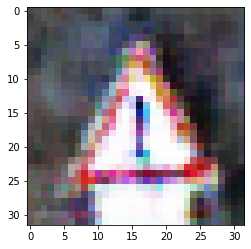

Working...!
변형 이미지 shape : (1, 3, 32, 32)


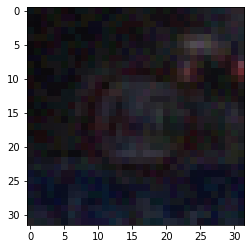

생성 이미지 shape : (1, 3, 32, 32)


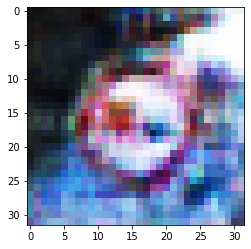

Working...!
변형 이미지 shape : (1, 3, 32, 32)


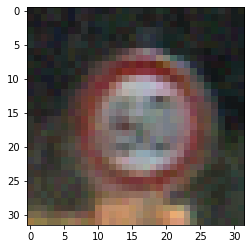

생성 이미지 shape : (1, 3, 32, 32)


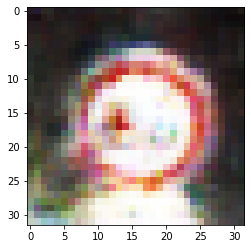

Working...!
변형 이미지 shape : (1, 3, 32, 32)


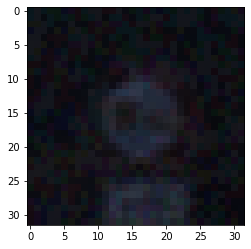

생성 이미지 shape : (1, 3, 32, 32)


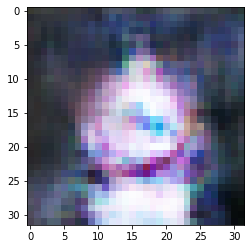

Working...!
변형 이미지 shape : (1, 3, 32, 32)


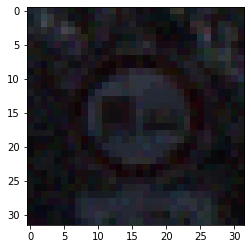

생성 이미지 shape : (1, 3, 32, 32)


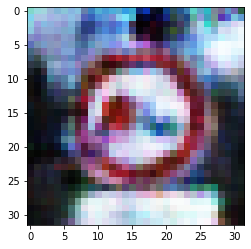

Working...!
변형 이미지 shape : (1, 3, 32, 32)


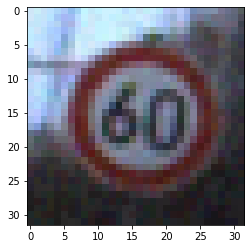

생성 이미지 shape : (1, 3, 32, 32)


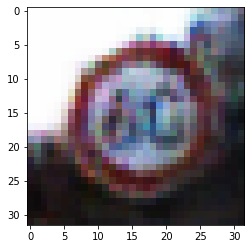

Working...!
변형 이미지 shape : (1, 3, 32, 32)


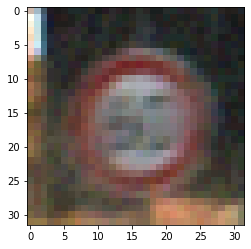

생성 이미지 shape : (1, 3, 32, 32)


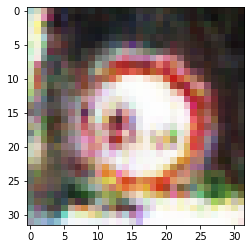

Working...!
변형 이미지 shape : (1, 3, 32, 32)


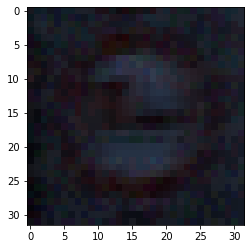

생성 이미지 shape : (1, 3, 32, 32)


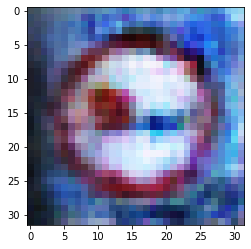

Working...!
변형 이미지 shape : (1, 3, 32, 32)


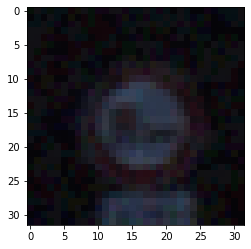

생성 이미지 shape : (1, 3, 32, 32)


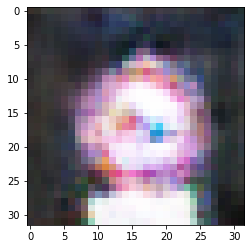

Working...!
변형 이미지 shape : (1, 3, 32, 32)


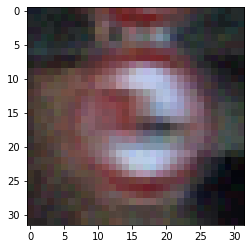

생성 이미지 shape : (1, 3, 32, 32)


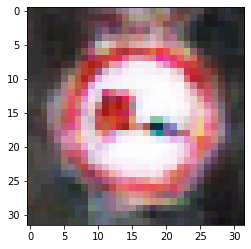

Working...!
변형 이미지 shape : (1, 3, 32, 32)


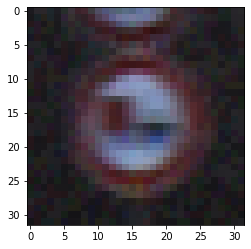

생성 이미지 shape : (1, 3, 32, 32)


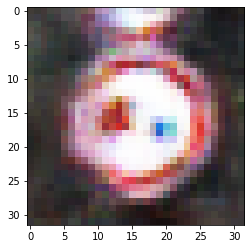

Working...!
변형 이미지 shape : (1, 3, 32, 32)


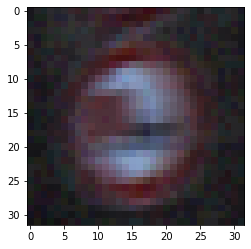

생성 이미지 shape : (1, 3, 32, 32)


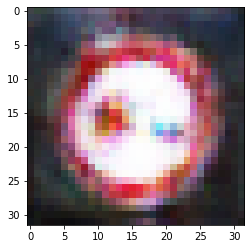

Working...!
변형 이미지 shape : (1, 3, 32, 32)


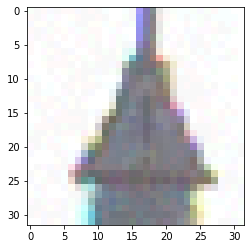

생성 이미지 shape : (1, 3, 32, 32)


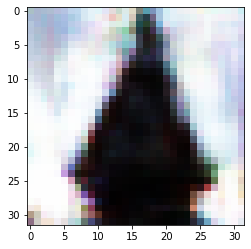

Working...!
변형 이미지 shape : (1, 3, 32, 32)


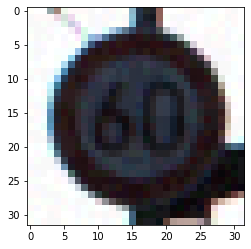

생성 이미지 shape : (1, 3, 32, 32)


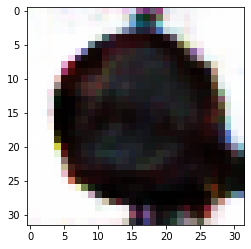

Working...!
변형 이미지 shape : (1, 3, 32, 32)


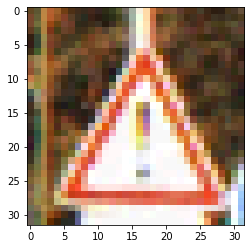

생성 이미지 shape : (1, 3, 32, 32)


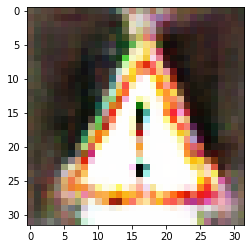

Working...!
변형 이미지 shape : (1, 3, 32, 32)


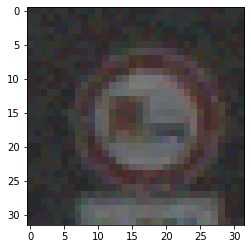

생성 이미지 shape : (1, 3, 32, 32)


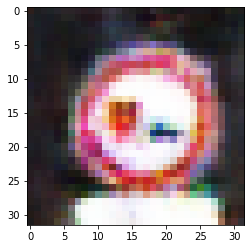

Working...!
변형 이미지 shape : (1, 3, 32, 32)


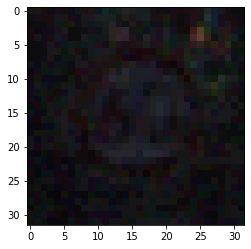

생성 이미지 shape : (1, 3, 32, 32)


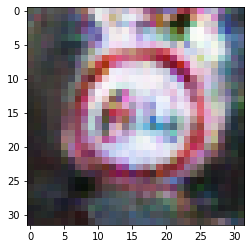

Working...!
변형 이미지 shape : (1, 3, 32, 32)


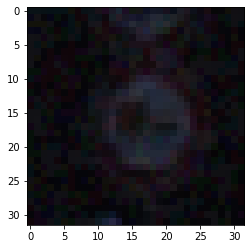

생성 이미지 shape : (1, 3, 32, 32)


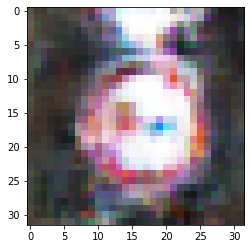

Working...!
변형 이미지 shape : (1, 3, 32, 32)


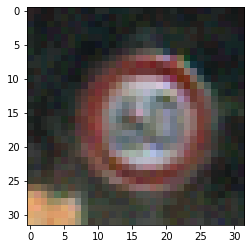

생성 이미지 shape : (1, 3, 32, 32)


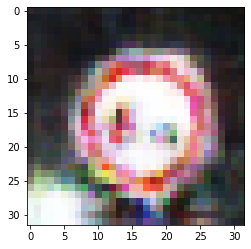

Working...!
변형 이미지 shape : (1, 3, 32, 32)


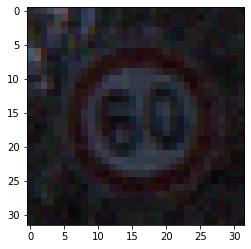

생성 이미지 shape : (1, 3, 32, 32)


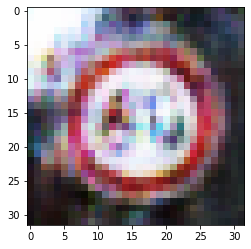

Working...!
변형 이미지 shape : (1, 3, 32, 32)


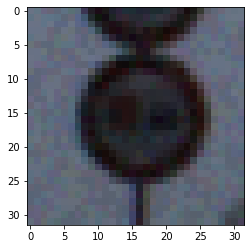

생성 이미지 shape : (1, 3, 32, 32)


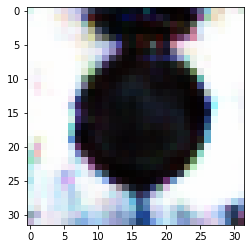

Working...!
변형 이미지 shape : (1, 3, 32, 32)


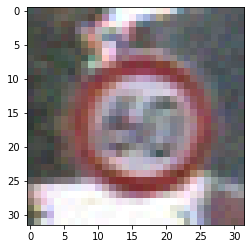

생성 이미지 shape : (1, 3, 32, 32)


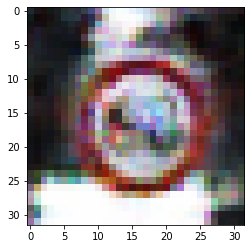

Working...!
변형 이미지 shape : (1, 3, 32, 32)


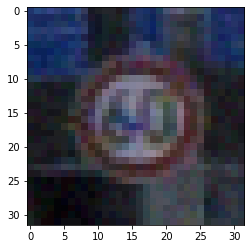

생성 이미지 shape : (1, 3, 32, 32)


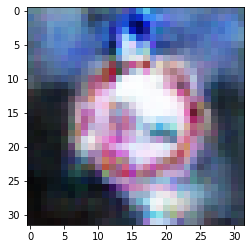

Working...!
변형 이미지 shape : (1, 3, 32, 32)


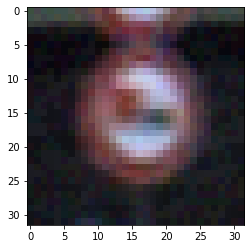

생성 이미지 shape : (1, 3, 32, 32)


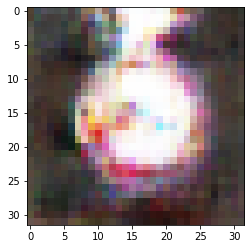

Working...!
Epsilon: 0.02	Test Accuracy = 41 / 100 = 0.41
Epsilon: 0.02	Defense Accuracy = 59 / 100 = 0.59


In [ ]:
accuracies = []
examples = []
accuracies_df = []
examples_df = []

eps = 0.02

acc, ex, acc_df, ex_df = test(trainer, x_test[:100], t_test[:100], eps)
accuracies.append(acc)
examples.append(ex)
accuracies_df.append(acc_df)
examples_df.append(ex_df)

# defensegan with pca : 
defensegan의 classifier 앞에 pca를 위치하여 판별해주겠다.

In [ ]:
import tensorflow as tf

In [ ]:
# data shape이 3,32,32이어야한다.
def defense_PCA(data,component):
    #r,g,b를 각각 나눠준다
    data = data.reshape(3,32,32)
    r = data[0] / 255
    g = data[1] / 255
    b = data[2] / 255

    pca_r = PCA(n_components=component)
    pca_r_trans = pca_r.fit_transform(r)

    pca_g = PCA(n_components=component)
    pca_g_trans = pca_g.fit_transform(g)

    pca_b = PCA(n_components=component)
    pca_b_trans = pca_b.fit_transform(b)

    pca_r_org = pca_r.inverse_transform(pca_r_trans)
    pca_g_org = pca_g.inverse_transform(pca_g_trans)
    pca_b_org = pca_b.inverse_transform(pca_b_trans)

    img_compressed = np.stack((pca_r_org, pca_g_org, pca_b_org),axis = 0)

    return img_compressed.reshape((-1,3,32,32))

In [ ]:
def DefenseGAN_with_PCA(img_at,L,R):
    z_list = []
    img = img_at.reshape(32,32,3)
    img_st = (img - np.mean(img)) / np.std(img) 
    img_var = tf.Variable(img_st,dtype = float)
    opt = tf.keras.optimizers.SGD(learning_rate=0.1,momentum = 0.7)

    def compute():
        z_hats_recs = generator_base(z_var)
        z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
        num_dim = len(z_hats_recs.get_shape())
        axes = range(1, num_dim)
        image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
        rec_loss = tf.reduce_sum(image_rec_loss)
        return rec_loss

    for r in range(R):
        z = np.random.normal(0, 1, (1, 100))
        z_var = tf.Variable(z,dtype = float)
    
        for l in range(L):
            opt.minimize(compute,[z_var])
        z_list.append(z_var)

    def compute_10(z):
        #generator_base.trainable = False #아직 더해야하는지 뺴야하는지 판단 x
        z_hats_recs = generator_base(z)
        z_hats_recs = tf.reshape(z_hats_recs, [32,32,3])
        num_dim = len(z_hats_recs.get_shape())
        axes = range(1, num_dim)
        image_rec_loss = tf.reduce_mean(tf.square(z_hats_recs - img_var),axis=axes)
        rec_loss = tf.reduce_sum(image_rec_loss)
        return rec_loss
    

    loss_list = []
    
    for i in range(len(z_list)):
        loss = compute_10(z_list[i])
        loss_list.append(loss)
    
    index_min = np.argmin(loss_list)

    z_min = np.array(z_list[index_min])

    generated_images = 0.5 * generator_base.predict(z_min)+ 0.5

    generated_images = generated_images.reshape(32,32,3)

    generated_images_tp = generated_images.transpose(2,0,1)

    return generated_images_tp

In [ ]:
epsilons = [0, .02, .04,.06,.08,.1]

# FGSM 공격 코드
def fgsm_attack(image, epsilon, data_grad):
    # data_grad 의 요소별 부호 값을 얻어옵니다
    sign_data_grad = np.sign(data_grad) * 255
    perturbed_image = image + epsilon*sign_data_grad
    # 값 범위를 [0,1]로 유지하기 위해 자르기(clipping)를 추가합니다
    #perturbed_image = np.clip(perturbed_image, 0, 1), 이 경우에는 정규화를 진행하지 않았기 때문에 clipping x
    # 작은 변화가 적용된 이미지를 리턴합니다
    return perturbed_image

In [ ]:
## predict_output에 한개씩 넣는 것부터 구현해야한다. (전체가 들어가는 것만 정상 작동함)

def test(model, test_x, test_y, epsilon):

    # 정확도 카운터
    correct = 0
    adv_examples = []
    defense_correct = 0
    df_examples = []
    # 테스트 셋의 모든 예제에 대해 루프를 돕니다
    
    for i in range(len(test_x)):
        data = test_x[i].reshape(-1,3,32,32)
        target = test_y[i].reshape(1)
        
        result = model.predict(data)
        init_output = int(result)
 
        if init_output != target:
            continue

        data_grad = model.network.gradient_ad(data,target)
        
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        print('변형 이미지 shape :',perturbed_data.shape)
        perturbed_data_plot = perturbed_data.reshape(3,32,32)
        plt.imshow(perturbed_data_plot.transpose(1,2,0) / 255)
        plt.show();

        output = model.predict(perturbed_data)

        final_pred = int(output)


        if final_pred == int(target):
            correct += 1
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))
        else:
            if len(adv_examples) < 5:
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))


        generated_img = DefenseGAN_with_PCA(perturbed_data.reshape(3,32,32).transpose(1,2,0),200,10).reshape(-1,3,32,32)

        print('생성 이미지 shape :',generated_img.shape)

        generated_img_plot = generated_img.reshape(3,32,32)
        plt.imshow(generated_img_plot.transpose(1,2,0))
        plt.show();

        generated_pca_img = defense_PCA(generated_img,10)
        defense_output = model.predict(generated_pca_img)

        defense_pred = int(defense_output)

        if defense_pred == int(target):
            defense_correct += 1
            if (epsilon == 0) and (len(df_examples) < 5):
                df_ex = generated_pca_img
                df_examples.append((init_output,defense_pred,generated_pca_img))
        else:
            if len(df_examples) < 5:
                df_ex = generated_pca_img
                df_examples.append((init_output,defense_pred,generated_pca_img))

        print('Working...!')



    # 해당 엡실론에서의 최종 정확도를 계산합니다
    final_acc = correct/float(len(test_x))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_x), final_acc))

    defense_acc = defense_correct / float(len(test_x))
    print("Epsilon: {}\tDefense Accuracy = {} / {} = {}".format(epsilon, defense_correct, len(test_x), defense_acc))
    # 정확도와 적대적 예제를 리턴합니다
    return final_acc, adv_examples, defense_acc, df_examples

변형 이미지 shape : (1, 3, 32, 32)


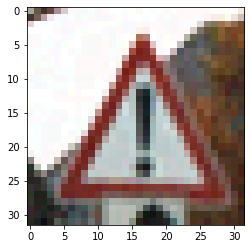

생성 이미지 shape : (1, 3, 32, 32)


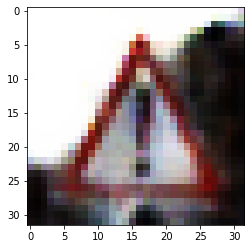

Working...!
변형 이미지 shape : (1, 3, 32, 32)


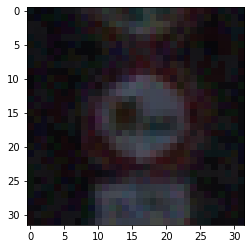

생성 이미지 shape : (1, 3, 32, 32)


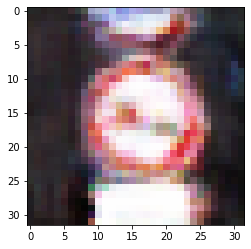

Working...!
변형 이미지 shape : (1, 3, 32, 32)


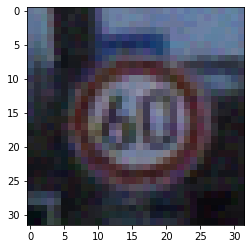

생성 이미지 shape : (1, 3, 32, 32)


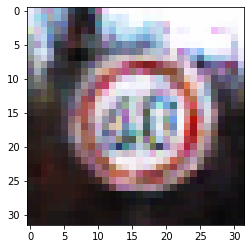

Working...!
변형 이미지 shape : (1, 3, 32, 32)


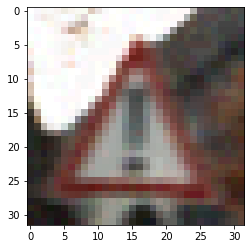

생성 이미지 shape : (1, 3, 32, 32)


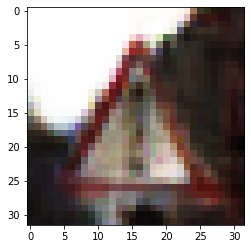

Working...!
변형 이미지 shape : (1, 3, 32, 32)


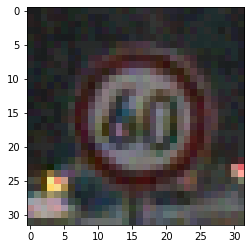

생성 이미지 shape : (1, 3, 32, 32)


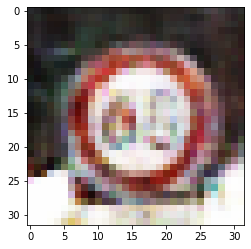

Working...!
변형 이미지 shape : (1, 3, 32, 32)


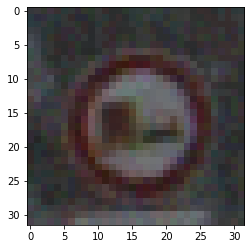

생성 이미지 shape : (1, 3, 32, 32)


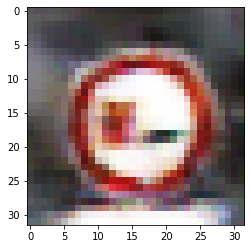

Working...!
변형 이미지 shape : (1, 3, 32, 32)


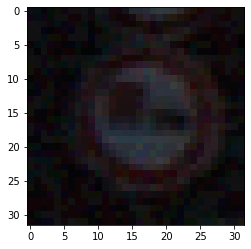

생성 이미지 shape : (1, 3, 32, 32)


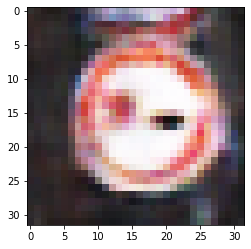

Working...!
변형 이미지 shape : (1, 3, 32, 32)


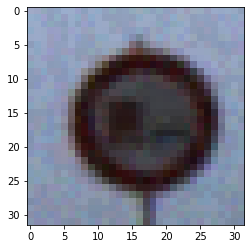

생성 이미지 shape : (1, 3, 32, 32)


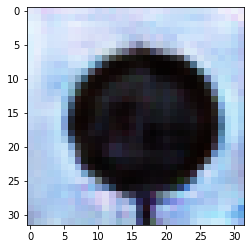

Working...!
변형 이미지 shape : (1, 3, 32, 32)


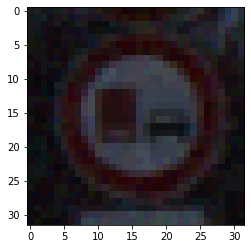

생성 이미지 shape : (1, 3, 32, 32)


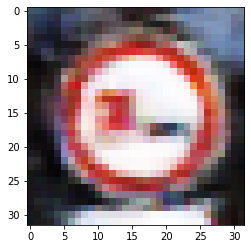

Working...!
변형 이미지 shape : (1, 3, 32, 32)


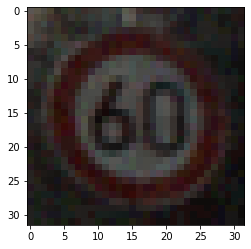

생성 이미지 shape : (1, 3, 32, 32)


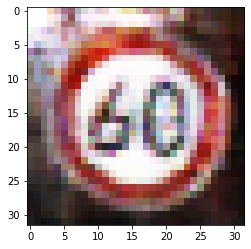

Working...!
변형 이미지 shape : (1, 3, 32, 32)


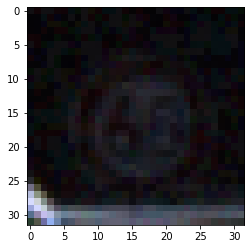

생성 이미지 shape : (1, 3, 32, 32)


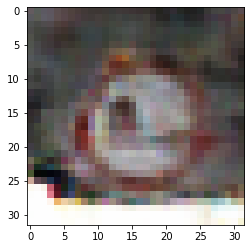

Working...!
변형 이미지 shape : (1, 3, 32, 32)


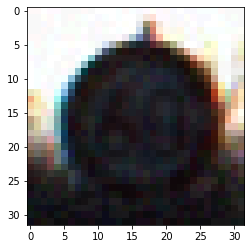

생성 이미지 shape : (1, 3, 32, 32)


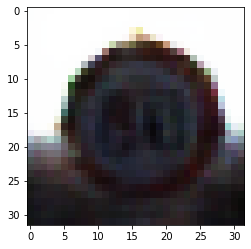

Working...!
변형 이미지 shape : (1, 3, 32, 32)


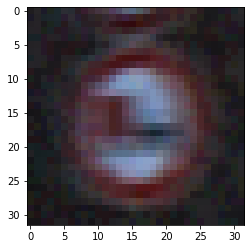

생성 이미지 shape : (1, 3, 32, 32)


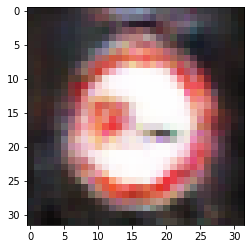

Working...!
변형 이미지 shape : (1, 3, 32, 32)


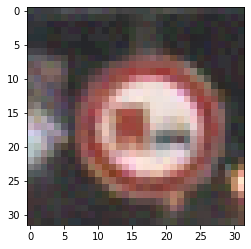

생성 이미지 shape : (1, 3, 32, 32)


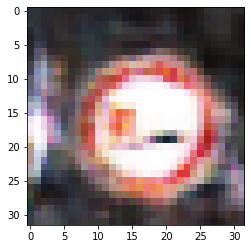

Working...!
변형 이미지 shape : (1, 3, 32, 32)


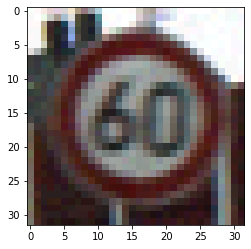

생성 이미지 shape : (1, 3, 32, 32)


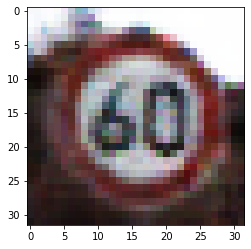

Working...!
변형 이미지 shape : (1, 3, 32, 32)


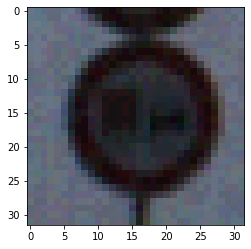

생성 이미지 shape : (1, 3, 32, 32)


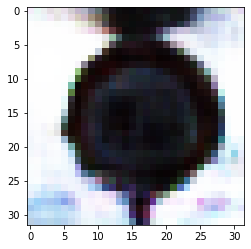

Working...!
변형 이미지 shape : (1, 3, 32, 32)


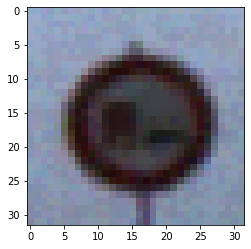

생성 이미지 shape : (1, 3, 32, 32)


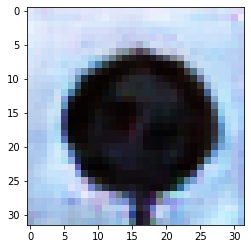

Working...!
변형 이미지 shape : (1, 3, 32, 32)


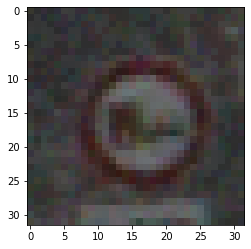

생성 이미지 shape : (1, 3, 32, 32)


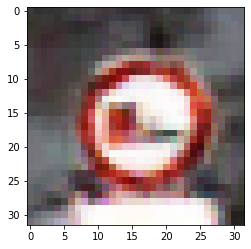

Working...!
변형 이미지 shape : (1, 3, 32, 32)


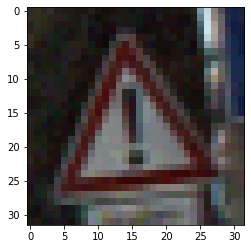

생성 이미지 shape : (1, 3, 32, 32)


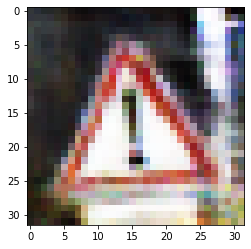

Working...!
변형 이미지 shape : (1, 3, 32, 32)


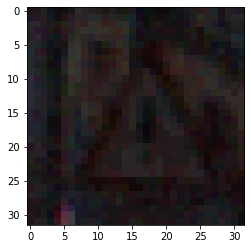

생성 이미지 shape : (1, 3, 32, 32)


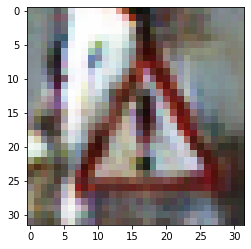

Working...!
변형 이미지 shape : (1, 3, 32, 32)


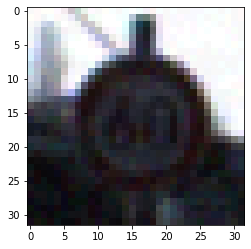

생성 이미지 shape : (1, 3, 32, 32)


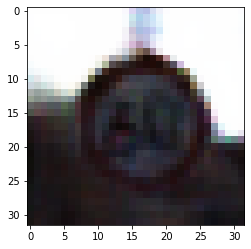

Working...!
변형 이미지 shape : (1, 3, 32, 32)


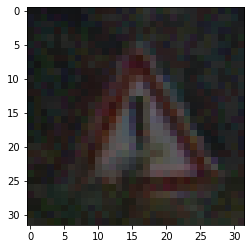

생성 이미지 shape : (1, 3, 32, 32)


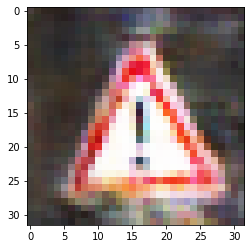

Working...!
변형 이미지 shape : (1, 3, 32, 32)


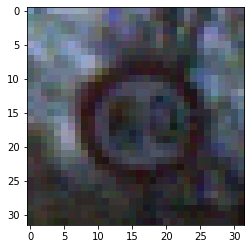

생성 이미지 shape : (1, 3, 32, 32)


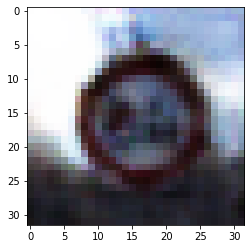

Working...!
변형 이미지 shape : (1, 3, 32, 32)


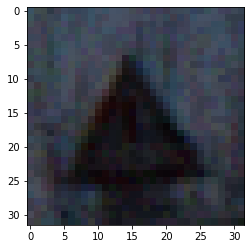

생성 이미지 shape : (1, 3, 32, 32)


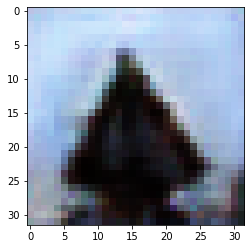

Working...!
변형 이미지 shape : (1, 3, 32, 32)


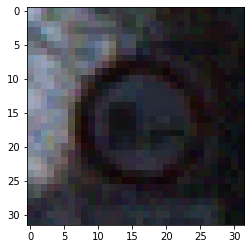

생성 이미지 shape : (1, 3, 32, 32)


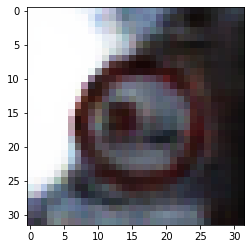

Working...!
변형 이미지 shape : (1, 3, 32, 32)


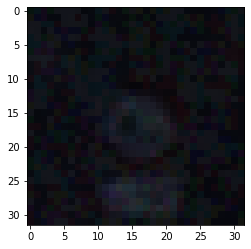

생성 이미지 shape : (1, 3, 32, 32)


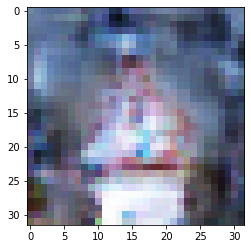

Working...!
변형 이미지 shape : (1, 3, 32, 32)


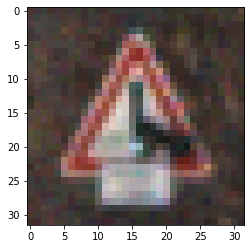

생성 이미지 shape : (1, 3, 32, 32)


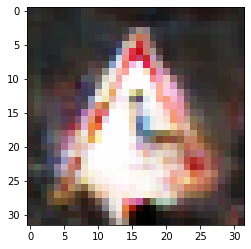

Working...!
변형 이미지 shape : (1, 3, 32, 32)


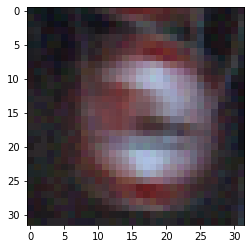

생성 이미지 shape : (1, 3, 32, 32)


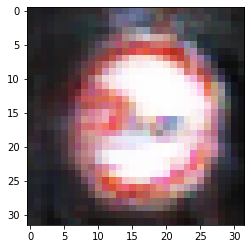

Working...!
변형 이미지 shape : (1, 3, 32, 32)


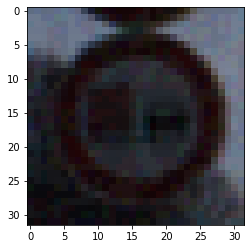

생성 이미지 shape : (1, 3, 32, 32)


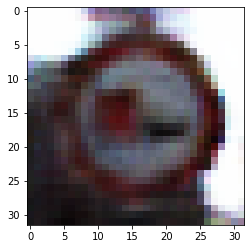

Working...!
변형 이미지 shape : (1, 3, 32, 32)


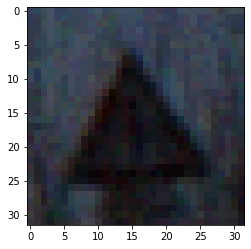

생성 이미지 shape : (1, 3, 32, 32)


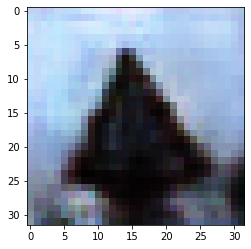

Working...!
변형 이미지 shape : (1, 3, 32, 32)


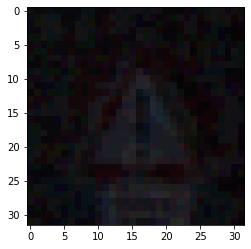

생성 이미지 shape : (1, 3, 32, 32)


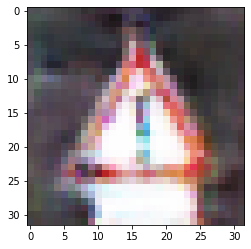

Working...!
변형 이미지 shape : (1, 3, 32, 32)


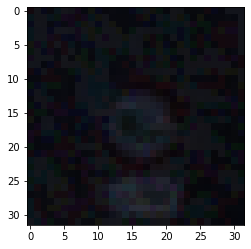

생성 이미지 shape : (1, 3, 32, 32)


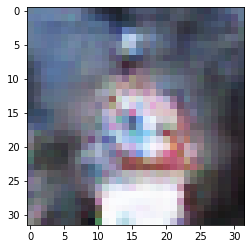

Working...!
변형 이미지 shape : (1, 3, 32, 32)


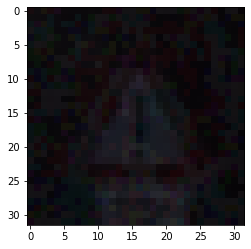

생성 이미지 shape : (1, 3, 32, 32)


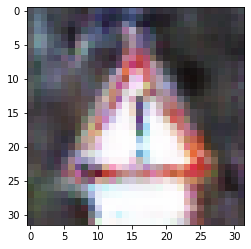

Working...!
변형 이미지 shape : (1, 3, 32, 32)


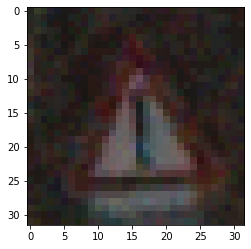

생성 이미지 shape : (1, 3, 32, 32)


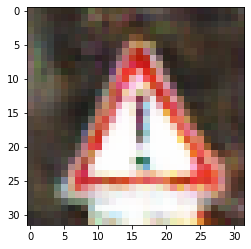

Working...!
변형 이미지 shape : (1, 3, 32, 32)


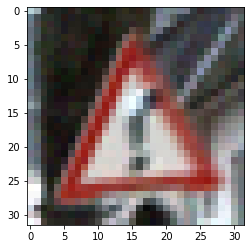

생성 이미지 shape : (1, 3, 32, 32)


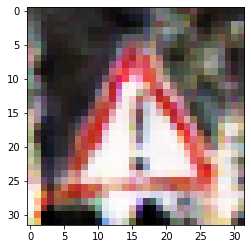

Working...!
변형 이미지 shape : (1, 3, 32, 32)


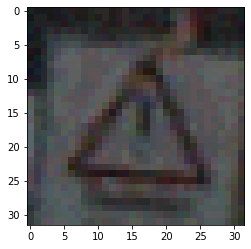

생성 이미지 shape : (1, 3, 32, 32)


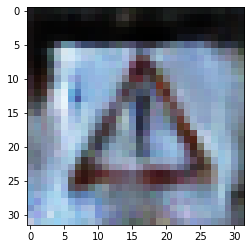

Working...!
변형 이미지 shape : (1, 3, 32, 32)


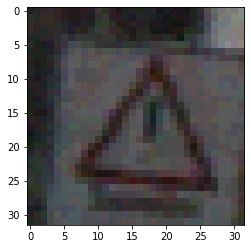

생성 이미지 shape : (1, 3, 32, 32)


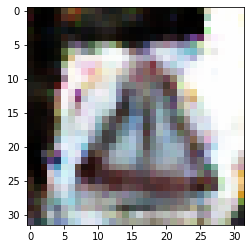

Working...!
변형 이미지 shape : (1, 3, 32, 32)


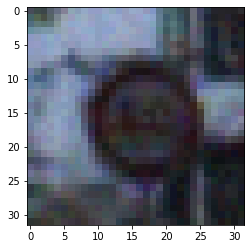

생성 이미지 shape : (1, 3, 32, 32)


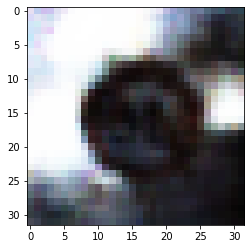

Working...!


변형 이미지 shape : (1, 3, 32, 32)


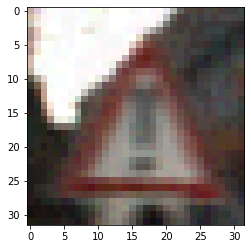

생성 이미지 shape : (1, 3, 32, 32)


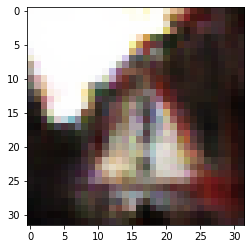

Working...!
변형 이미지 shape : (1, 3, 32, 32)


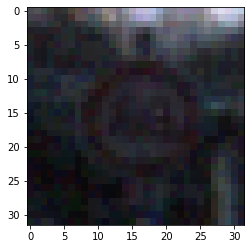

생성 이미지 shape : (1, 3, 32, 32)


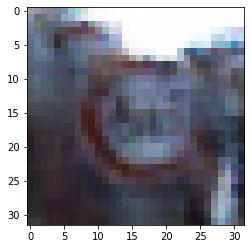

Working...!
변형 이미지 shape : (1, 3, 32, 32)


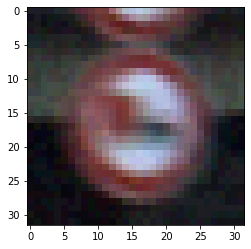

생성 이미지 shape : (1, 3, 32, 32)


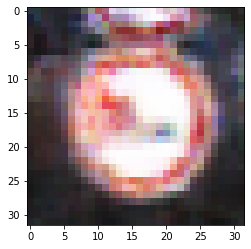

Working...!
변형 이미지 shape : (1, 3, 32, 32)


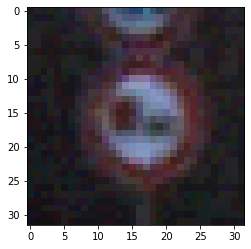

생성 이미지 shape : (1, 3, 32, 32)


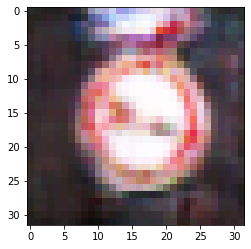

Working...!
변형 이미지 shape : (1, 3, 32, 32)


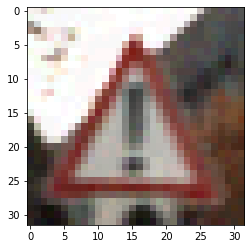

생성 이미지 shape : (1, 3, 32, 32)


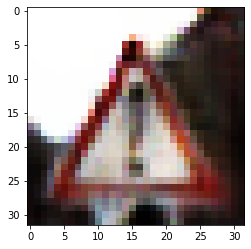

Working...!
변형 이미지 shape : (1, 3, 32, 32)


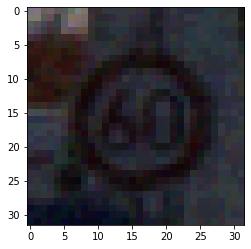

생성 이미지 shape : (1, 3, 32, 32)


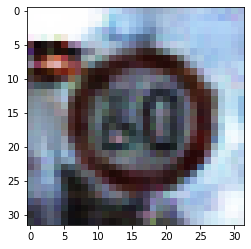

Working...!
변형 이미지 shape : (1, 3, 32, 32)


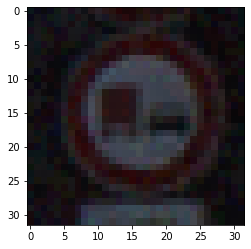

생성 이미지 shape : (1, 3, 32, 32)


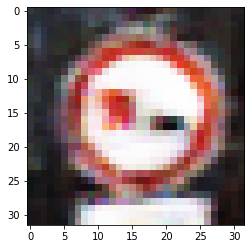

Working...!
변형 이미지 shape : (1, 3, 32, 32)


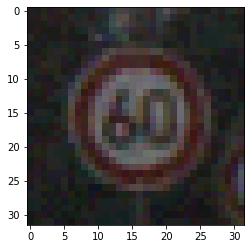

생성 이미지 shape : (1, 3, 32, 32)


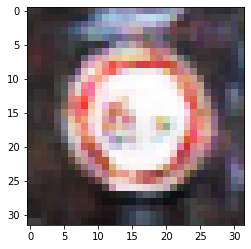

Working...!
변형 이미지 shape : (1, 3, 32, 32)


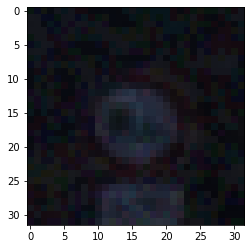

생성 이미지 shape : (1, 3, 32, 32)


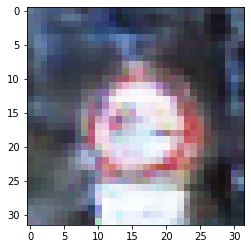

Working...!
변형 이미지 shape : (1, 3, 32, 32)


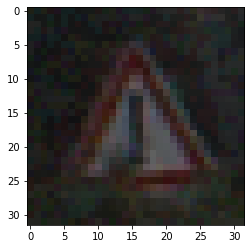

생성 이미지 shape : (1, 3, 32, 32)


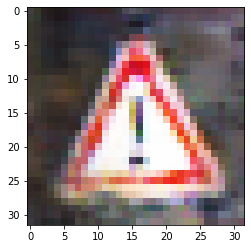

Working...!
변형 이미지 shape : (1, 3, 32, 32)


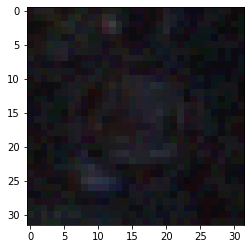

생성 이미지 shape : (1, 3, 32, 32)


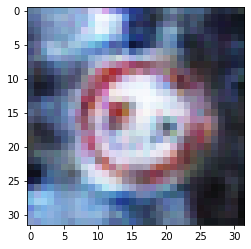

Working...!
변형 이미지 shape : (1, 3, 32, 32)


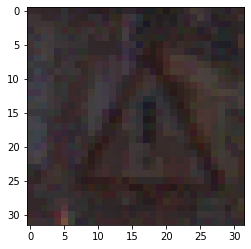

생성 이미지 shape : (1, 3, 32, 32)


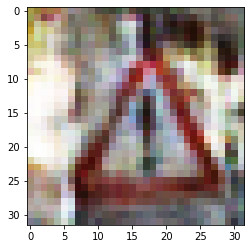

Working...!
변형 이미지 shape : (1, 3, 32, 32)


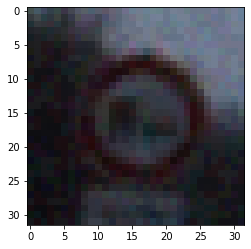

생성 이미지 shape : (1, 3, 32, 32)


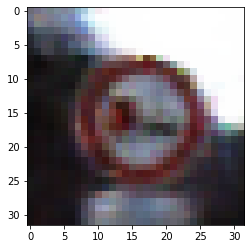

Working...!
변형 이미지 shape : (1, 3, 32, 32)


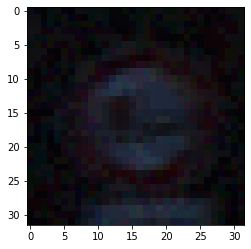

생성 이미지 shape : (1, 3, 32, 32)


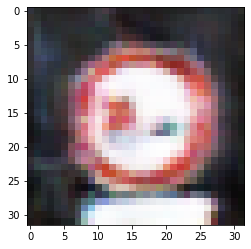

Working...!
변형 이미지 shape : (1, 3, 32, 32)


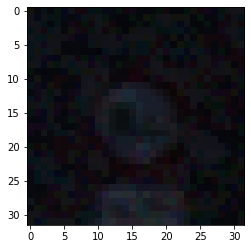

생성 이미지 shape : (1, 3, 32, 32)


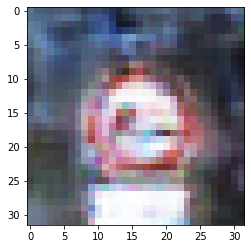

Working...!
변형 이미지 shape : (1, 3, 32, 32)


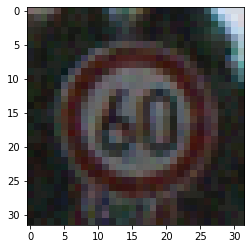

생성 이미지 shape : (1, 3, 32, 32)


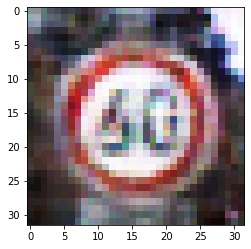

Working...!
변형 이미지 shape : (1, 3, 32, 32)


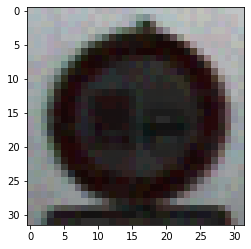

생성 이미지 shape : (1, 3, 32, 32)


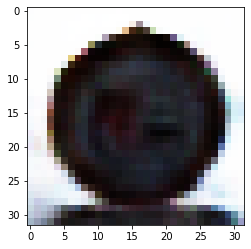

Working...!
변형 이미지 shape : (1, 3, 32, 32)


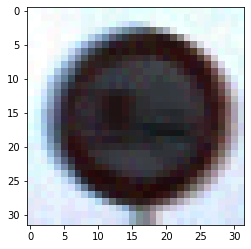

생성 이미지 shape : (1, 3, 32, 32)


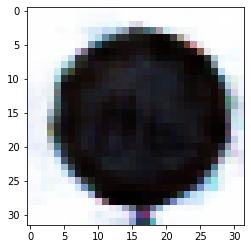

Working...!
변형 이미지 shape : (1, 3, 32, 32)


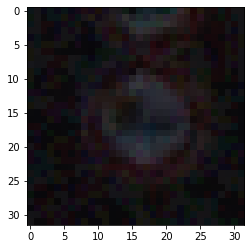

생성 이미지 shape : (1, 3, 32, 32)


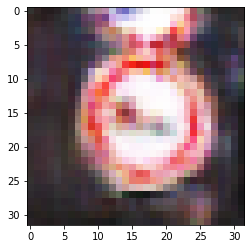

Working...!
변형 이미지 shape : (1, 3, 32, 32)


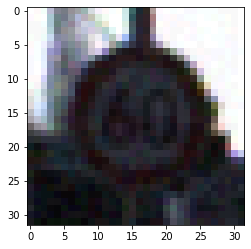

생성 이미지 shape : (1, 3, 32, 32)


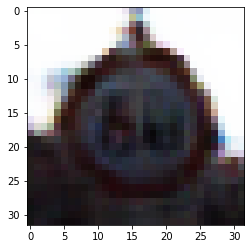

Working...!
변형 이미지 shape : (1, 3, 32, 32)


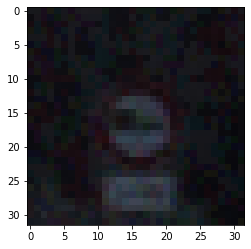

생성 이미지 shape : (1, 3, 32, 32)


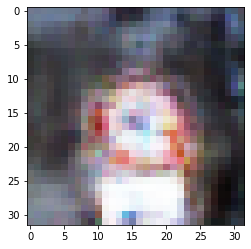

Working...!
변형 이미지 shape : (1, 3, 32, 32)


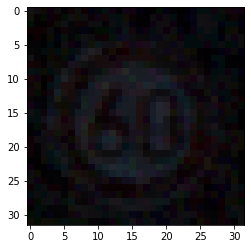

생성 이미지 shape : (1, 3, 32, 32)


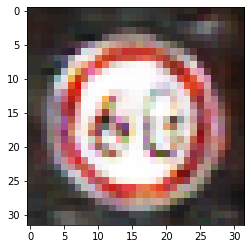

Working...!
변형 이미지 shape : (1, 3, 32, 32)


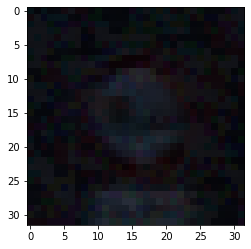

생성 이미지 shape : (1, 3, 32, 32)


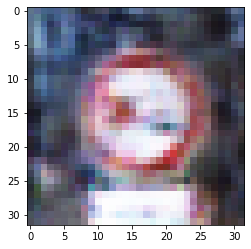

Working...!
변형 이미지 shape : (1, 3, 32, 32)


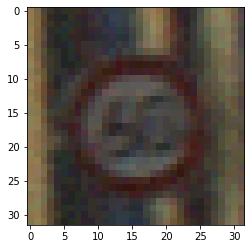

생성 이미지 shape : (1, 3, 32, 32)


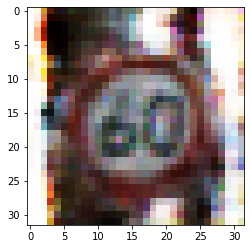

Working...!
변형 이미지 shape : (1, 3, 32, 32)


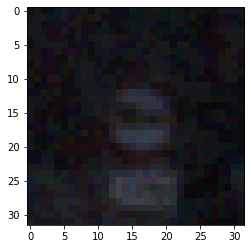

생성 이미지 shape : (1, 3, 32, 32)


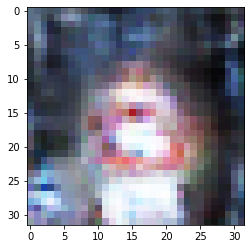

Working...!
변형 이미지 shape : (1, 3, 32, 32)


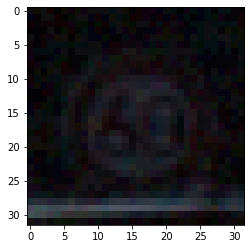

생성 이미지 shape : (1, 3, 32, 32)


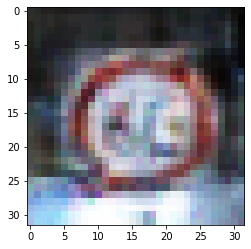

Working...!
변형 이미지 shape : (1, 3, 32, 32)


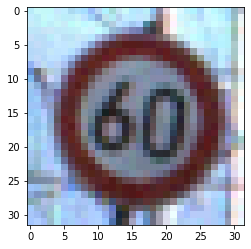

생성 이미지 shape : (1, 3, 32, 32)


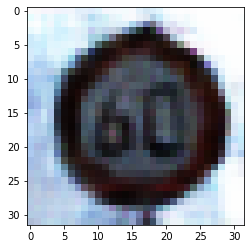

Working...!
변형 이미지 shape : (1, 3, 32, 32)


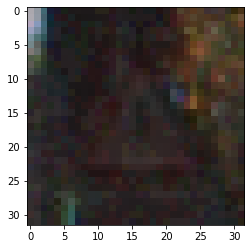

생성 이미지 shape : (1, 3, 32, 32)


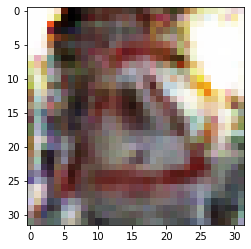

Working...!
변형 이미지 shape : (1, 3, 32, 32)


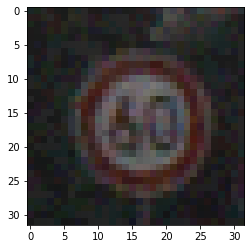

생성 이미지 shape : (1, 3, 32, 32)


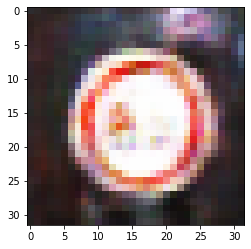

Working...!
변형 이미지 shape : (1, 3, 32, 32)


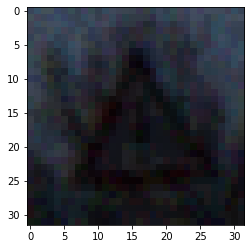

생성 이미지 shape : (1, 3, 32, 32)


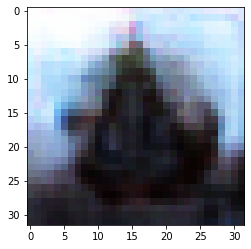

Working...!
변형 이미지 shape : (1, 3, 32, 32)


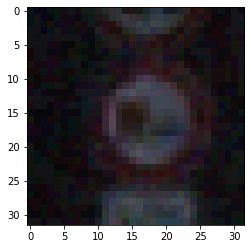

생성 이미지 shape : (1, 3, 32, 32)


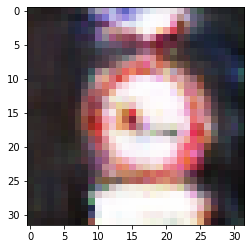

Working...!
변형 이미지 shape : (1, 3, 32, 32)


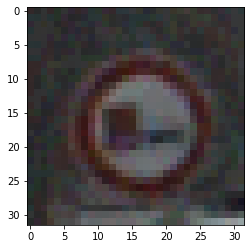

생성 이미지 shape : (1, 3, 32, 32)


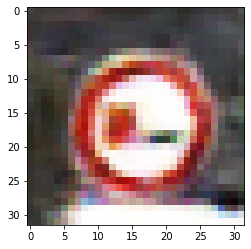

Working...!
변형 이미지 shape : (1, 3, 32, 32)


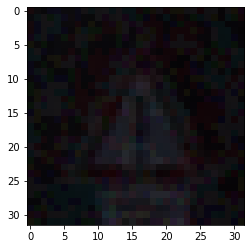

생성 이미지 shape : (1, 3, 32, 32)


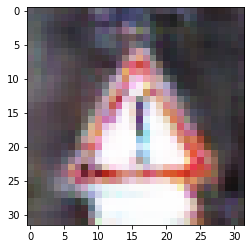

Working...!
변형 이미지 shape : (1, 3, 32, 32)


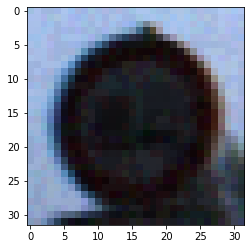

생성 이미지 shape : (1, 3, 32, 32)


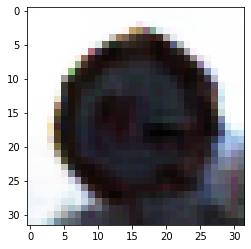

Working...!
변형 이미지 shape : (1, 3, 32, 32)


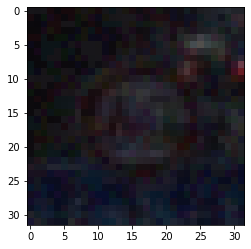

생성 이미지 shape : (1, 3, 32, 32)


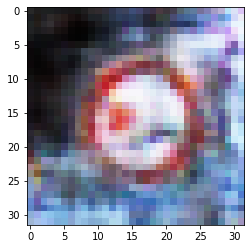

Working...!
변형 이미지 shape : (1, 3, 32, 32)


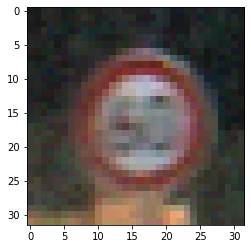

생성 이미지 shape : (1, 3, 32, 32)


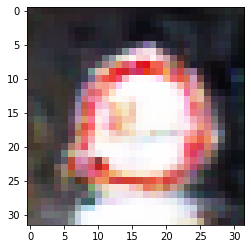

Working...!
변형 이미지 shape : (1, 3, 32, 32)


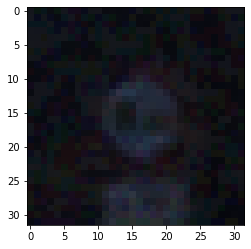

생성 이미지 shape : (1, 3, 32, 32)


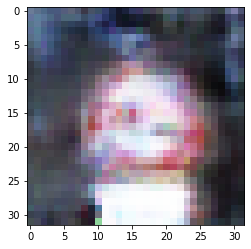

Working...!
변형 이미지 shape : (1, 3, 32, 32)


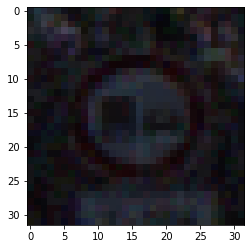

생성 이미지 shape : (1, 3, 32, 32)


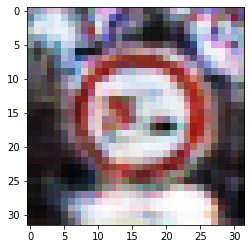

Working...!
변형 이미지 shape : (1, 3, 32, 32)


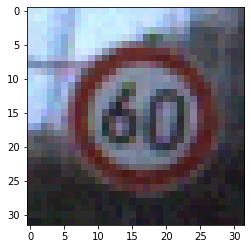

생성 이미지 shape : (1, 3, 32, 32)


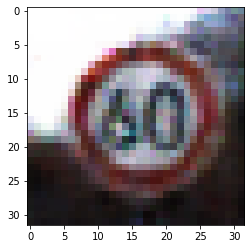

Working...!
변형 이미지 shape : (1, 3, 32, 32)


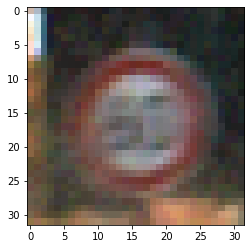

생성 이미지 shape : (1, 3, 32, 32)


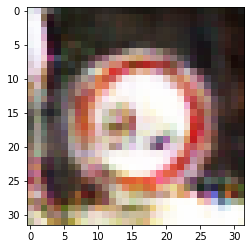

Working...!
변형 이미지 shape : (1, 3, 32, 32)


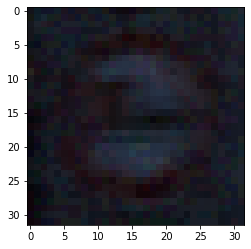

생성 이미지 shape : (1, 3, 32, 32)


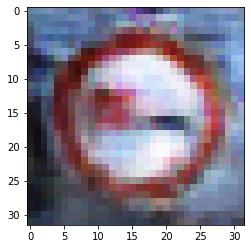

Working...!
변형 이미지 shape : (1, 3, 32, 32)


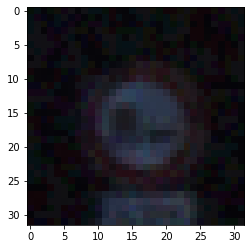

생성 이미지 shape : (1, 3, 32, 32)


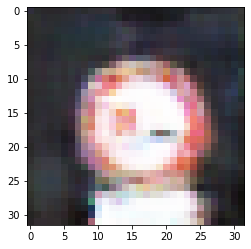

Working...!
변형 이미지 shape : (1, 3, 32, 32)


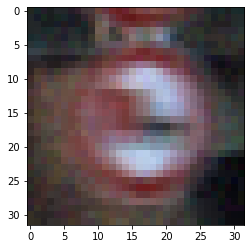

생성 이미지 shape : (1, 3, 32, 32)


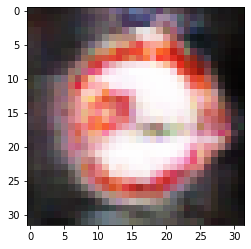

Working...!
변형 이미지 shape : (1, 3, 32, 32)


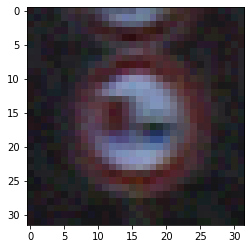

생성 이미지 shape : (1, 3, 32, 32)


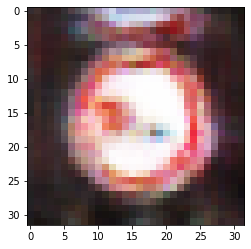

Working...!
변형 이미지 shape : (1, 3, 32, 32)


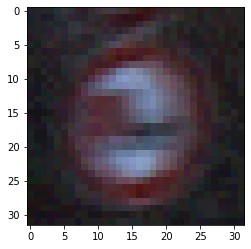

생성 이미지 shape : (1, 3, 32, 32)


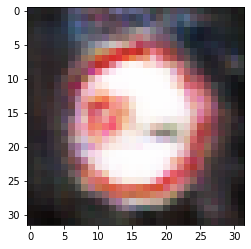

Working...!
변형 이미지 shape : (1, 3, 32, 32)


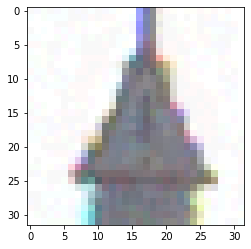

생성 이미지 shape : (1, 3, 32, 32)


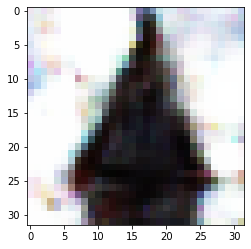

Working...!
변형 이미지 shape : (1, 3, 32, 32)


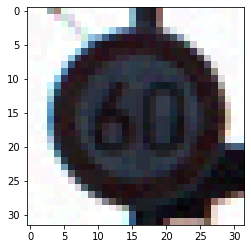

생성 이미지 shape : (1, 3, 32, 32)


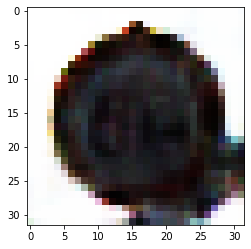

Working...!
변형 이미지 shape : (1, 3, 32, 32)


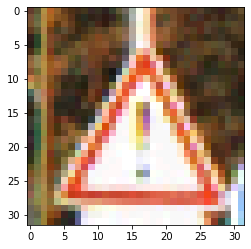

생성 이미지 shape : (1, 3, 32, 32)


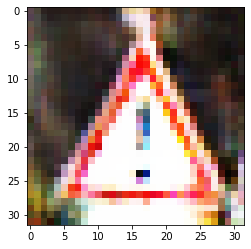

Working...!
변형 이미지 shape : (1, 3, 32, 32)


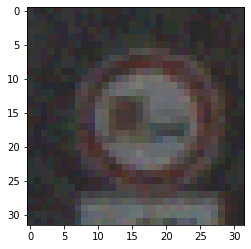

생성 이미지 shape : (1, 3, 32, 32)


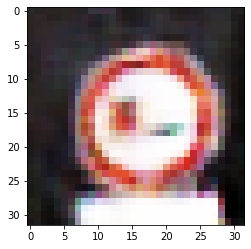

Working...!
변형 이미지 shape : (1, 3, 32, 32)


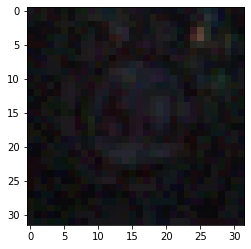

생성 이미지 shape : (1, 3, 32, 32)


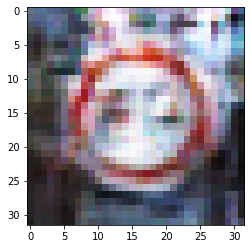

Working...!
변형 이미지 shape : (1, 3, 32, 32)


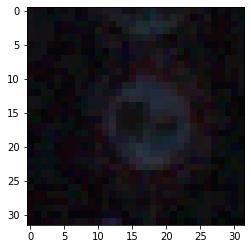

생성 이미지 shape : (1, 3, 32, 32)


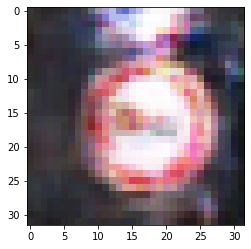

Working...!
변형 이미지 shape : (1, 3, 32, 32)


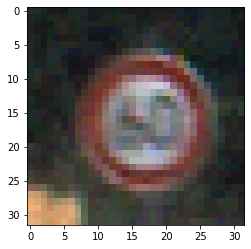

생성 이미지 shape : (1, 3, 32, 32)


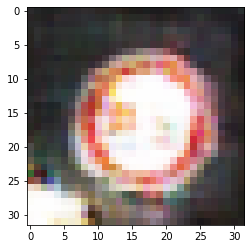

Working...!
변형 이미지 shape : (1, 3, 32, 32)


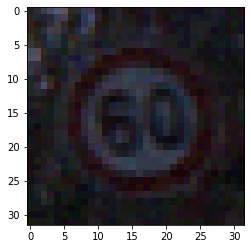

생성 이미지 shape : (1, 3, 32, 32)


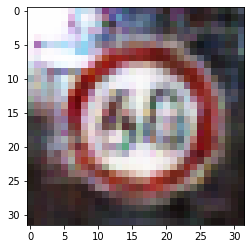

Working...!
변형 이미지 shape : (1, 3, 32, 32)


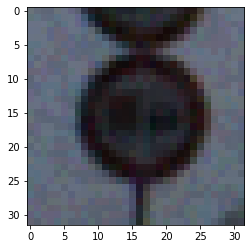

생성 이미지 shape : (1, 3, 32, 32)


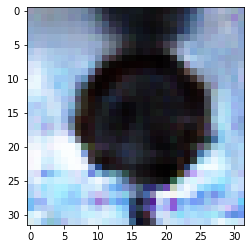

Working...!
변형 이미지 shape : (1, 3, 32, 32)


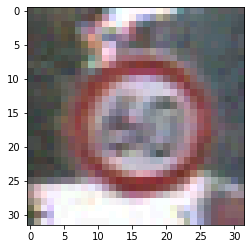

생성 이미지 shape : (1, 3, 32, 32)


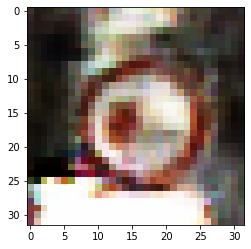

Working...!
변형 이미지 shape : (1, 3, 32, 32)


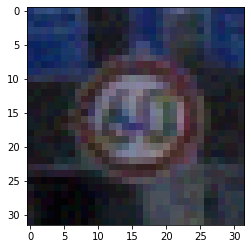

생성 이미지 shape : (1, 3, 32, 32)


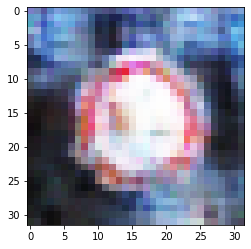

Working...!
변형 이미지 shape : (1, 3, 32, 32)


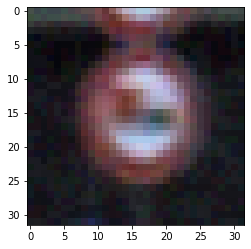

생성 이미지 shape : (1, 3, 32, 32)


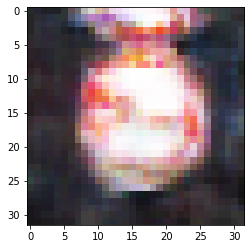

Working...!
Epsilon: 0.02	Test Accuracy = 42 / 100 = 0.42
Epsilon: 0.02	Defense Accuracy = 42 / 100 = 0.42


In [ ]:
accuracies = []
examples = []
accuracies_df = []
examples_df = []

eps = 0.02

acc, ex, acc_df, ex_df = test(trainer, x_test[:100], t_test[:100], eps)
accuracies.append(acc)
examples.append(ex)
accuracies_df.append(acc_df)
examples_df.append(ex_df)

pca를 분류기 앞에 위치시키는 것은 defense gan의 성능을 오히려 저하시킨다

+ 잠재공간 추출 시에 사용하는 것도 마찬가지

## Conditional GAN 
: 기존에는 G(z)와 X의 MSE를 구해 Generator에 전달해주는 방식으로 진행했다
-> G(z)와 x의 mse를 구하는 것이 아닌 at_img의 주성분을 z로 만들어 generator에 전달해주는 방식으로 모델을 구현하겠다. 
-> 이는 모델의 성능 향상보다는 모델 무게를 줄이는 방향의 성능 개선이 있을 것으로 예상된다.

In [ ]:
import tensorflow as tf
from sklearn.decomposition import PCA

In [ ]:
# data shape이 3,32,32이어야한다.
def defense_PCA(data,component):
    #r,g,b를 각각 나눠준다
    data = data.reshape(3,32,32)
    r = data[0] / 255
    g = data[1] / 255
    b = data[2] / 255

    pca_r = PCA(n_components=component)
    pca_r_trans = pca_r.fit_transform(r)

    pca_g = PCA(n_components=component)
    pca_g_trans = pca_g.fit_transform(g)

    pca_b = PCA(n_components=component)
    pca_b_trans = pca_b.fit_transform(b)

    pca_r_org = pca_r.inverse_transform(pca_r_trans)
    pca_g_org = pca_g.inverse_transform(pca_g_trans)
    pca_b_org = pca_b.inverse_transform(pca_b_trans)

    img_compressed = np.stack((pca_r_org, pca_g_org, pca_b_org),axis = 0)

    return img_compressed.reshape((-1,3,32,32))

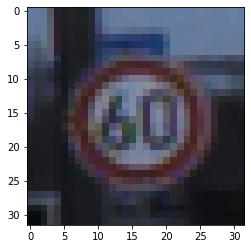

In [ ]:
plt.imshow(x_test[3].transpose(1,2,0))

In [ ]:
img = x_test[3].transpose(1,2,0).reshape(32,32,3)
img_st = (img - np.mean(img)) / np.std(img) 

r = img_st[:,:,0]
g = img_st[:,:,0]
b = img_st[:,:,0]
    
print(r.shape)
pca_r = PCA(n_components=10)
pca_r_trans = pca_r.fit_transform(r)

print(pca_r_trans.shape)

pca_g = PCA(n_components= 10)
pca_g_trans = pca_g.fit_transform(g)

pca_b = PCA(n_components=10)
pca_b_trans = pca_b.fit_transform(b)


pca_r_org = pca_r.inverse_transform(pca_r_trans)
pca_g_org = pca_g.inverse_transform(pca_g_trans)
pca_b_org = pca_b.inverse_transform(pca_b_trans)

img_compressed = np.stack((pca_r_org, pca_g_org, pca_b_org),axis = 2)

(32, 32)
(32, 10)


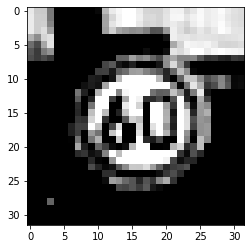

In [ ]:
plt.imshow(img_compressed)

In [ ]:
img_compressed.shape

(32, 32, 3)

In [ ]:
img = x_test[3].transpose(1,2,0).reshape(32,32,3)
img_st = (img - np.mean(img)) / np.std(img) 

r = img_st[:,:,0]
g = img_st[:,:,0]
b = img_st[:,:,0]
    
pca_r_1 = PCA(n_components=10)
pca_r_trans_1 = pca_r_1.fit_transform(r)

r_transpose = pca_r_trans.transpose(1,0)
pca_r_2 = PCA(n_components=10)
pca_r_trans_2 = pca_r_2.fit_transform(r_transpose)

In [ ]:
pca_r_trans_2.shape

(10, 10)

In [ ]:
z_test = pca_r_trans_2.reshape(1,100)
z_test

array([[ 1.43024179e+01,  1.75678817e+00,  1.68200369e-01,
         2.72465215e-02,  1.31749550e-02,  7.64474792e-03,
         7.70563961e-03, -9.31166690e-04, -2.58507800e-03,
         4.81274378e-16, -3.85317232e+00,  1.08438757e+01,
         3.07376697e-01,  4.53089792e-02,  2.15450968e-02,
         1.24003382e-02,  1.24265332e-02, -1.49513325e-03,
        -4.13873833e-03,  4.81274378e-16, -1.56727995e+00,
        -2.19373644e+00,  6.23571490e+00,  1.90120365e-01,
         7.97813138e-02,  4.34706679e-02,  4.19703047e-02,
        -4.91625714e-03, -1.33741947e-02,  4.81274378e-16,
        -1.33243184e+00, -1.61636267e+00, -1.31828836e+00,
         3.76935874e+00,  4.05110108e-01,  1.70085227e-01,
         1.42926857e-01, -1.53546430e-02, -3.96827273e-02,
         4.81274378e-16, -1.29170874e+00, -1.53155393e+00,
        -1.05053391e+00, -1.27303000e+00,  2.85168733e+00,
         4.39276546e-01,  2.89378573e-01, -2.77519812e-02,
        -6.77030265e-02,  4.81274378e-16, -1.27207447e+0

In [ ]:
noise = np.random.normal(0,1,(1,100))

generated_images = 0.5 * generator_dc.predict(noise)+ 0.5

In [ ]:
generated_images = 0.5 * generator_dc.predict(z_test)+ 0.5

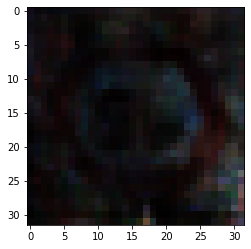

In [ ]:
plt.imshow(generated_images.reshape(32,32,3))

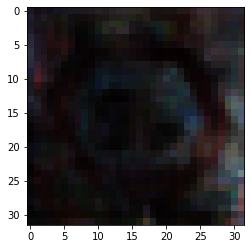

In [ ]:
plt.imshow(generated_images.reshape(32,32,3))

In [ ]:
r_transpose = pca_r_trans.transpose(1,0)
pca_r = PCA(n_components=10)
pca_r_trans_2 = pca_r.fit_transform(r_transpose)


pca_r_org = pca_r.inverse_transform(pca_r_trans_2)

(10, 32)
(10, 10)


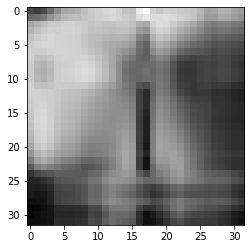

In [ ]:
plt.imshow(pca_r_org,cmap='gray')

In [ ]:
img_compressed.shape

(32, 32, 3)

In [ ]:
img = x_test[0].transpose(1,2,0).reshape(32,32,3)
img_st = (img - np.mean(img)) / np.std(img) 

r = img_st[:,:,0]
g = img_st[:,:,0]
b = img_st[:,:,0]
    
pca_r_1 = PCA(n_components=10)
pca_r_trans_1 = pca_r_1.fit_transform(r)

r_transpose = pca_r_trans.transpose(1,0)
pca_r_2 = PCA(n_components=10)
pca_r_trans_2 = pca_r_2.fit_transform(r_transpose)

In [ ]:
def DefenseGAN_with_PCA(img_at):
    img = img_at.reshape(32,32,3)
    img_st = (img - np.mean(img)) / np.std(img) 

    r = img_st[:,:,0]
    g = img_st[:,:,0]
    b = img_st[:,:,0]
    
    pca_r_1 = PCA(n_components=5)
    pca_r_trans_1 = pca_r_1.fit_transform(r)

    r_transpose = pca_r_trans_1.transpose(1,0)
    pca_r_2 = PCA(n_components=5)
    pca_r_trans_2 = pca_r_2.fit_transform(r_transpose)
    
    z_min = pca_r_trans_2.reshape(1,25) #pca로 생성된 10x10 이미지이다

    generated_images = 0.5 * generator_dc.predict(z_min)+ 0.5

    generated_images = generated_images.reshape(32,32,3)

    generated_images_tp = generated_images.transpose(2,0,1)

    return generated_images_tp

In [ ]:
epsilons = [0, .02, .04,.06,.08,.1]

# FGSM 공격 코드
def fgsm_attack(image, epsilon, data_grad):
    # data_grad 의 요소별 부호 값을 얻어옵니다
    sign_data_grad = np.sign(data_grad) * 255
    perturbed_image = image + epsilon*sign_data_grad
    # 값 범위를 [0,1]로 유지하기 위해 자르기(clipping)를 추가합니다
    #perturbed_image = np.clip(perturbed_image, 0, 1), 이 경우에는 정규화를 진행하지 않았기 때문에 clipping x
    # 작은 변화가 적용된 이미지를 리턴합니다
    return perturbed_image

In [ ]:
## predict_output에 한개씩 넣는 것부터 구현해야한다. (전체가 들어가는 것만 정상 작동함)

def test(model, test_x, test_y, epsilon):

    # 정확도 카운터
    correct = 0
    adv_examples = []
    defense_correct = 0
    df_examples = []
    # 테스트 셋의 모든 예제에 대해 루프를 돕니다
    
    for i in range(len(test_x)):
        data = test_x[i].reshape(-1,3,32,32)
        target = test_y[i].reshape(1)
        
        result = model.predict(data)
        init_output = int(result)
 
        if init_output != target:
            continue


        data_grad = model.network.gradient_ad(data,target)
        
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        print('변형 이미지 shape :',perturbed_data.shape)
        perturbed_data_plot = perturbed_data.reshape(3,32,32)
        plt.imshow(perturbed_data_plot.transpose(1,2,0) / 255)
        plt.show();

        output = model.predict(perturbed_data)

        final_pred = int(output)

        

        if final_pred == int(target):
            correct += 1
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))
        else:
            if len(adv_examples) < 5:
                adv_ex = perturbed_data
                adv_examples.append((init_output,final_pred,perturbed_data))


        generated_img = DefenseGAN_with_PCA(perturbed_data.reshape(3,32,32).transpose(1,2,0)).reshape(-1,3,32,32)

        print('생성 이미지 shape :',generated_img.shape)

        generated_img_plot = generated_img.reshape(3,32,32)
        plt.imshow(generated_img_plot.transpose(1,2,0))
        plt.show();

        defense_output = model.predict(generated_img)

        defense_pred = int(defense_output)

        if defense_pred == int(target):
            defense_correct += 1
            if (epsilon == 0) and (len(df_examples) < 5):
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))
        else:
            if len(df_examples) < 5:
                df_ex = generated_img
                df_examples.append((init_output,defense_pred,generated_img))

        print('원래 예측값 : ', target)
        print('공격 받은 예측 값 :', final_pred)
        print('방어 모델 예측 값 :', defense_pred)

        print('Working...!')



    # 해당 엡실론에서의 최종 정확도를 계산합니다
    final_acc = correct/float(len(test_x))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_x), final_acc))

    defense_acc = defense_correct / float(len(test_x))
    print("Epsilon: {}\tDefense Accuracy = {} / {} = {}".format(epsilon, defense_correct, len(test_x), defense_acc))
    # 정확도와 적대적 예제를 리턴합니다
    return final_acc, adv_examples, defense_acc, df_examples

변형 이미지 shape : (1, 3, 32, 32)


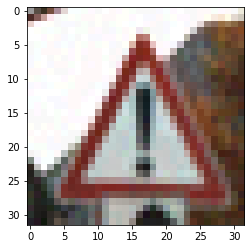

생성 이미지 shape : (1, 3, 32, 32)


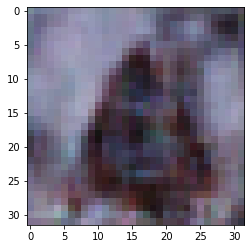

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


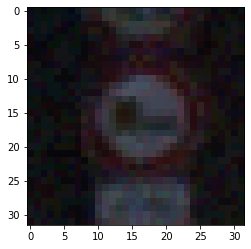

생성 이미지 shape : (1, 3, 32, 32)


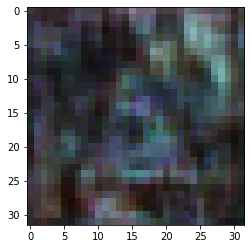

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


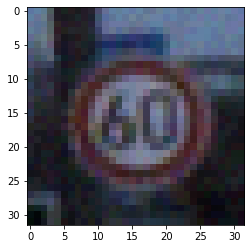

생성 이미지 shape : (1, 3, 32, 32)


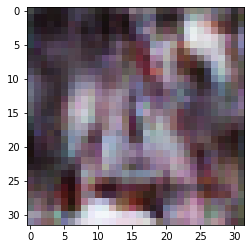

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


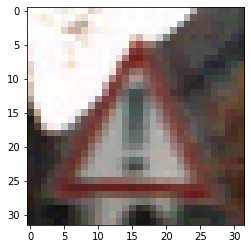

생성 이미지 shape : (1, 3, 32, 32)


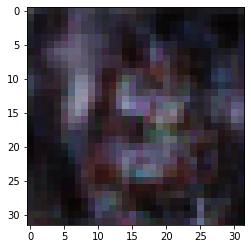

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


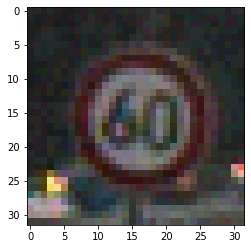

생성 이미지 shape : (1, 3, 32, 32)


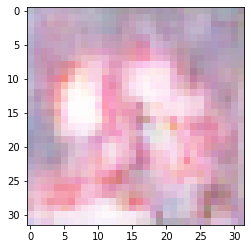

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


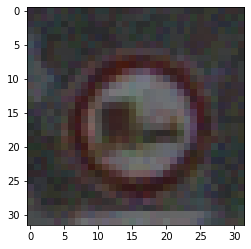

생성 이미지 shape : (1, 3, 32, 32)


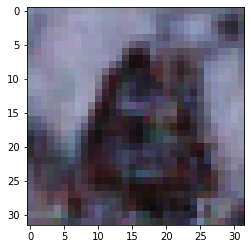

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


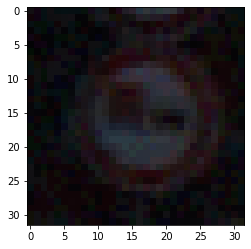

생성 이미지 shape : (1, 3, 32, 32)


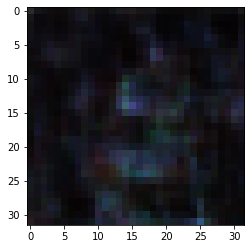

원래 예측값 :  [1]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


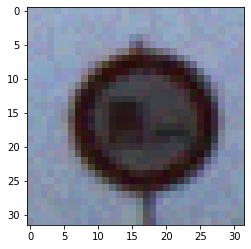

생성 이미지 shape : (1, 3, 32, 32)


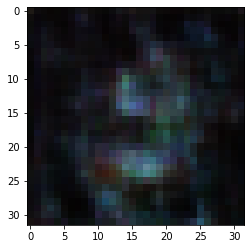

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


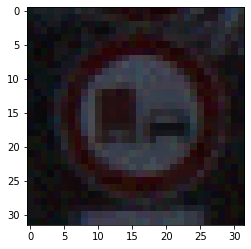

생성 이미지 shape : (1, 3, 32, 32)


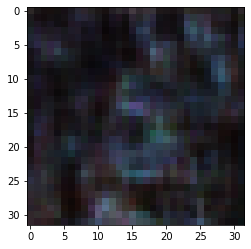

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


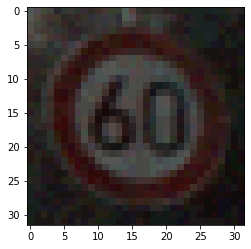

생성 이미지 shape : (1, 3, 32, 32)


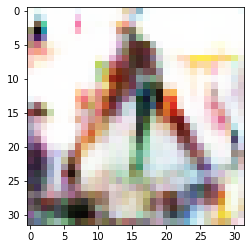

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


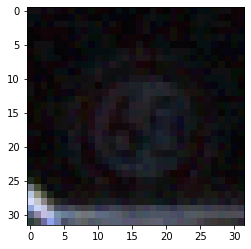

생성 이미지 shape : (1, 3, 32, 32)


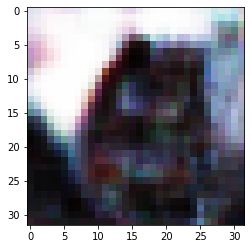

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 0
Working...!
변형 이미지 shape : (1, 3, 32, 32)


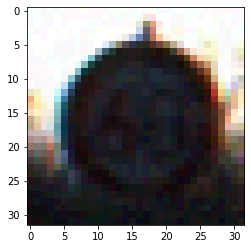

생성 이미지 shape : (1, 3, 32, 32)


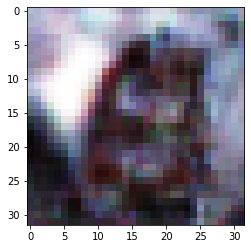

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


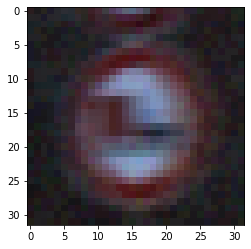

생성 이미지 shape : (1, 3, 32, 32)


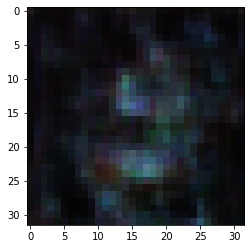

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


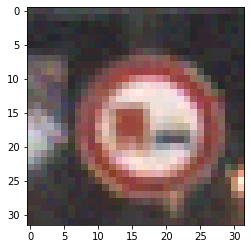

생성 이미지 shape : (1, 3, 32, 32)


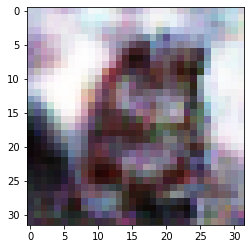

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


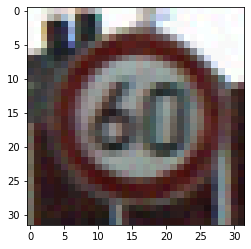

생성 이미지 shape : (1, 3, 32, 32)


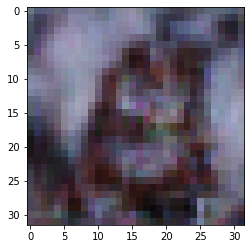

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


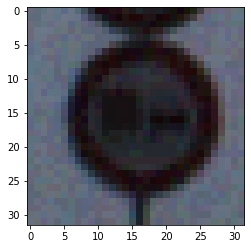

생성 이미지 shape : (1, 3, 32, 32)


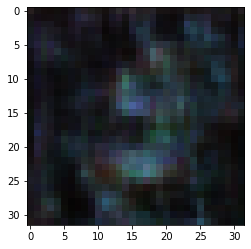

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


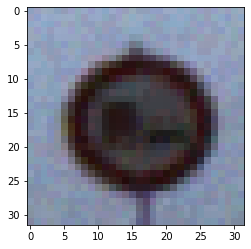

생성 이미지 shape : (1, 3, 32, 32)


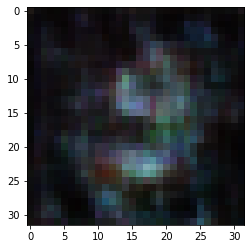

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


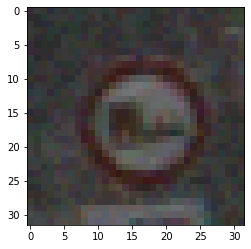

생성 이미지 shape : (1, 3, 32, 32)


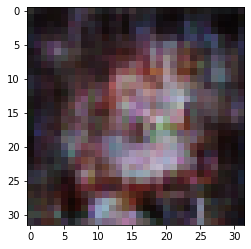

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


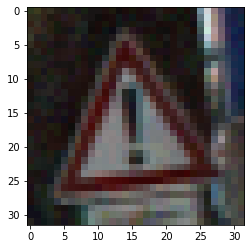

생성 이미지 shape : (1, 3, 32, 32)


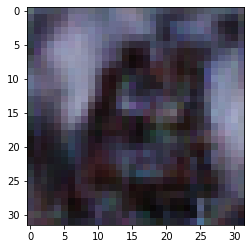

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


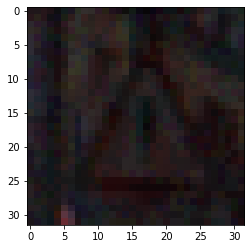

생성 이미지 shape : (1, 3, 32, 32)


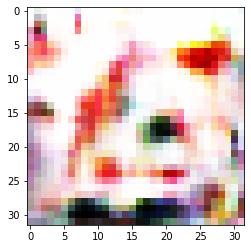

원래 예측값 :  [2]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


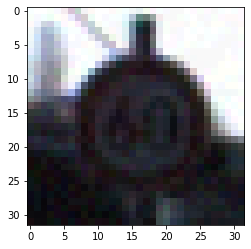

생성 이미지 shape : (1, 3, 32, 32)


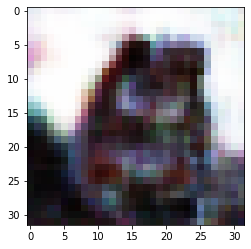

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 0
Working...!
변형 이미지 shape : (1, 3, 32, 32)


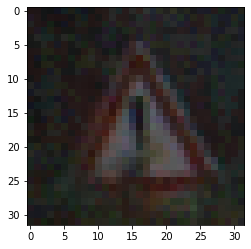

생성 이미지 shape : (1, 3, 32, 32)


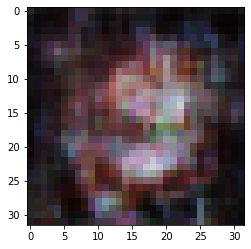

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


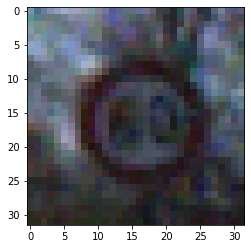

생성 이미지 shape : (1, 3, 32, 32)


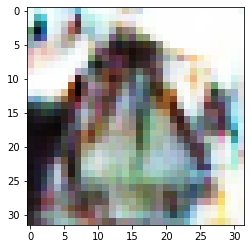

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


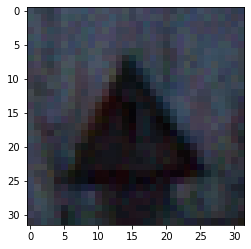

생성 이미지 shape : (1, 3, 32, 32)


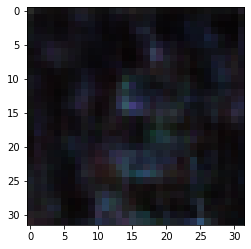

원래 예측값 :  [2]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


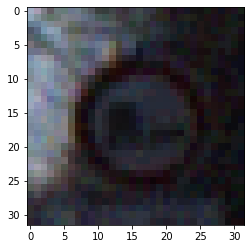

생성 이미지 shape : (1, 3, 32, 32)


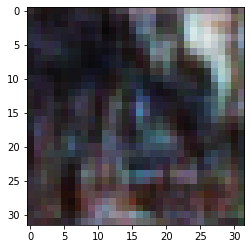

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


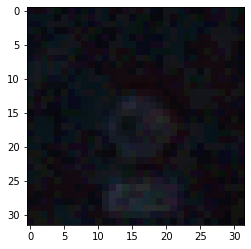

생성 이미지 shape : (1, 3, 32, 32)


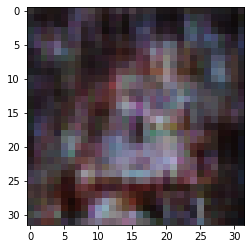

원래 예측값 :  [1]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


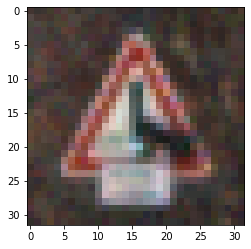

생성 이미지 shape : (1, 3, 32, 32)


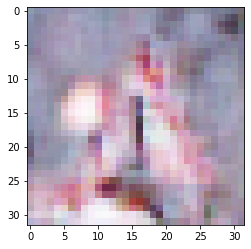

원래 예측값 :  [2]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


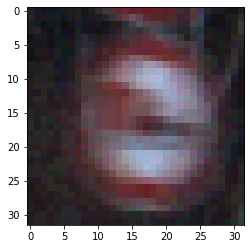

생성 이미지 shape : (1, 3, 32, 32)


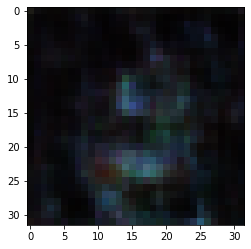

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


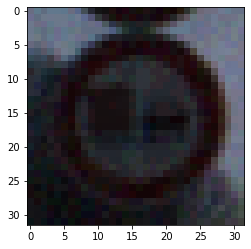

생성 이미지 shape : (1, 3, 32, 32)


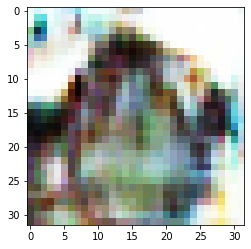

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 0
Working...!
변형 이미지 shape : (1, 3, 32, 32)


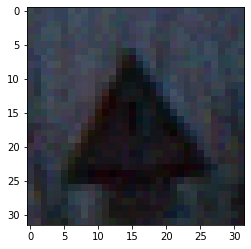

생성 이미지 shape : (1, 3, 32, 32)


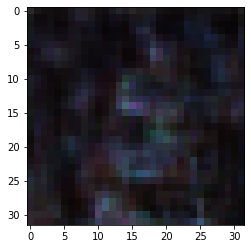

원래 예측값 :  [2]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


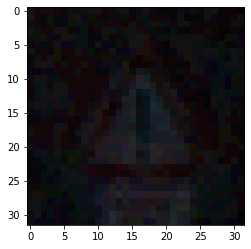

생성 이미지 shape : (1, 3, 32, 32)


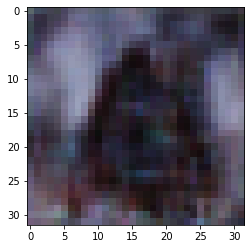

원래 예측값 :  [2]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


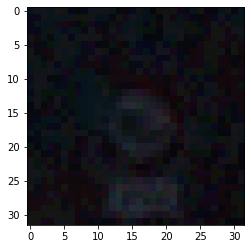

생성 이미지 shape : (1, 3, 32, 32)


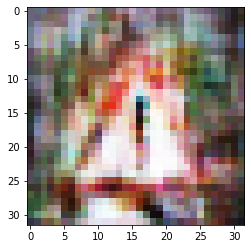

원래 예측값 :  [1]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


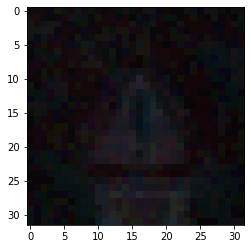

생성 이미지 shape : (1, 3, 32, 32)


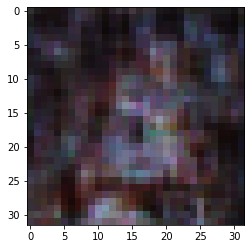

원래 예측값 :  [2]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


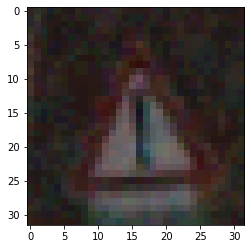

생성 이미지 shape : (1, 3, 32, 32)


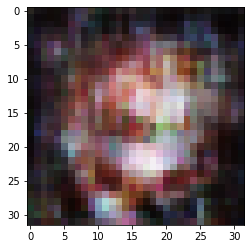

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


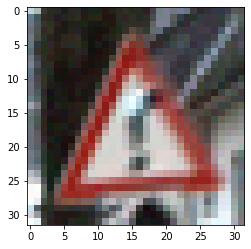

생성 이미지 shape : (1, 3, 32, 32)


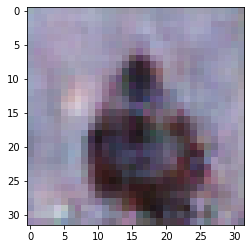

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


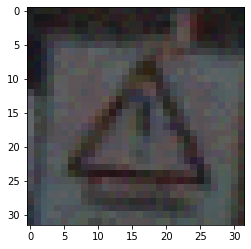

생성 이미지 shape : (1, 3, 32, 32)


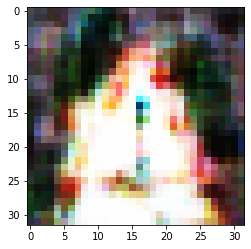

원래 예측값 :  [2]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


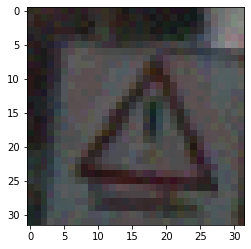

생성 이미지 shape : (1, 3, 32, 32)


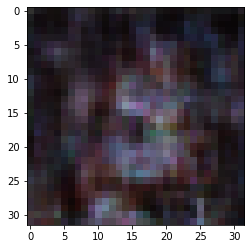

원래 예측값 :  [2]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


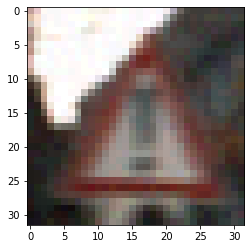

생성 이미지 shape : (1, 3, 32, 32)


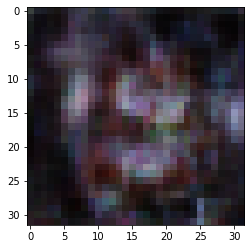

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


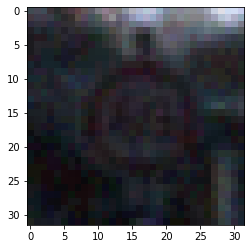

생성 이미지 shape : (1, 3, 32, 32)


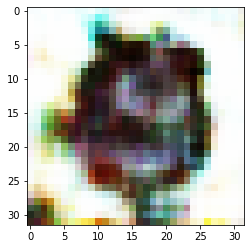

원래 예측값 :  [0]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


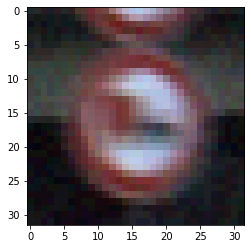

생성 이미지 shape : (1, 3, 32, 32)


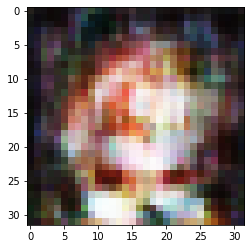

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


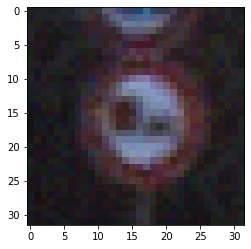

생성 이미지 shape : (1, 3, 32, 32)


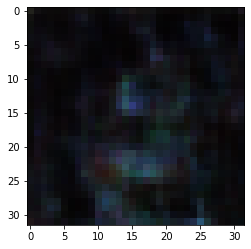

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


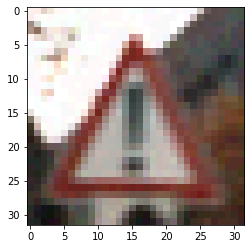

생성 이미지 shape : (1, 3, 32, 32)


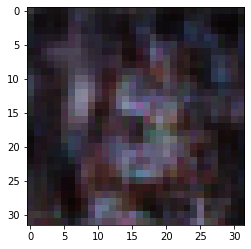

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


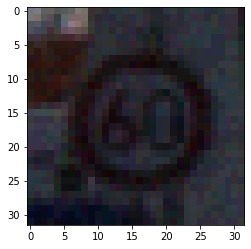

생성 이미지 shape : (1, 3, 32, 32)


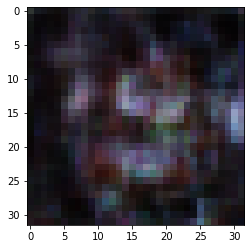

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


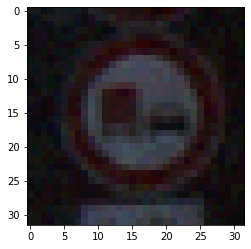

생성 이미지 shape : (1, 3, 32, 32)


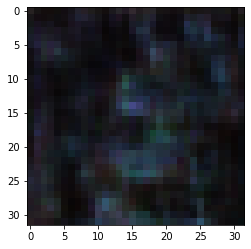

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


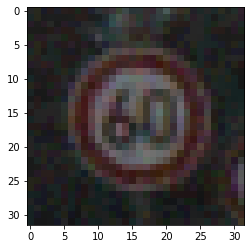

생성 이미지 shape : (1, 3, 32, 32)


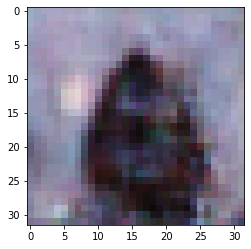

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


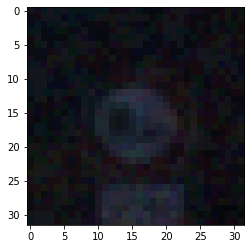

생성 이미지 shape : (1, 3, 32, 32)


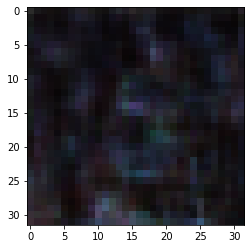

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


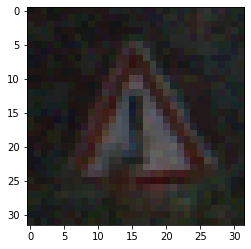

생성 이미지 shape : (1, 3, 32, 32)


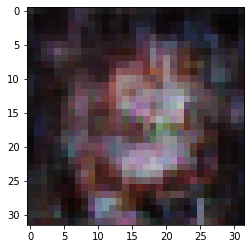

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


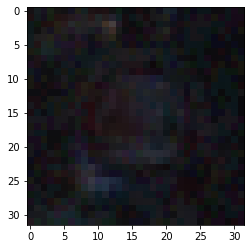

생성 이미지 shape : (1, 3, 32, 32)


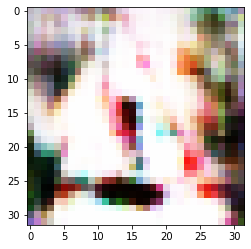

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


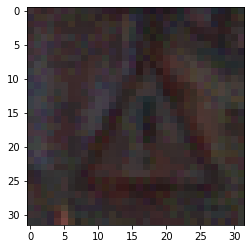

생성 이미지 shape : (1, 3, 32, 32)


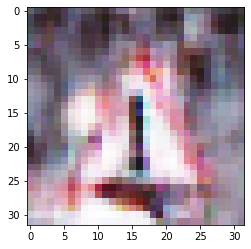

원래 예측값 :  [2]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


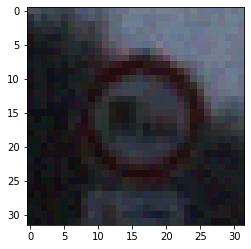

생성 이미지 shape : (1, 3, 32, 32)


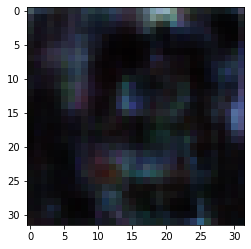

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


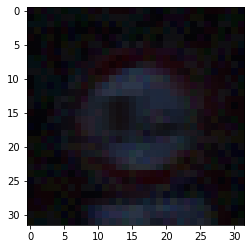

생성 이미지 shape : (1, 3, 32, 32)


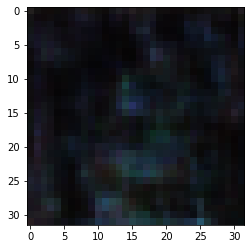

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


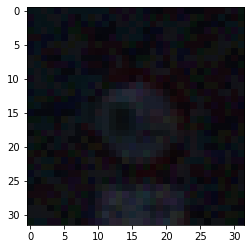

생성 이미지 shape : (1, 3, 32, 32)


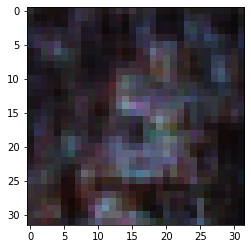

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


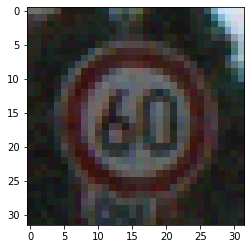

생성 이미지 shape : (1, 3, 32, 32)


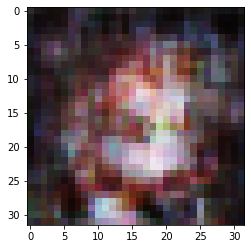

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


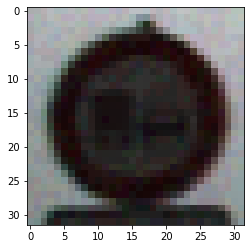

생성 이미지 shape : (1, 3, 32, 32)


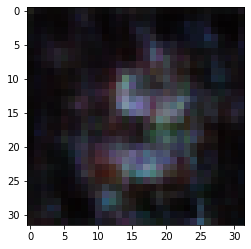

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


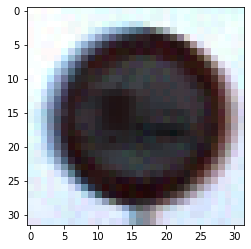

생성 이미지 shape : (1, 3, 32, 32)


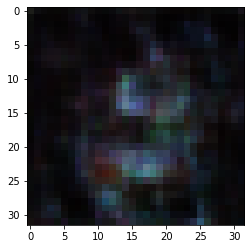

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


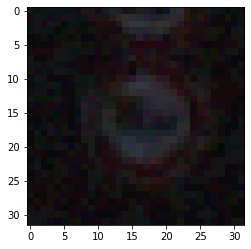

생성 이미지 shape : (1, 3, 32, 32)


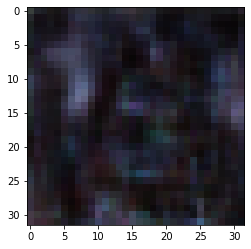

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


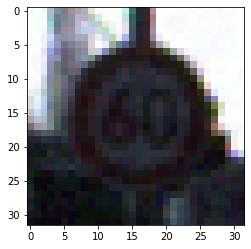

생성 이미지 shape : (1, 3, 32, 32)


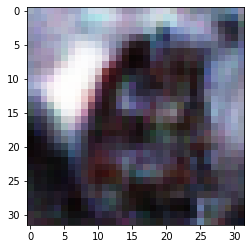

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 0
Working...!
변형 이미지 shape : (1, 3, 32, 32)


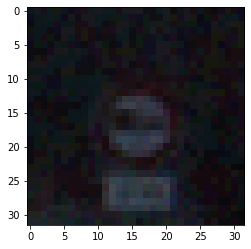

생성 이미지 shape : (1, 3, 32, 32)


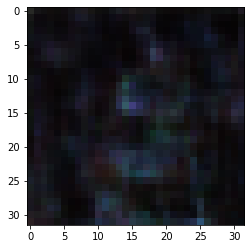

원래 예측값 :  [1]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


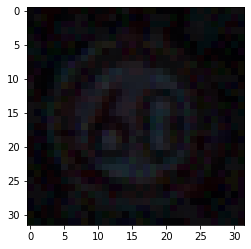

생성 이미지 shape : (1, 3, 32, 32)


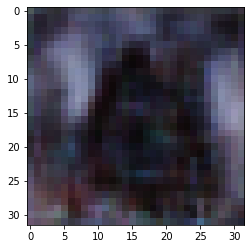

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


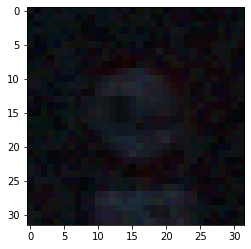

생성 이미지 shape : (1, 3, 32, 32)


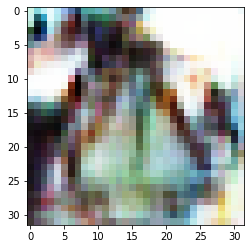

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


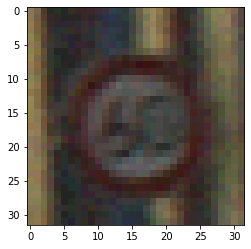

생성 이미지 shape : (1, 3, 32, 32)


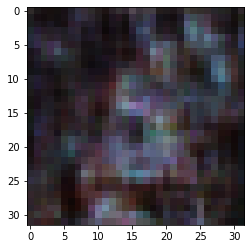

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


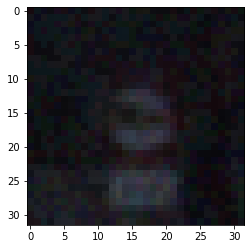

생성 이미지 shape : (1, 3, 32, 32)


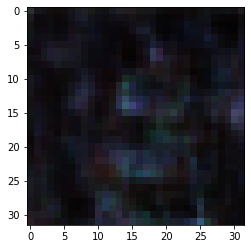

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


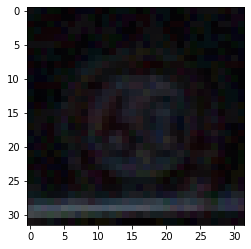

생성 이미지 shape : (1, 3, 32, 32)


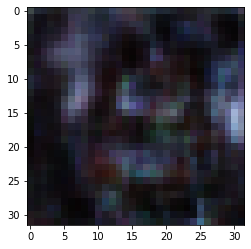

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


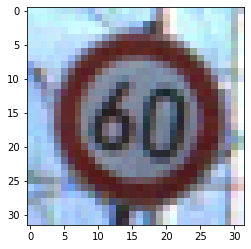

생성 이미지 shape : (1, 3, 32, 32)


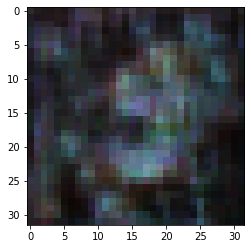

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


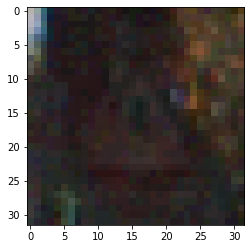

생성 이미지 shape : (1, 3, 32, 32)


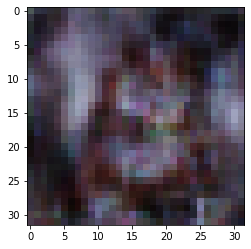

원래 예측값 :  [2]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


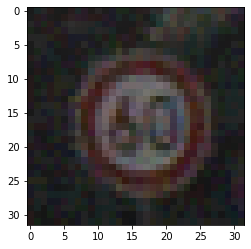

생성 이미지 shape : (1, 3, 32, 32)


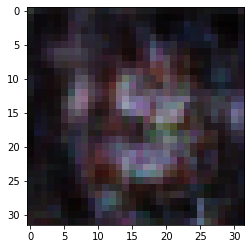

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


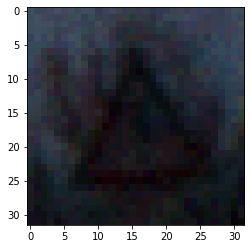

생성 이미지 shape : (1, 3, 32, 32)


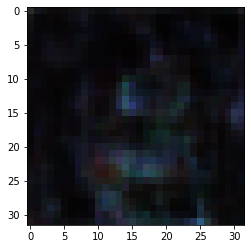

원래 예측값 :  [2]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


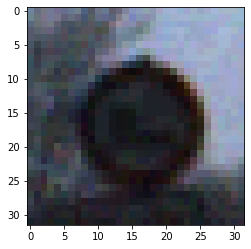

생성 이미지 shape : (1, 3, 32, 32)


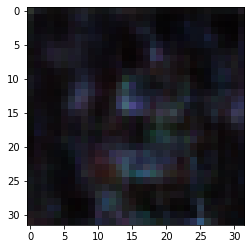

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


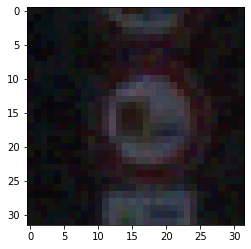

생성 이미지 shape : (1, 3, 32, 32)


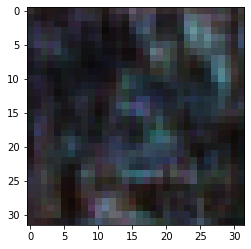

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


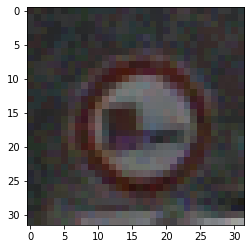

생성 이미지 shape : (1, 3, 32, 32)


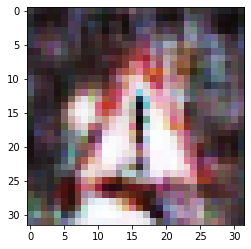

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


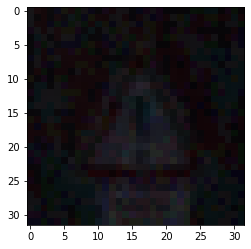

생성 이미지 shape : (1, 3, 32, 32)


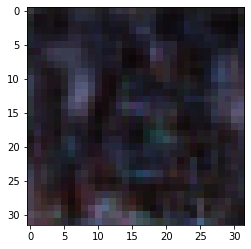

원래 예측값 :  [2]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


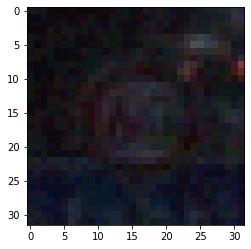

생성 이미지 shape : (1, 3, 32, 32)


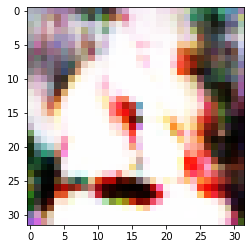

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


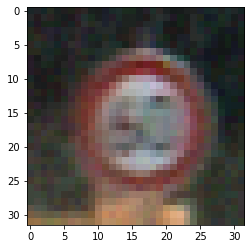

생성 이미지 shape : (1, 3, 32, 32)


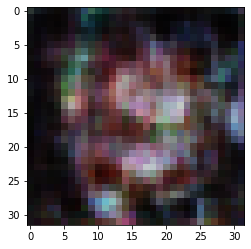

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


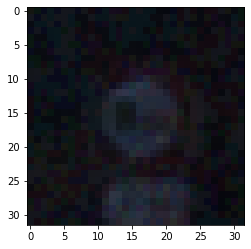

생성 이미지 shape : (1, 3, 32, 32)


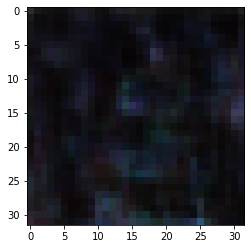

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


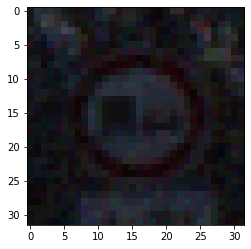

생성 이미지 shape : (1, 3, 32, 32)


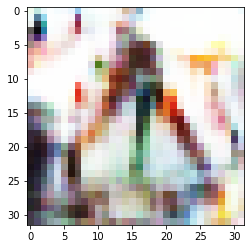

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


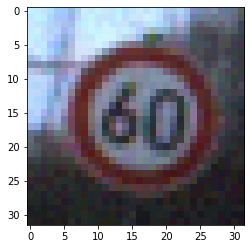

생성 이미지 shape : (1, 3, 32, 32)


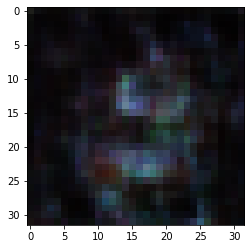

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


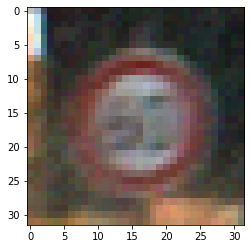

생성 이미지 shape : (1, 3, 32, 32)


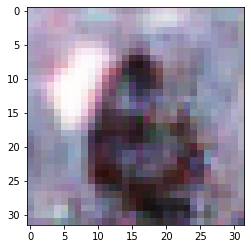

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


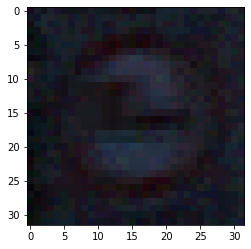

생성 이미지 shape : (1, 3, 32, 32)


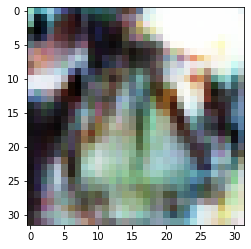

원래 예측값 :  [1]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


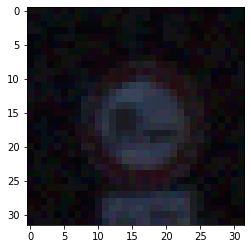

생성 이미지 shape : (1, 3, 32, 32)


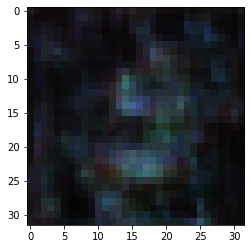

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


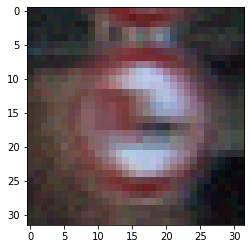

생성 이미지 shape : (1, 3, 32, 32)


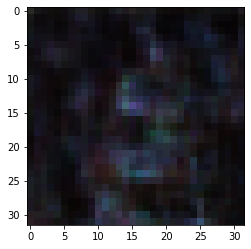

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


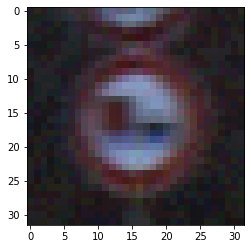

생성 이미지 shape : (1, 3, 32, 32)


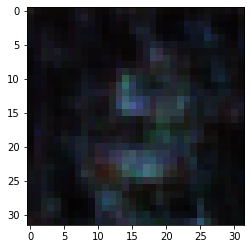

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


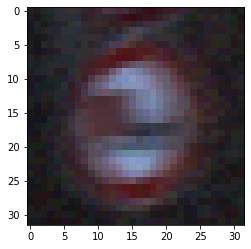

생성 이미지 shape : (1, 3, 32, 32)


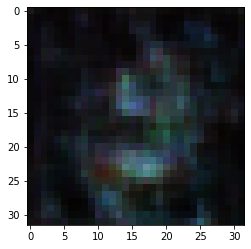

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


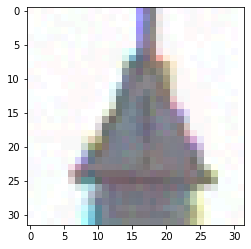

생성 이미지 shape : (1, 3, 32, 32)


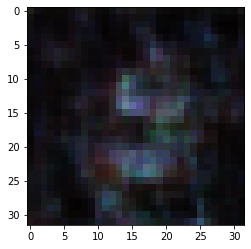

원래 예측값 :  [2]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


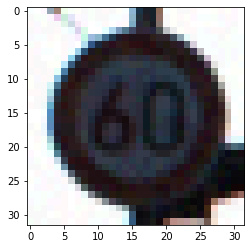

생성 이미지 shape : (1, 3, 32, 32)


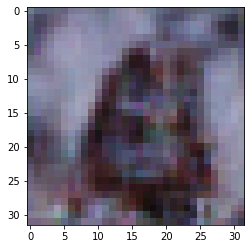

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


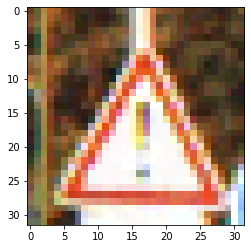

생성 이미지 shape : (1, 3, 32, 32)


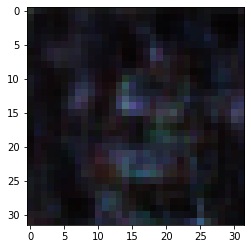

원래 예측값 :  [2]
공격 받은 예측 값 : 2
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


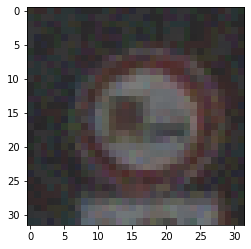

생성 이미지 shape : (1, 3, 32, 32)


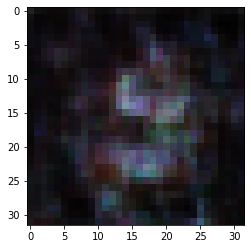

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


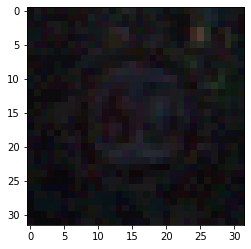

생성 이미지 shape : (1, 3, 32, 32)


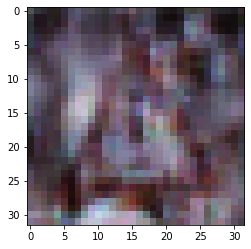

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


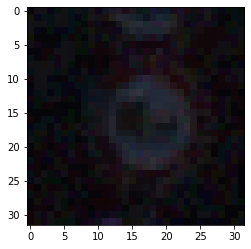

생성 이미지 shape : (1, 3, 32, 32)


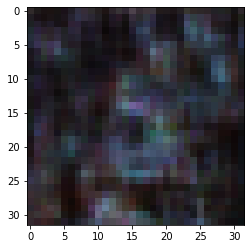

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


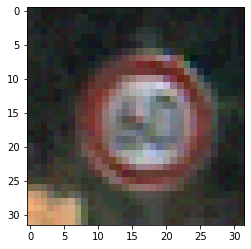

생성 이미지 shape : (1, 3, 32, 32)


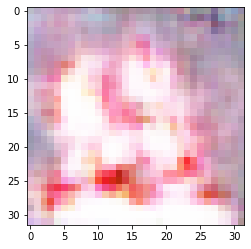

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


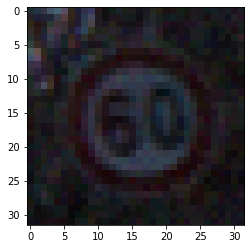

생성 이미지 shape : (1, 3, 32, 32)


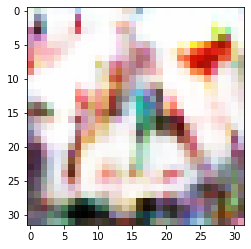

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 2
Working...!
변형 이미지 shape : (1, 3, 32, 32)


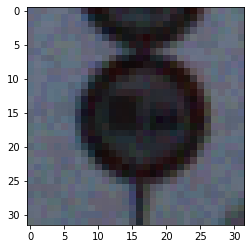

생성 이미지 shape : (1, 3, 32, 32)


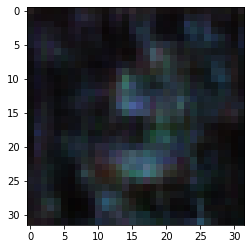

원래 예측값 :  [1]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


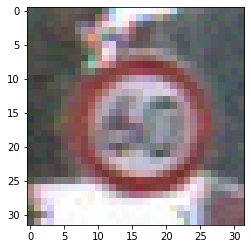

생성 이미지 shape : (1, 3, 32, 32)


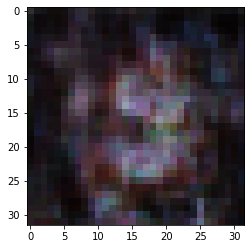

원래 예측값 :  [0]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


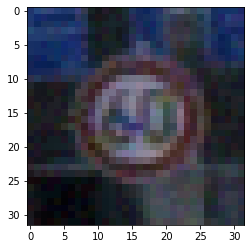

생성 이미지 shape : (1, 3, 32, 32)


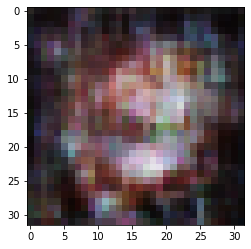

원래 예측값 :  [0]
공격 받은 예측 값 : 0
방어 모델 예측 값 : 1
Working...!
변형 이미지 shape : (1, 3, 32, 32)


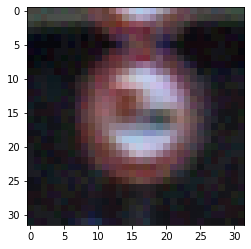

생성 이미지 shape : (1, 3, 32, 32)


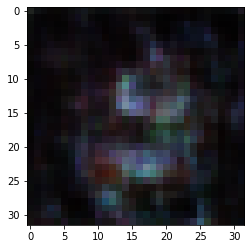

원래 예측값 :  [1]
공격 받은 예측 값 : 1
방어 모델 예측 값 : 1
Working...!
Epsilon: 0.02	Test Accuracy = 42 / 100 = 0.42
Epsilon: 0.02	Defense Accuracy = 41 / 100 = 0.41


In [ ]:
accuracies = []
examples = []
accuracies_df = []
examples_df = []

eps = 0.02

acc, ex, acc_df, ex_df = test(trainer, x_test[:100], t_test[:100], eps)
accuracies.append(acc)
examples.append(ex)
accuracies_df.append(acc_df)
examples_df.append(ex_df)

--> 동작 시간 자체는 확실히 줄어드는데 gan 자체 성능을 제대로 활용하지 못해 방어 성능이 잘 나오지 않는 듯 하다.